In [5]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.colors as mcolors
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.cm import viridis
import matplotlib as mpl
from scipy.signal import savgol_filter
from scipy.optimize import curve_fit
from scipy.interpolate import interp1d
import scipy.stats as stats
import decentplots

conc_correction = {
    0: 0,      
    0.5: 0.3,  
    1.0: 0.6,
    1.4: 0.8,
    1.8: 1.1,
    3.6: 2.1,
    5.4: 3.2,
    7.1: 4.2, 
    9.0: 5.4,
    12.5: 7.5,
    18.0: 10.8
}

In [2]:
def compare_first_last(data_df, alpha=0.05, paired=False, plot=False):
    """
    Compare the first and last datapoints in a distribution using appropriate statistical tests.
    
    Parameters:
    -----------
    data_df : pandas DataFrame
        DataFrame with concentrations/times as index and replicates as columns
    alpha : float
        Significance level (default: 0.05)
    paired : bool
        Whether the data is paired (default: False)
    plot : bool
        Whether to generate a box plot of the data (default: True)
    
    Returns:
    --------
    dict
        Dictionary with test results
    """
    # Get first and last values (ignoring NaN)
    first_idx = data_df.index[0]
    last_idx = data_df.index[-1]
    
    first_values = data_df.loc[first_idx].dropna().values
    last_values = data_df.loc[last_idx].dropna().values
    
    # Check sample size
    n_first = len(first_values)
    n_last = len(last_values)
    
    print(f"Comparing {first_idx} (n={n_first}) vs {last_idx} (n={n_last})")
    print(f"First values: {first_values}")
    print(f"Last values: {last_values}")
    
    # Check for normality if sample size allows
    normal_first = True
    normal_last = True
    
    if n_first >= 3:  # Shapiro-Wilk needs at least 3 samples
        _, p_norm_first = stats.shapiro(first_values)
        normal_first = p_norm_first > alpha
        print(f"First group normality test p-value: {p_norm_first:.4f} - {'Normal' if normal_first else 'Non-normal'}")
    
    if n_last >= 3:
        _, p_norm_last = stats.shapiro(last_values)
        normal_last = p_norm_last > alpha
        print(f"Last group normality test p-value: {p_norm_last:.4f} - {'Normal' if normal_last else 'Non-normal'}")
    
    # Choose appropriate test
    if paired:
        # Ensure equal lengths for paired test
        min_len = min(n_first, n_last)
        first_values = first_values[:min_len]
        last_values = last_values[:min_len]
        
        if normal_first and normal_last:
            # Paired t-test for normal data
            stat, p_value = stats.ttest_rel(first_values, last_values)
            test_name = "Paired t-test"
        else:
            # Wilcoxon signed-rank test for non-normal data
            stat, p_value = stats.wilcoxon(first_values, last_values)
            test_name = "Wilcoxon signed-rank test"
    else:
        if normal_first and normal_last:
            # Independent t-test for normal data
            stat, p_value = stats.ttest_ind(first_values, last_values, equal_var=False)
            test_name = "Welch's t-test"
        else:
            # Mann-Whitney U test for non-normal data
            stat, p_value = stats.mannwhitneyu(first_values, last_values)
            test_name = "Mann-Whitney U test"
    
    # Plot the data
    if plot and n_first > 0 and n_last > 0:
        plt.figure(figsize=(8, 6))
        box_data = [first_values, last_values]
        box_labels = [f'{first_idx}', f'{last_idx}']
        
        plt.boxplot(box_data, labels=box_labels)
        plt.scatter([1] * n_first, first_values, alpha=0.7, color='blue')
        plt.scatter([2] * n_last, last_values, alpha=0.7, color='orange')
        
        # Add means
        plt.scatter(1, np.mean(first_values), marker='D', s=100, color='red', label='Mean')
        plt.scatter(2, np.mean(last_values), marker='D', s=100, color='red')
        
        plt.title(f'Comparison of First and Last Values\n{test_name}: p={p_value:.4f}')
        plt.ylabel('Value')
        plt.grid(alpha=0.3)
        plt.legend()
        plt.tight_layout()
        plt.show()
    
    # Format results
    result = {
        "test": test_name,
        "statistic": stat,
        "p_value": p_value,
        "significant": p_value < alpha,
        "first_mean": np.mean(first_values),
        "last_mean": np.mean(last_values),
        "first_std": np.std(first_values),
        "last_std": np.std(last_values),
        "mean_difference": np.mean(last_values) - np.mean(first_values),
        "n_first": n_first,
        "n_last": n_last
    }
    
    # Print conclusion
    if p_value < alpha:
        print(f"SIGNIFICANT DIFFERENCE (p={p_value:.4f}): {test_name} indicates the values at {first_idx} and {last_idx} are significantly different.")
    else:
        print(f"No significant difference (p={p_value:.4f}): {test_name} indicates no significant difference between {first_idx} and {last_idx}.")
    
    return result

# steady state fluoresence

In [ ]:
l12 = [
    pd.read_excel("data/240425.xlsx", sheet_name=None),
    {sheetname.replace("12",""):sheet for sheetname, sheet in pd.read_excel("data/2904.xlsx", sheet_name=None).items() if sheetname.startswith("12")},
    {sheetname.replace("12",""):sheet for sheetname, sheet in pd.read_excel("data/3004.xlsx", sheet_name=None).items() if sheetname.startswith("12")},
    {sheetname.replace("12",""):sheet for sheetname, sheet in pd.read_excel("data/0605.xlsx", sheet_name=None).items() if sheetname.startswith("12")}
]
l14 = [
    pd.read_excel("data/160425_justdata.xlsx", sheet_name=None),
    {sheetname.replace("14",""):sheet for sheetname, sheet in pd.read_excel("data/2904.xlsx", sheet_name=None).items() if sheetname.startswith("14")},
    {sheetname.replace("14",""):sheet for sheetname, sheet in pd.read_excel("data/3004.xlsx", sheet_name=None).items() if sheetname.startswith("14")},
    {sheetname.replace("14",""):sheet for sheetname, sheet in pd.read_excel("data/0605.xlsx", sheet_name=None).items() if sheetname.startswith("14")}
]



In [16]:
concentrations = [0.5, 1, 1.4, 1.8, 3.6, 5.4, 7.1, 9, 12.5, 18, 0]
sorted_conc = sorted(concentrations)

# Create a custom purple-to-blue colormap
colors = [(0.4, 0, 0.6), (0, 0.4, 1.0)]  # Dark purple to bright blue
cmap = LinearSegmentedColormap.from_list('purple_blue', colors, N=len(sorted_conc))

# Create a dictionary mapping each concentration to a color
#color_dict = {conc: cmap(i/(len(sorted_conc)-1)) for i, conc in enumerate(sorted_conc)}
color_dict = {conc: viridis(i/(len(sorted_conc)-1)) for i, conc in enumerate([conc_correction[c] for c in sorted_conc])}

def plotandReturnWL(sheetname, wavelength=100, ylim=(0,0.5e6), lipid="l12"):
    lip = l12 if lipid=="l12" else l14
    data = [lip[i][sheetname] for i in range(4)]
    for d in data: d.index = d["Unnamed: 0"]
    for i,d in enumerate(data):
        if "rc" in d.columns:
            rc_df = d.iloc[:,d.columns.get_loc("rc")+1:]
            rc_df.columns = [float(str(col).split(".1")[0]) for col in rc_df.columns]
            data[i] = d.iloc[:, :d.columns.get_loc("rc")] / rc_df

    fig = plt.figure(figsize=(15,6))
    ax = fig.add_subplot(111)

    wavelength_data = {}
    
    # Plot each dataset's concentrations with consistent colors
    for d_idx, d in enumerate(data):
        for col in d.columns:
            # Convert column name to float if it's one of our concentrations
            try:
                col_value = float(col)
                if col_value in concentrations:
                    processed_data = d[col]
                    # Use corrected concentration for labeling
                    corrected_conc = conc_correction[col_value]
                    ax.plot(d.index, processed_data, color=color_dict[corrected_conc], 
                            label=f"{corrected_conc} μM (Dataset {d_idx+1})", lw=1)
                    
                    if corrected_conc not in wavelength_data:
                        wavelength_data[corrected_conc] = [None] * len(data)
                    wavelength_data[corrected_conc][d_idx] = processed_data.loc[wavelength]
            except (ValueError, TypeError):
                print("ex!!", col, d_idx)
                pass
    
    ax.set_ylim(*ylim)
    ax.set_xlim(d.index[0],d.index[-1])
    ax.axvline(x=wavelength, color='gray', linestyle='--', alpha=0.5)
    #plt.legend()

    sorted_concs = sorted([conc_correction[c] for c in concentrations if c > 0])  # Skip 0 for color mapping
    cmap = mpl.colors.ListedColormap([color_dict[c] for c in sorted_concs])
    
    # Create discrete bounds
    bounds = np.concatenate(([sorted_concs[0] - 0.25], 
                            [(sorted_concs[i] + sorted_concs[i+1])/2 for i in range(len(sorted_concs)-1)],
                            [sorted_concs[-1] + 0.25]))
    
    norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
    sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)
    sm.set_array([])  # Empty array needed for scalar mappable
    
    # Add colorbar with corrected concentration labels
    cbar = plt.colorbar(sm, ax=ax, ticks=sorted_concs)
    cbar.set_ticklabels([f"{c}" for c in sorted_concs])
    cbar.set_label('Concentration (μM)')

    ax.minorticks_on()
    ax.grid(which="both",axis="both", alpha=0.5, ls=":")
    plt.title(f"{lipid}, {sheetname}")
    plt.show()

    return wavelength_data

ex!! Unnamed: 0 0
ex!! Unnamed: 0 1
ex!! Unnamed: 0 2
ex!! Unnamed: 0 3


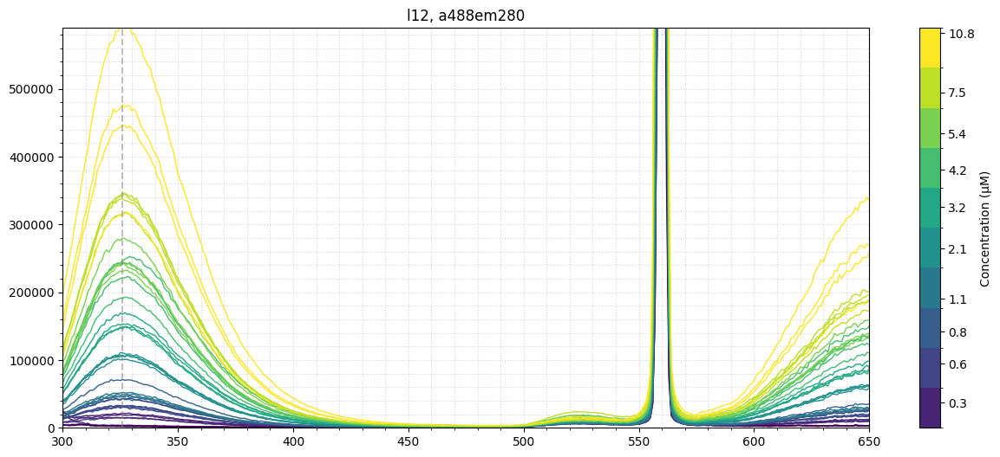

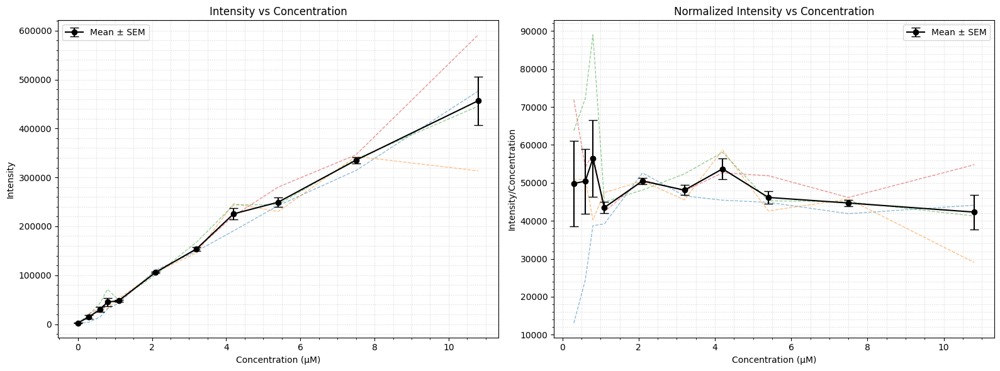

ex!! Unnamed: 0 0
ex!! Unnamed: 0 1
ex!! Unnamed: 0 2
ex!! Unnamed: 0 3


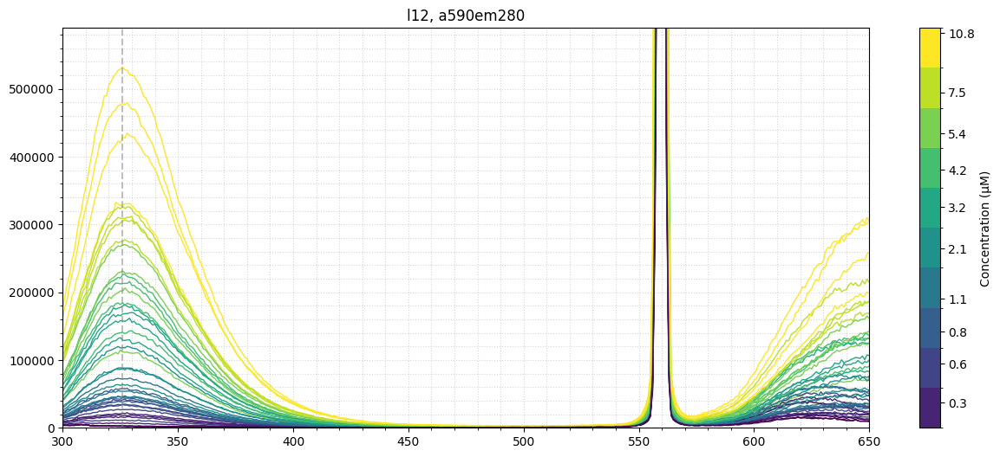

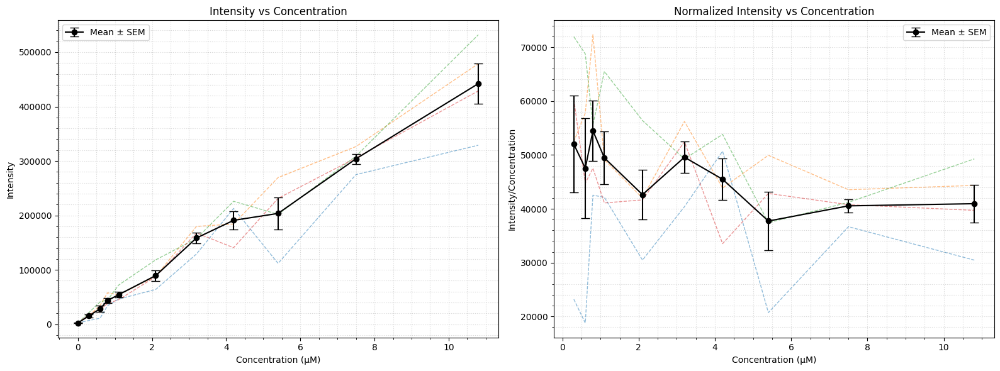

ex!! Unnamed: 0 0
ex!! Unnamed: 0 1
ex!! Unnamed: 0 2
ex!! Unnamed: 0 3


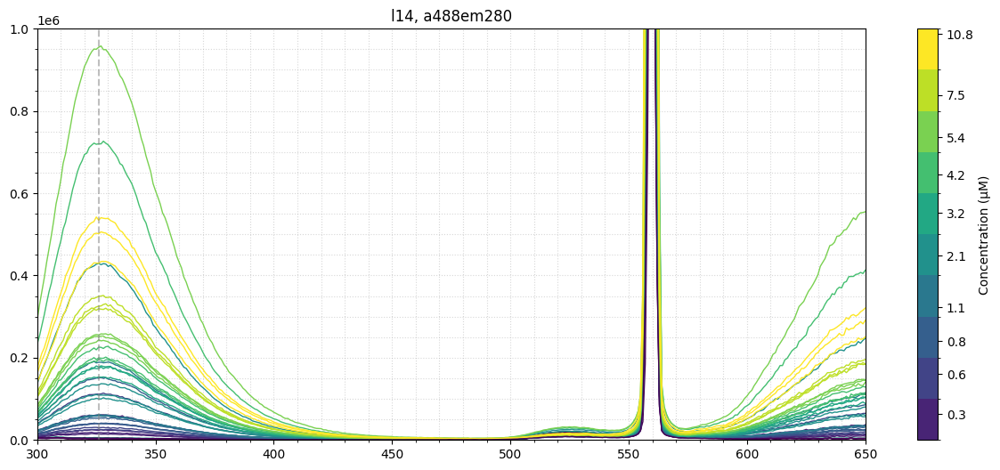

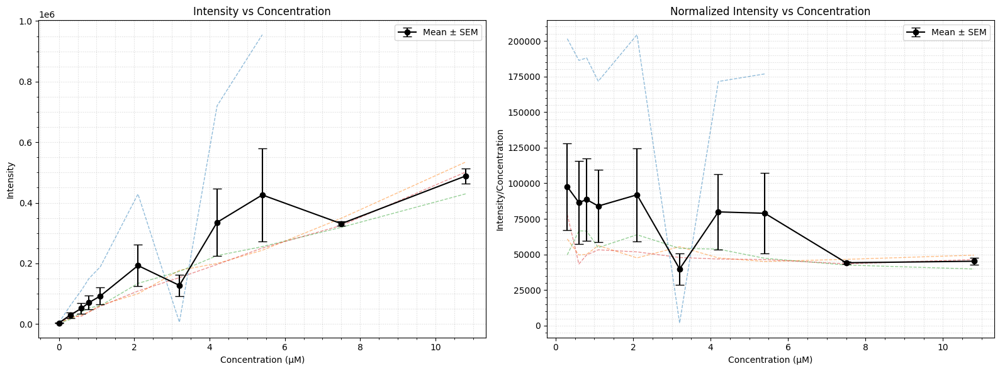

ex!! Unnamed: 0 0
ex!! Unnamed: 0 1
ex!! Unnamed: 0 2
ex!! Unnamed: 0 3


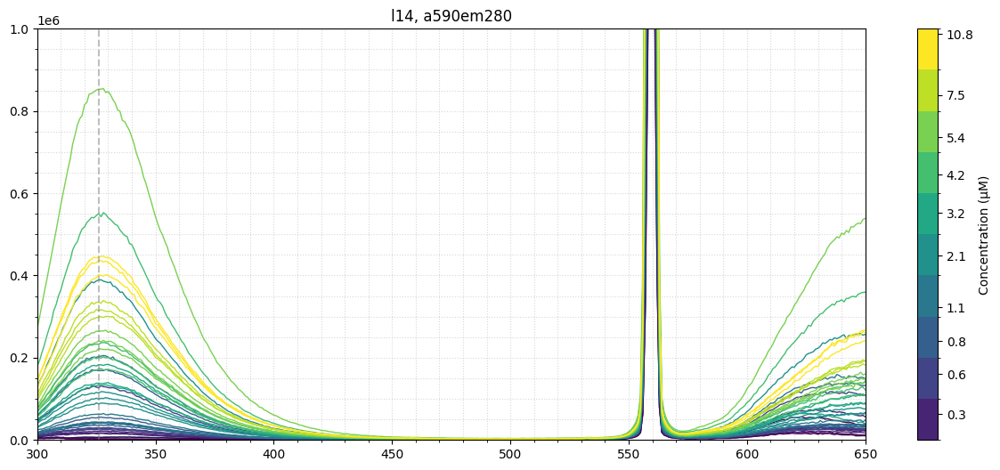

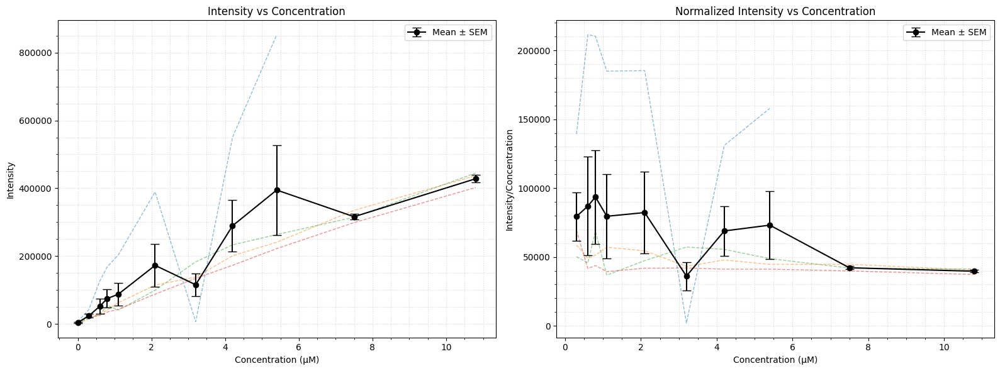

In [17]:
for l,ylim in zip(["l12","l14"],[(0,5.9e5),(0,10e5)]):
    for sheet in ['a488em280','a590em280']:
        wls = plotandReturnWL(sheet, wavelength=326, ylim=ylim, lipid=l)
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

        # Original plot (left subplot)
        wls_df = pd.DataFrame().from_dict(wls).T.sort_index()
        #print(wls_df)
        ax1.plot(wls_df, alpha=0.5, ls="--", lw=1)
        mean = np.nanmean(wls_df, axis=1)
        std = np.nanstd(wls_df, axis=1)
        n = np.sum(~np.isnan(wls_df), axis=1)
        sem = std / np.sqrt(n)

        # Plot mean with error bars showing standard deviation
        ax1.errorbar(wls_df.index, mean, yerr=sem, color="black", 
                    capsize=5, marker='o', 
                    markersize=6, linewidth=1.5, label="Mean ± SEM")
        ax1.set_xlabel('Concentration (μM)')
        ax1.set_ylabel('Intensity')
        ax1.set_title('Intensity vs Concentration')
        ax1.legend()

        # Normalized plot (right subplot)
        # Create a copy with values divided by concentration (exclude 0 concentration)
        wls_norm_df = wls_df.copy()
        for conc in wls_norm_df.index:
            if conc > 0:  # Skip division for concentration = 0
                wls_norm_df.loc[conc] = wls_norm_df.loc[conc] / conc

        # Remove 0 concentration row (can't divide by zero)
        if 0 in wls_norm_df.index:
            wls_norm_df = wls_norm_df.drop(0)

        # Plot normalized data
        ax2.plot(wls_norm_df, alpha=0.5, ls="--", lw=1)
        norm_mean = np.nanmean(wls_norm_df, axis=1)
        norm_std = np.nanstd(wls_norm_df, axis=1)
        n_norm = np.sum(~np.isnan(wls_norm_df), axis=1)
        sem_norm = norm_std / np.sqrt(n_norm)

        # Plot normalized mean with error bars
        ax2.errorbar(wls_norm_df.index, norm_mean, yerr=sem_norm, color="black", 
                    capsize=5, marker='o', 
                    markersize=6, linewidth=1.5, label="Mean ± SEM")
        ax2.set_xlabel('Concentration (μM)')
        ax2.set_ylabel('Intensity/Concentration')
        ax2.set_title('Normalized Intensity vs Concentration')
        ax2.legend()

        ax1.minorticks_on()
        ax1.grid(which="both",axis="both", alpha=0.5, ls=":")
        ax2.minorticks_on()
        ax2.grid(which="both",axis="both", alpha=0.5, ls=":")

        plt.tight_layout()
        plt.show()

        # Print statistics for the normalized data
        #print("\nNormalized Values (Intensity/Concentration):")
        #print(wls_norm_df)
        #print("\nMean of Normalized Values:")
        #print(norm_mean)


ex!! Unnamed: 0 0
ex!! Unnamed: 0 1
ex!! Unnamed: 0 2
ex!! Unnamed: 0 3


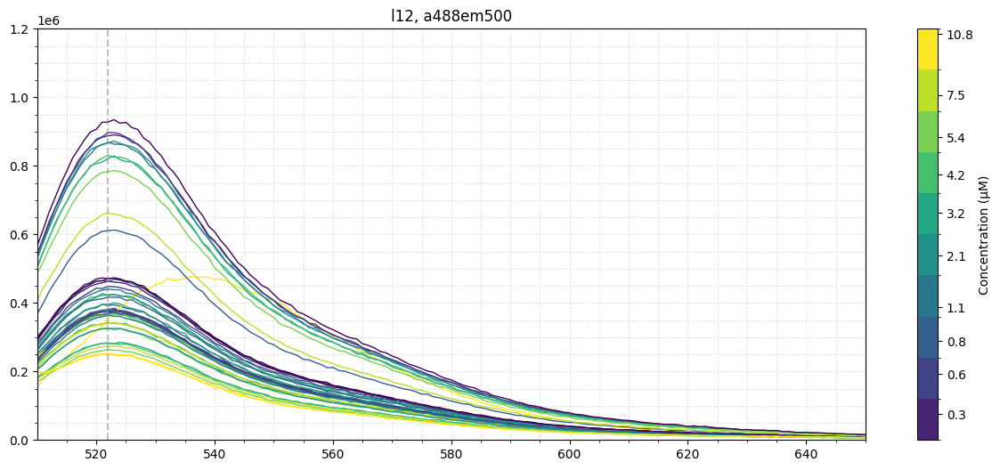

                 0             1             2             3
0.0   470571.66687  927954.73255  471485.06660           NaN
0.3   370491.27370  887713.16168  463539.23144  374078.03855
0.6   381051.06587  897292.71998  448189.66012  373706.73784
0.8   392442.57163  610826.79678  416992.97453  368300.59952
1.1   377932.13991  868643.15726  440251.25095  364543.03634
2.1   462425.32931  867128.25036  422042.66417  325407.94158
3.2   342665.99855  821539.94928  396066.46655  283517.79557
4.2   423906.59373  830399.18420  369176.86919  281089.48893
5.4   325927.76258  783266.27217  362545.43852  263578.94748
7.5   339933.22533  661672.71591  340542.15849  272393.62632
10.8  354687.39051  370884.85245  251979.51332  248058.57783
Comparing 0.0 (n=3) vs 10.8 (n=4)
First values: [470571.66687 927954.73255 471485.0666 ]
Last values: [354687.39051 370884.85245 251979.51332 248058.57783]
First group normality test p-value: 0.0033 - Non-normal
Last group normality test p-value: 0.1047 - Normal
No si

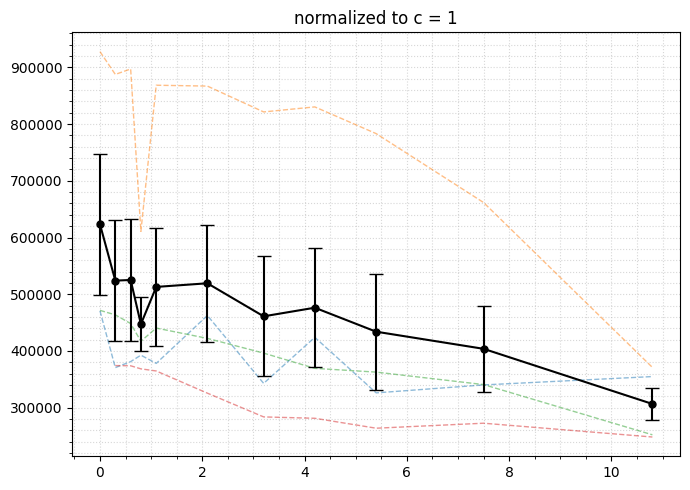

ex!! Unnamed: 0 0
ex!! Unnamed: 0 1
ex!! Unnamed: 0 2
ex!! Unnamed: 0 3


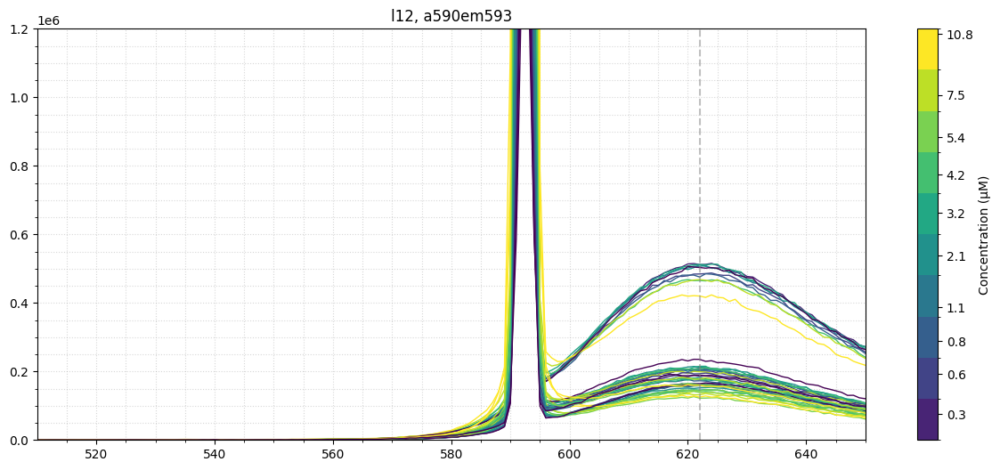

                 0             1             2             3
0.0   235281.36882  503229.18629  164105.07907  188402.28179
0.3   205423.51846  511956.57563  162559.40752  186913.15920
0.6   200899.60173  484398.38294  163539.58948  193265.49227
0.8   210286.72893  475482.49707  160429.39673  172738.22014
1.1   203613.95177  506640.97348  158016.64115  177997.27333
2.1   212567.53694  511315.68743  152116.69976  183180.92791
3.2   215017.99183  511918.87633  145519.32120  176281.95491
4.2   207911.67265  465397.93271  144784.18474  177167.88860
5.4   122013.80391  138771.14543  142974.61805  160919.48771
7.5   198901.53852  468074.58344  131815.62347  177884.17541
10.8  139166.98814  420007.96827  125293.64353  159731.95957
Comparing 0.0 (n=4) vs 10.8 (n=4)
First values: [235281.36882 503229.18629 164105.07907 188402.28179]
Last values: [139166.98814 420007.96827 125293.64353 159731.95957]
First group normality test p-value: 0.0854 - Normal
Last group normality test p-value: 0.0200 - Non

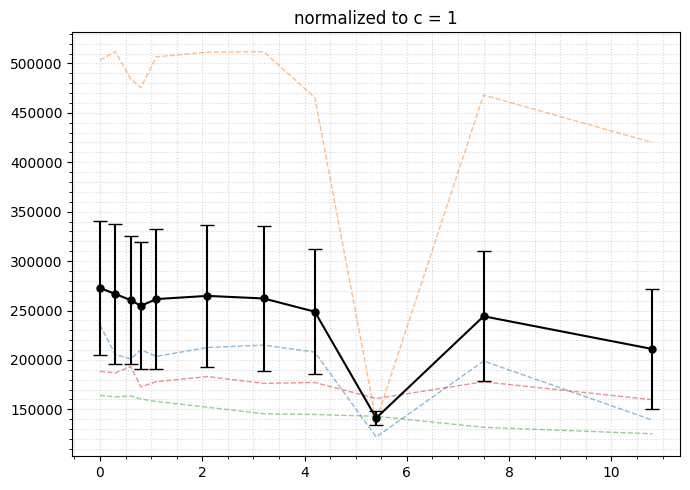

ex!! Unnamed: 0 0
ex!! Unnamed: 0 1
ex!! Unnamed: 0 2
ex!! Unnamed: 0 3


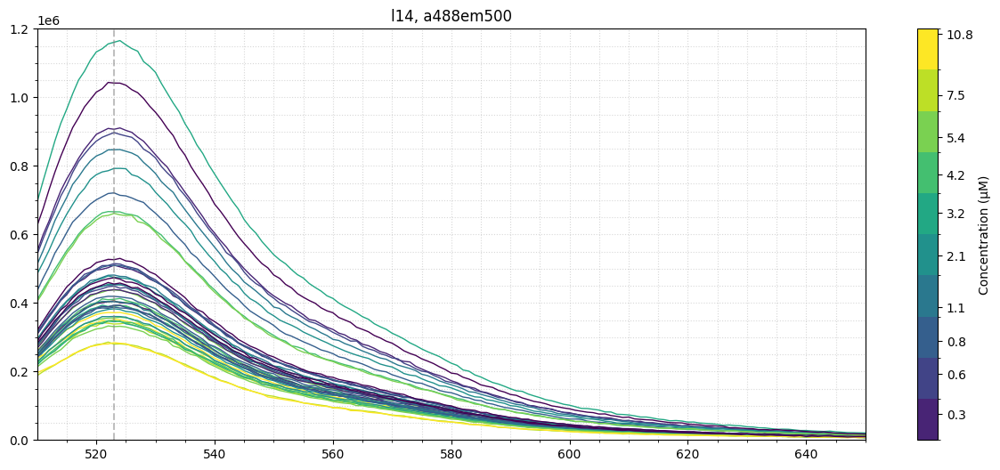

                 0             1             2             3
0.0   1.041450e+06  526091.14153  473479.78255  454989.85678
0.3   9.066125e+05  510078.01279  438759.72769  405723.29619
0.6   8.971617e+05  514642.50276  448981.19210  392695.79285
0.8   7.209799e+05  509112.73540  419109.97251  387600.02618
1.1   8.470870e+05  481314.24320  452415.78380  403358.74073
2.1   7.924254e+05  474706.95690  382736.22539  360355.25899
3.2   1.160580e+06  454451.09731  392718.24116  344948.23465
4.2   6.658768e+05  410639.47637  389859.82285  348599.82663
5.4   6.612375e+05  437674.72598  356187.35586  330813.28128
7.5            NaN  406224.64181  338243.67233  279728.40747
10.8           NaN  371302.55215  351914.69393  283873.86229
Comparing 0.0 (n=4) vs 10.8 (n=3)
First values: [1041450.       526091.14153  473479.78255  454989.85678]
Last values: [371302.55215 351914.69393 283873.86229]
First group normality test p-value: 0.0201 - Non-normal
Last group normality test p-value: 0.4063 - Normal
N

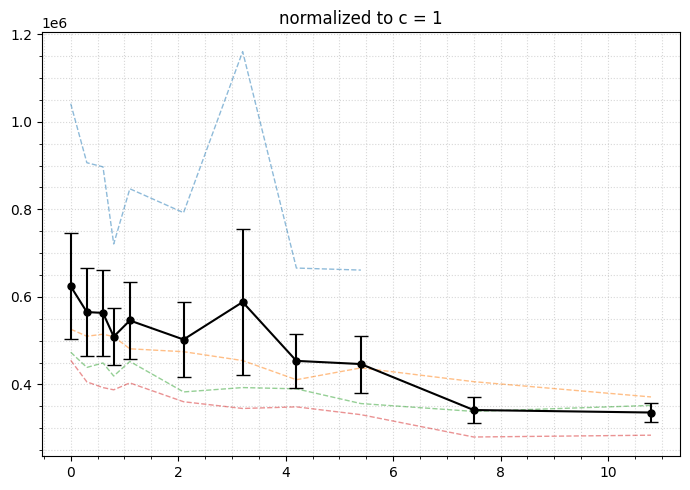

ex!! Unnamed: 0 0
ex!! Unnamed: 0 1
ex!! Unnamed: 0 2
ex!! Unnamed: 0 3


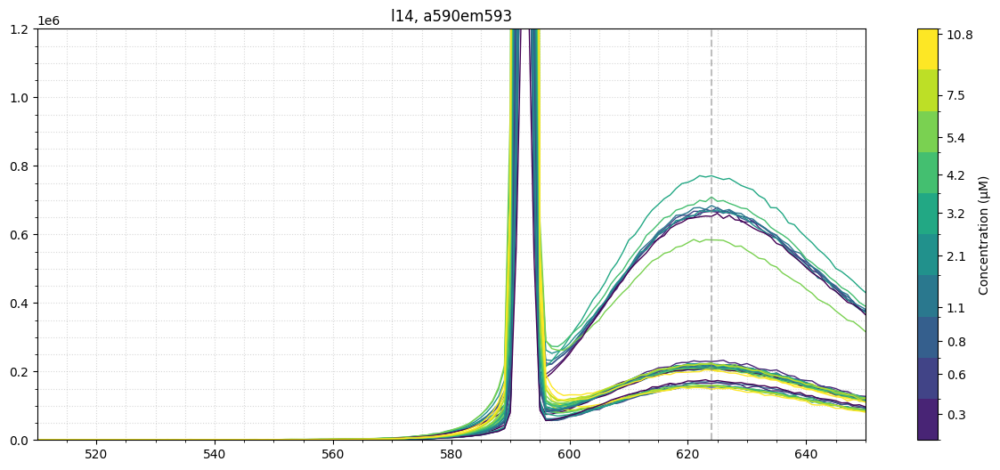

                 0             1             2             3
0.0   652454.27638  205692.25187  170411.39100           NaN
0.3   667165.91207  214198.32244  165617.06032  228832.63021
0.6   668403.15869  209983.95111  154056.53714  215628.88885
0.8   666682.61260  211453.18148  172247.92897  221950.44584
1.1   684178.05320  218277.36992  156453.70248  216440.83195
2.1   667320.56790  216479.49591  156569.69435  213811.68287
3.2   770997.96891  207296.80609  158444.89627  221312.49055
4.2   709077.64158  216034.86040  158309.57242  208302.06898
5.4   583729.09260  213367.04736  159662.81092  225333.54209
7.5            NaN  209210.67197  158502.89221  221525.14231
10.8           NaN  204667.65701  148179.61566  203991.03776
Comparing 0.0 (n=3) vs 10.8 (n=3)
First values: [652454.27638 205692.25187 170411.391  ]
Last values: [204667.65701 148179.61566 203991.03776]
First group normality test p-value: 0.1255 - Normal
Last group normality test p-value: 0.0199 - Non-normal
No significant dif

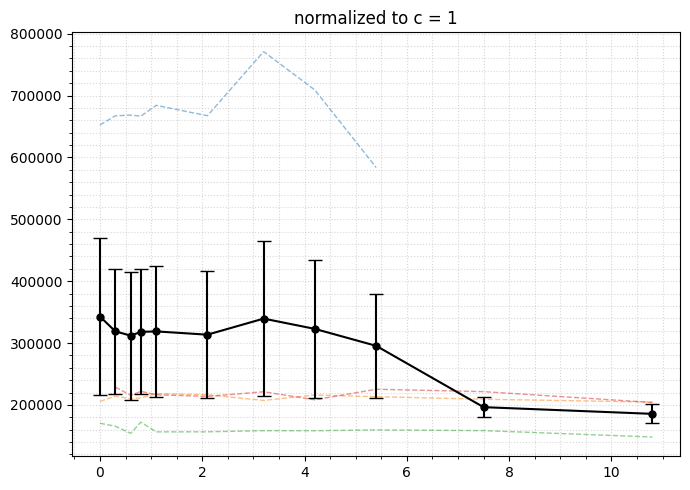

In [18]:
from scipy import stats
import numpy as np
import matplotlib.pyplot as plt



# Example usage:
# Compare first and last concentration in your normalized dataframe
# result = compare_first_last(wls_norm_df)

# For specific pair comparison (e.g., 0 mM vs 18 mM) when they're not first/last:
# specific_concs = wls_df.loc[[0, 18]]  # Select rows for 0 mM and 18 mM
# result = compare_first_last(specific_concs)
for l,peaks in zip(["l12","l14"],[[522,622],[523,624]]):
    for sheet, wl in zip(['a488em500','a590em593'],peaks):
        wls = plotandReturnWL(sheet, wavelength=wl, ylim=(0,12e5), lipid=l)
        wls_df = pd.DataFrame().from_dict(wls).T.sort_index()
        print(wls_df)
        wls_norm_df = wls_df.copy()
        if 1 in wls_norm_df.index:
            # For each column, normalize to the value at 1 mM
            for col in wls_norm_df.columns:
                if not pd.isna(wls_norm_df.loc[1, col]) and wls_norm_df.loc[1, col] != 0:
                    wls_norm_df[col] = wls_norm_df[col] / wls_norm_df.loc[1, col]
                else:
                    # Handle case where 1 mM value is NA or zero
                    print(f"Warning: Can't normalize column {col}, value at 1 mM is {wls_norm_df.loc[1, col]}")
        fig = plt.figure(figsize=(7,5))
        ax = fig.add_subplot(111)
        ax.plot(wls_norm_df, ls="--", lw=1, alpha=0.5)
        norm_mean = np.nanmean(wls_norm_df, axis=1)
        norm_std = np.nanstd(wls_norm_df, axis=1)
        n = np.sum(~np.isnan(wls_norm_df), axis=1)
        norm_sem = norm_std / np.sqrt(n)
        norm_mean = pd.Series(norm_mean, index=wls_norm_df.index)
        norm_sem = pd.Series(norm_sem, index=wls_norm_df.index)
        test_result = compare_first_last(wls_norm_df)
        print(test_result)

        # Plot normalized mean with error bars
        ax.errorbar(wls_norm_df.index, norm_mean, yerr=norm_sem, color="black", 
                    capsize=5, marker='o', 
                    markersize=5, linewidth=1.5, label="Mean ± SEM")
        
        last_idx = wls_norm_df.index[-1]
        if test_result["significant"]:
            # Position the star slightly above the error bar
            y_pos = norm_mean[last_idx] + norm_sem[last_idx] + (norm_mean.max() * 0.05)
            ax.text(last_idx, y_pos, '*', fontsize=20, ha='center', va='bottom')
            # Add a text annotation explaining the significance
            ax.text(last_idx, y_pos, 
                    f"\n\np={test_result['p_value']:.4f}", 
                    fontsize=9, ha='center', va='bottom')
            
        ax.minorticks_on()
        ax.grid(which="both",axis="both", alpha=0.5, ls=":")
        ax.set_title("normalized to c = 1")
        plt.tight_layout()
        plt.show()


ex!! Unnamed: 0 0
ex!! Unnamed: 12 0
ex!! Unnamed: 13 0
ex!! Unnamed: 14 0
ex!! Unnamed: 0 1
ex!! Unnamed: 12 1
ex!! Unnamed: 13 1
ex!! Unnamed: 0 2
ex!! Unnamed: 12 2
ex!! Unnamed: 13 2
ex!! Unnamed: 0 3
ex!! Unnamed: 12 3
ex!! Unnamed: 13 3


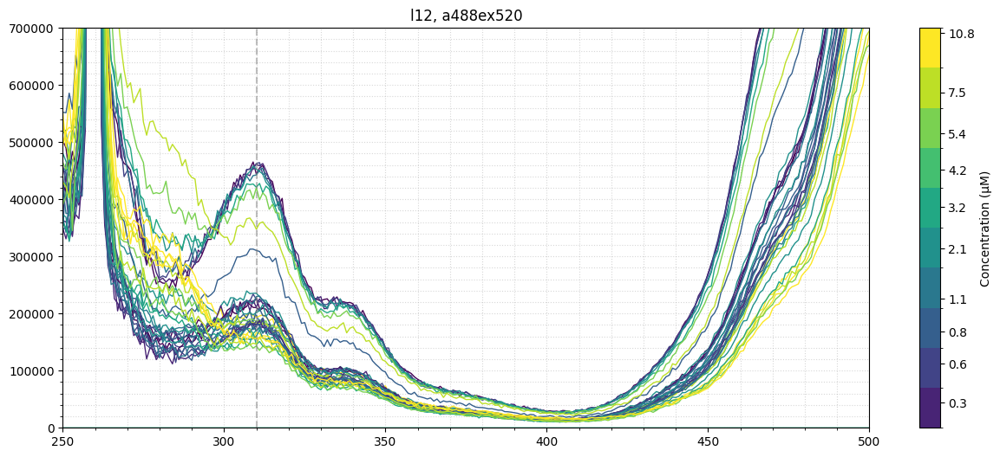

                  0              1              2              3
0.0   210420.230279  444276.700190  227205.924789            NaN
0.3   169397.590642  461111.029556  211102.372484  180789.055934
0.6   176254.159772  462678.892940  225158.918460  186849.087179
0.8   197460.928976  310457.065935  205155.532337  179910.603646
1.1   180818.303247  442717.882711  229899.740579  169587.366796
2.1   235651.108930  452811.458299  201952.014560  160198.079322
3.2   170724.607379  421140.844194       1.017027  145899.512877
4.2             NaN            NaN            NaN            NaN
5.4             NaN  420267.208755  185887.698135  143278.221685
7.5             NaN  347598.270049  183959.625787  146618.584773
10.8  166793.192840  193130.858969  154795.173022  157334.428922


C:\Users\Sasch\AppData\Local\Temp\ipykernel_30788\1648489575.py:19: RuntimeWarning: Mean of empty slice
  norm_mean = np.nanmean(wls_norm_df, axis=1)
c:\Users\Sasch\AppData\Local\Programs\Python\Python311\Lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


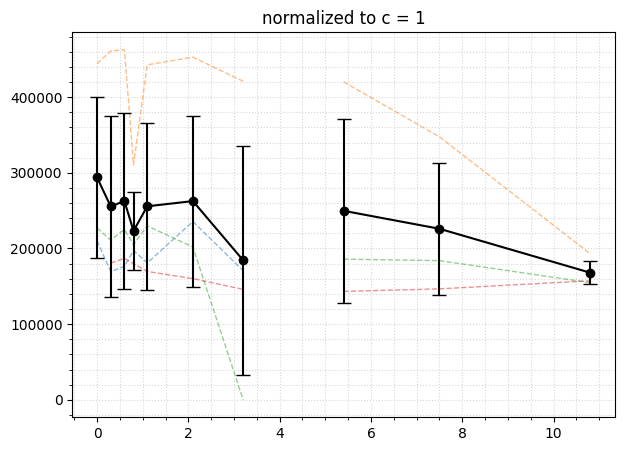

ex!! Unnamed: 0 0
ex!! Unnamed: 12 0
ex!! Unnamed: 13 0
ex!! Unnamed: 14 0
ex!! Unnamed: 15 0
ex!! Unnamed: 0 1
ex!! Unnamed: 12 1
ex!! Unnamed: 13 1
ex!! Unnamed: 14 1
ex!! Unnamed: 15 1
ex!! Unnamed: 0 2
ex!! Unnamed: 12 2
ex!! Unnamed: 13 2
ex!! Unnamed: 14 2
ex!! Unnamed: 15 2
ex!! Unnamed: 0 3
ex!! Unnamed: 12 3
ex!! Unnamed: 13 3
ex!! Unnamed: 14 3
ex!! Unnamed: 15 3


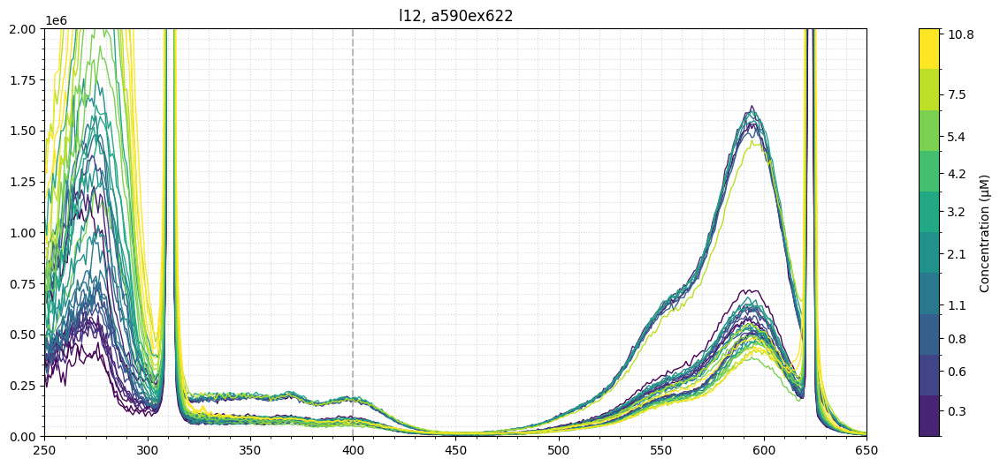

                 0              1             2             3
0.0   89005.860090  181301.451892  62965.518265  70398.576699
0.3   80261.718600  187763.239802  62110.189360  69489.683863
0.6   75936.609718  176766.556592  65781.569612  69953.280002
0.8   82031.763364  180007.462385  65807.166944  64911.066884
1.1   83924.332819  176295.670191  61393.933035  66343.242121
2.1   81654.322457  188836.696385  60813.291322  70426.028778
3.2   80098.297460  187483.648347  66054.108271  66682.618159
4.2            NaN            NaN           NaN           NaN
5.4   50632.256600   69747.005579  60580.168732  62144.034328
7.5            NaN  179908.291565  60733.030134  76796.480141
10.8  66731.100768       0.000021  68614.142077  77354.558474


C:\Users\Sasch\AppData\Local\Temp\ipykernel_30788\1648489575.py:19: RuntimeWarning: Mean of empty slice
  norm_mean = np.nanmean(wls_norm_df, axis=1)
c:\Users\Sasch\AppData\Local\Programs\Python\Python311\Lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


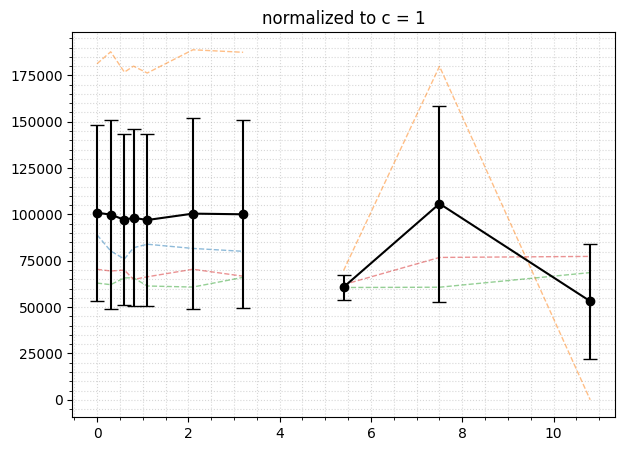

ex!! Unnamed: 0 0
ex!! Unnamed: 12 0
ex!! Unnamed: 13 0
ex!! Unnamed: 14 0
ex!! Unnamed: 15 0
ex!! Unnamed: 0 1
ex!! Unnamed: 12 1
ex!! Unnamed: 13 1
ex!! Unnamed: 0 2
ex!! Unnamed: 12 2
ex!! Unnamed: 13 2
ex!! Unnamed: 0 3
ex!! Unnamed: 12 3
ex!! Unnamed: 13 3


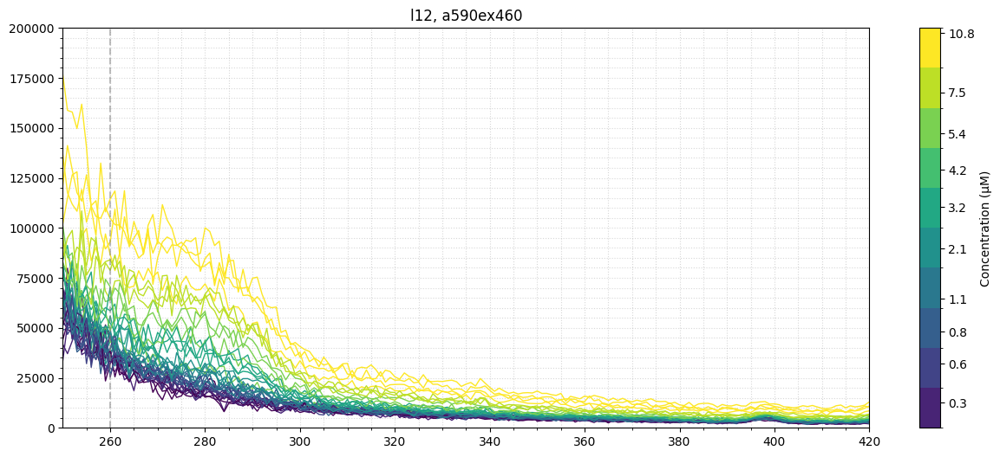

                 0              1              2             3
0.0   45222.322229   32907.827586   38598.338963  32111.357143
0.3   35034.332117   29916.850610   25333.392205  32282.871810
0.6   47418.913520   35400.394591   39818.021420  46401.582837
0.8   43707.799388   33777.856273   33675.312690  26522.931912
1.1   49986.767498   34131.224615   44738.877204  39362.647619
2.1   43187.515951   37675.301462   47303.679222  47965.478107
3.2   52360.401212   58532.968902   55931.503659  70262.721068
4.2            NaN            NaN            NaN           NaN
5.4   42741.743169   64022.447401   48714.938702  70513.808815
7.5            NaN   84035.212121   64175.738267  78750.795038
10.8  86551.496034  104750.304507  114439.383363  92995.440688


C:\Users\Sasch\AppData\Local\Temp\ipykernel_30788\1648489575.py:19: RuntimeWarning: Mean of empty slice
  norm_mean = np.nanmean(wls_norm_df, axis=1)
c:\Users\Sasch\AppData\Local\Programs\Python\Python311\Lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


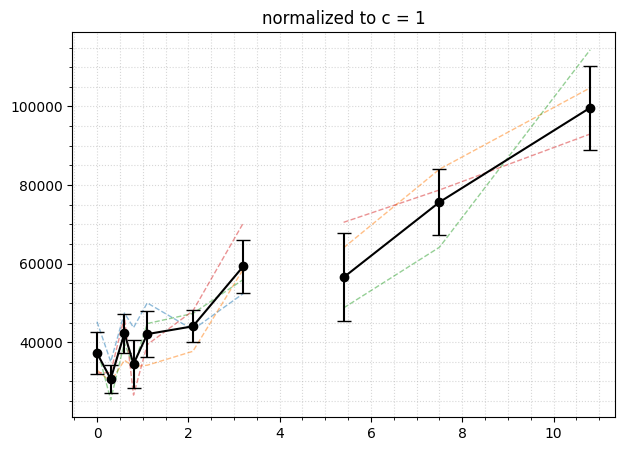

ex!! Unnamed: 0 0
ex!! Unnamed: 10 0
ex!! Unnamed: 11 0
ex!! Unnamed: 0 1
ex!! Unnamed: 12 1
ex!! Unnamed: 13 1
ex!! Unnamed: 0 2
ex!! Unnamed: 12 2
ex!! Unnamed: 13 2
ex!! Unnamed: 0 3
ex!! Unnamed: 12 3
ex!! Unnamed: 13 3


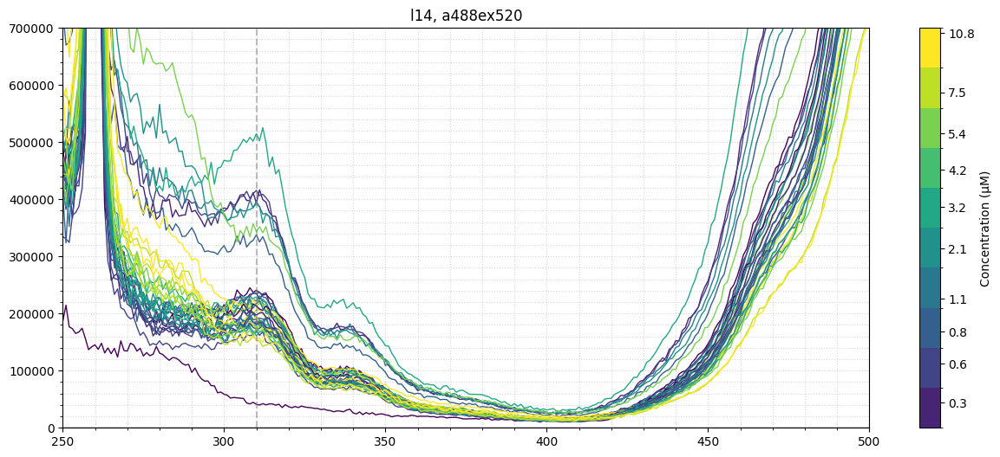

                  0              1              2              3
0.0    41302.372646  240576.020288  213292.333245       0.000005
0.3   393992.957634  236111.129246  197347.594291  181638.542554
0.6   415602.468944  170173.267327  192133.699673  172982.591232
0.8   337715.988579  234268.476321  192501.020909  185705.885454
1.1   396187.251016  222012.579129  217586.384914  189465.115721
2.1   392660.688022  213496.782171  179596.540920  167496.964854
3.2   514764.821038  229176.031782  195081.349868  161062.834672
4.2             NaN            NaN            NaN            NaN
5.4   343637.464454  213021.679479  185524.241319  175296.441860
7.5             NaN  206461.229220  175033.260896  153338.491830
10.8            NaN  214122.904238  195577.985063  155844.896317


C:\Users\Sasch\AppData\Local\Temp\ipykernel_30788\1648489575.py:19: RuntimeWarning: Mean of empty slice
  norm_mean = np.nanmean(wls_norm_df, axis=1)
c:\Users\Sasch\AppData\Local\Programs\Python\Python311\Lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


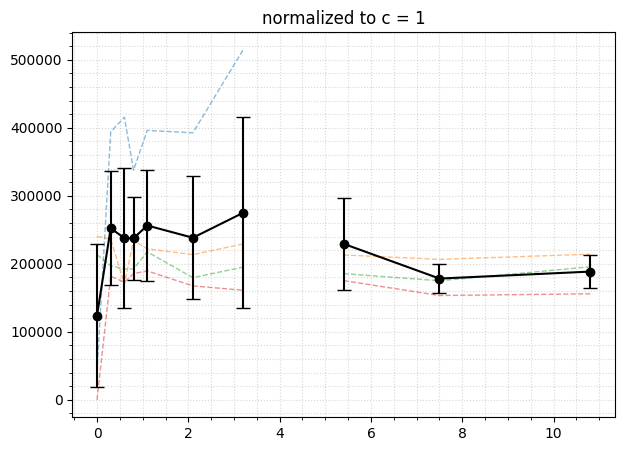

ex!! Unnamed: 0 0
ex!! Unnamed: 10 0
ex!! Unnamed: 11 0
ex!! Unnamed: 12 0
ex!! Unnamed: 0 1
ex!! Unnamed: 12 1
ex!! Unnamed: 13 1
ex!! Unnamed: 14 1
ex!! Unnamed: 15 1
ex!! Unnamed: 0 2
ex!! Unnamed: 12 2
ex!! Unnamed: 13 2
ex!! Unnamed: 14 2
ex!! Unnamed: 15 2
ex!! Unnamed: 0 3
ex!! Unnamed: 12 3
ex!! Unnamed: 13 3
ex!! Unnamed: 14 3
ex!! Unnamed: 15 3


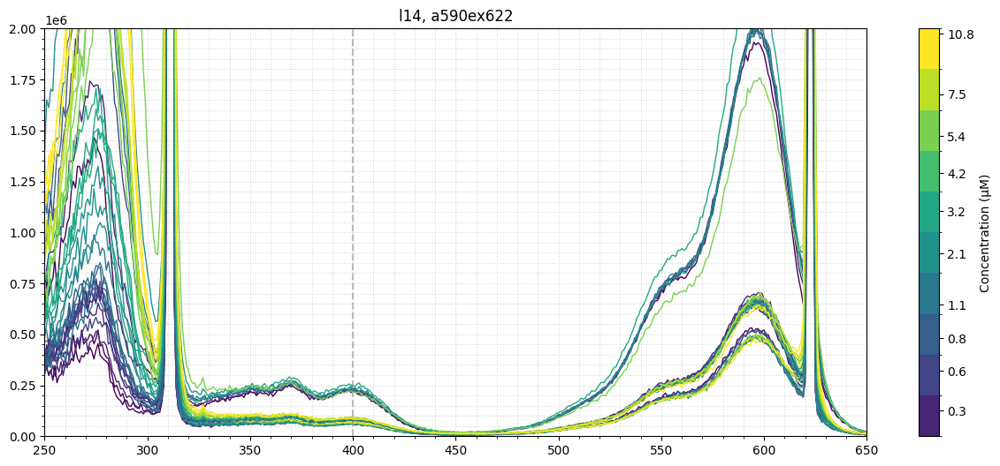

                  0             1             2             3
0.0   224528.915165  79990.073333  65839.332375           NaN
0.3   231583.452217  77952.163466  63794.893886  84880.287729
0.6   233886.905465  75690.089506  62813.567544  87699.808716
0.8   225695.981201  74234.548778  69366.773911  85321.942047
1.1   223370.272858  85239.738695  56534.495887  75442.322845
2.1   233805.043692  78276.452237  61629.826339  90667.128933
3.2   248541.723696  81529.136738  60084.031148  80334.980677
4.2             NaN           NaN           NaN           NaN
5.4   216792.965367  86757.053136  61333.624738  81799.997679
7.5             NaN  81938.322927  62335.098938  89817.588472
10.8            NaN  95940.667891  69038.047833  85698.905697


C:\Users\Sasch\AppData\Local\Temp\ipykernel_30788\1648489575.py:19: RuntimeWarning: Mean of empty slice
  norm_mean = np.nanmean(wls_norm_df, axis=1)
c:\Users\Sasch\AppData\Local\Programs\Python\Python311\Lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


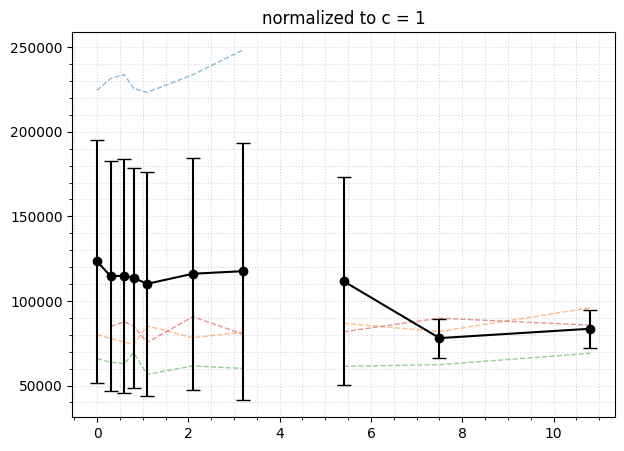

ex!! Unnamed: 0 0
ex!! Unnamed: 10 0
ex!! Unnamed: 11 0
ex!! Unnamed: 12 0
ex!! Unnamed: 0 1
ex!! Unnamed: 12 1
ex!! Unnamed: 13 1
ex!! Unnamed: 14 1
ex!! Unnamed: 0 2
ex!! Unnamed: 12 2
ex!! Unnamed: 13 2
ex!! Unnamed: 14 2
ex!! Unnamed: 0 3
ex!! Unnamed: 12 3
ex!! Unnamed: 13 3
ex!! Unnamed: 14 3


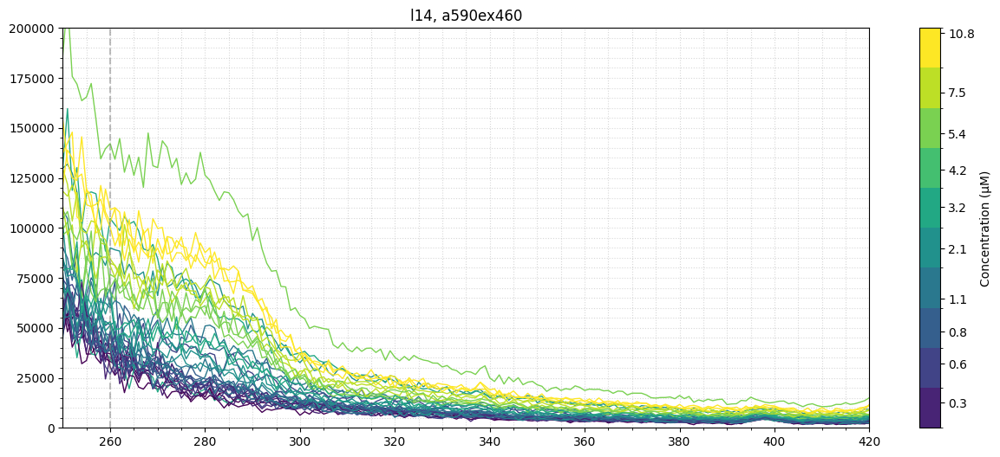

                  0              1              2              3
0.0    33139.494822   37082.760754   30383.879525            NaN
0.3    35408.412347   42061.360800   39292.482472   46981.224405
0.6    52991.141537   46208.816617   26840.762133   38991.301887
0.8    60913.097319   38968.325280   38635.776128   48308.497020
1.1    59976.971014   51425.394048   40188.904306   40391.981657
2.1    89961.705373   64814.087906   40584.095719   51272.796439
3.2    34426.307205  104693.115407   53074.258993   70096.320308
4.2             NaN            NaN            NaN            NaN
5.4   142172.405078   76729.306183   68380.037148   69889.424439
7.5             NaN   81031.507067   82338.539192   84489.518761
10.8            NaN  109055.515957  100213.238181  102812.492608


C:\Users\Sasch\AppData\Local\Temp\ipykernel_30788\1648489575.py:19: RuntimeWarning: Mean of empty slice
  norm_mean = np.nanmean(wls_norm_df, axis=1)
c:\Users\Sasch\AppData\Local\Programs\Python\Python311\Lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


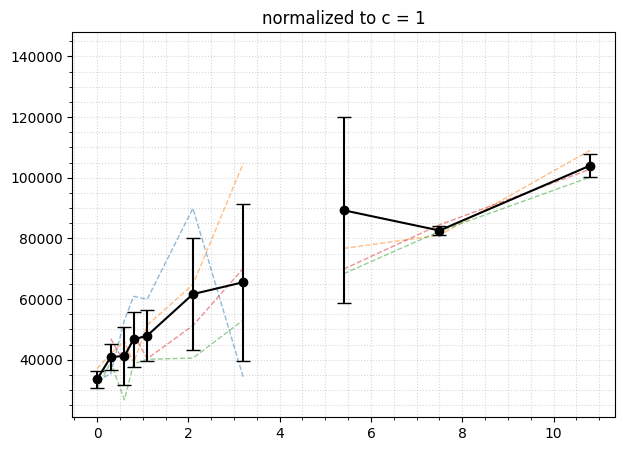

In [19]:
for lipid,ylims in zip(["l12","l14"],[[(0,7e5),(0,2e6),(0,2e5)],[(0,7e5),(0,2e6),(0,2e5)]]):
    for sheet,wl,ylim in zip(['a488ex520','a590ex622','a590ex460'],[310,400,260],ylims):
        wls = plotandReturnWL(sheet, wavelength=wl, ylim=(ylim), lipid=lipid)
        #if sheet == 'a590ex622':
        wls_df = pd.DataFrame().from_dict(wls).T.sort_index()
        print(wls_df)
        wls_norm_df = wls_df.copy()
        if 1 in wls_norm_df.index:
            # For each column, normalize to the value at 1 mM
            for col in wls_norm_df.columns:
                if not pd.isna(wls_norm_df.loc[1, col]) and wls_norm_df.loc[1, col] != 0:
                    wls_norm_df[col] = wls_norm_df[col] / wls_norm_df.loc[1, col]
                else:
                    # Handle case where 1 mM value is NA or zero
                    print(f"Warning: Can't normalize column {col}, value at 1 mM is {wls_norm_df.loc[1, col]}")
        fig = plt.figure(figsize=(7,5))
        ax = fig.add_subplot(111)
        ax.plot(wls_norm_df, ls="--", lw=1, alpha=0.5)
        norm_mean = np.nanmean(wls_norm_df, axis=1)
        norm_std = np.nanstd(wls_norm_df, axis=1)

        # Plot normalized mean with error bars
        ax.errorbar(wls_norm_df.index, norm_mean, yerr=norm_std, color="black", 
                    capsize=5, marker='o', 
                    markersize=6, linewidth=1.5, label="Mean ± Std Dev")
        
        ax.minorticks_on()
        ax.grid(which="both",axis="both", alpha=0.5, ls=":")
        ax.set_title("normalized to c = 1")

        plt.show()

## Decrease statistics

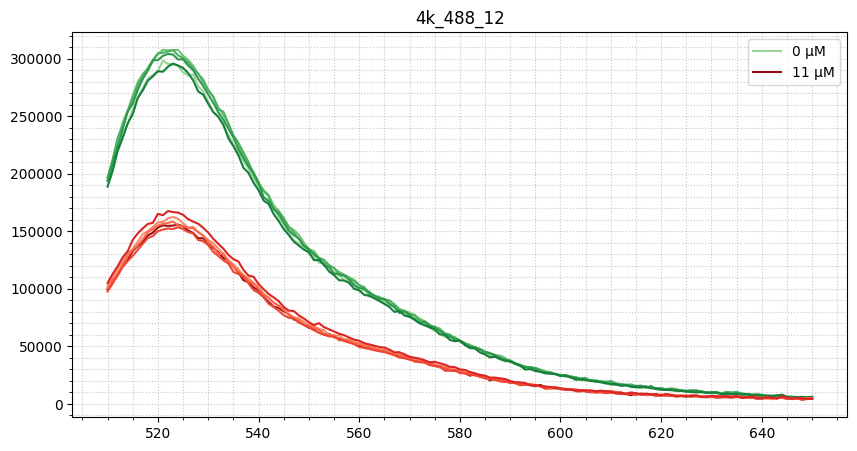

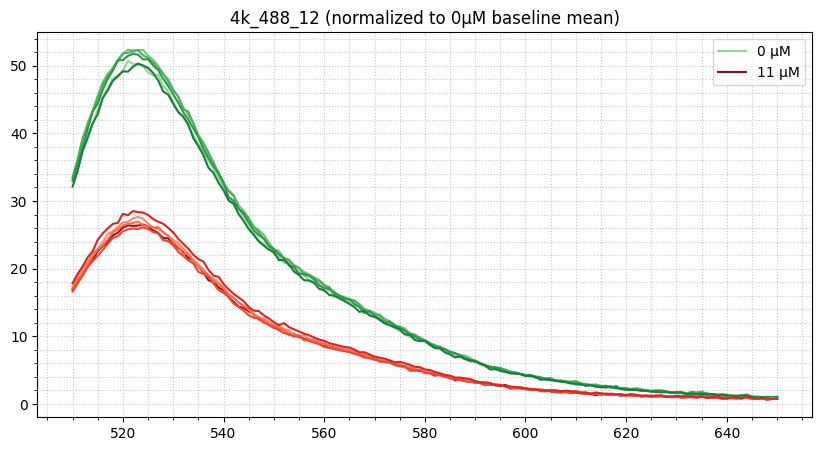

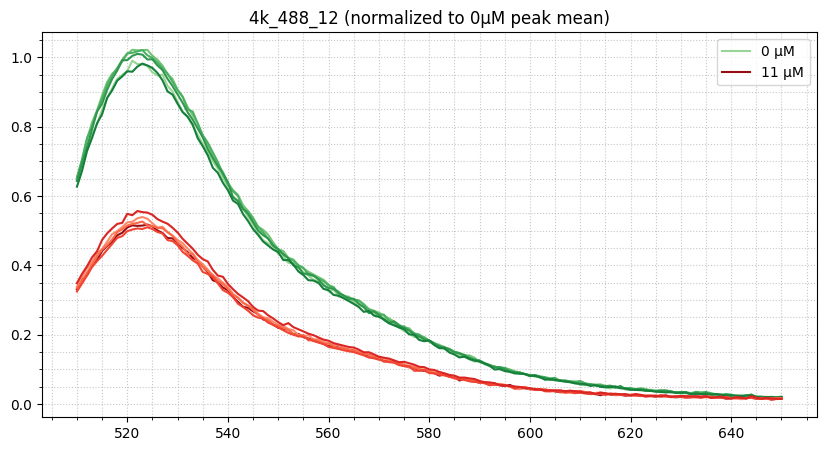

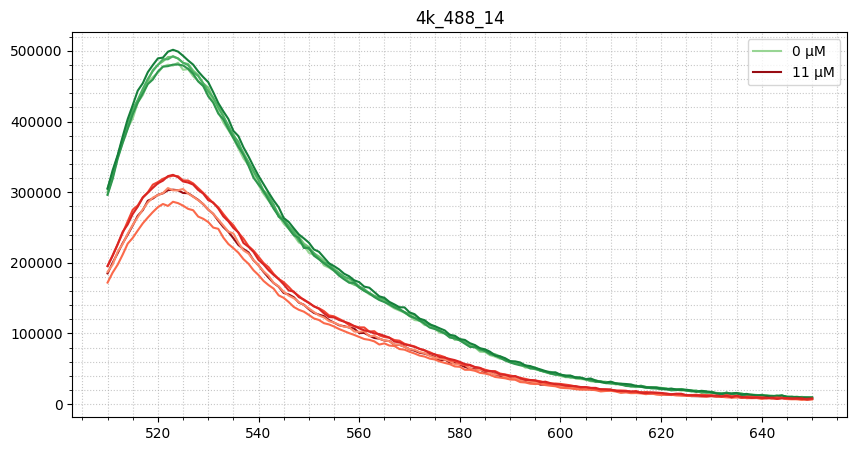

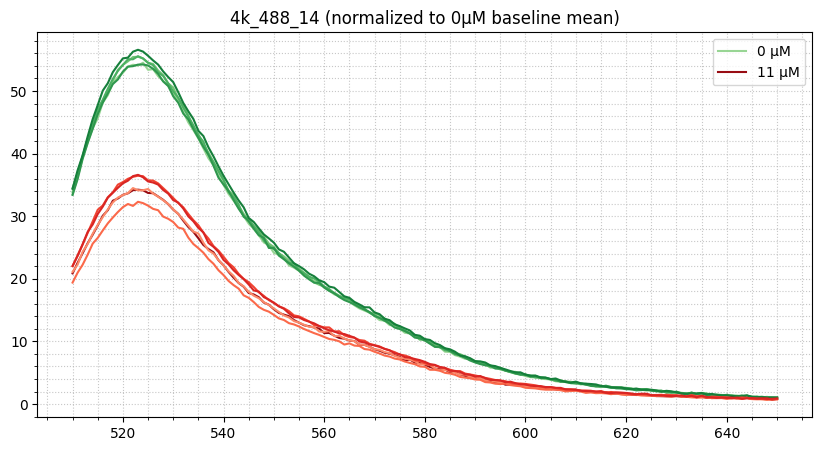

...

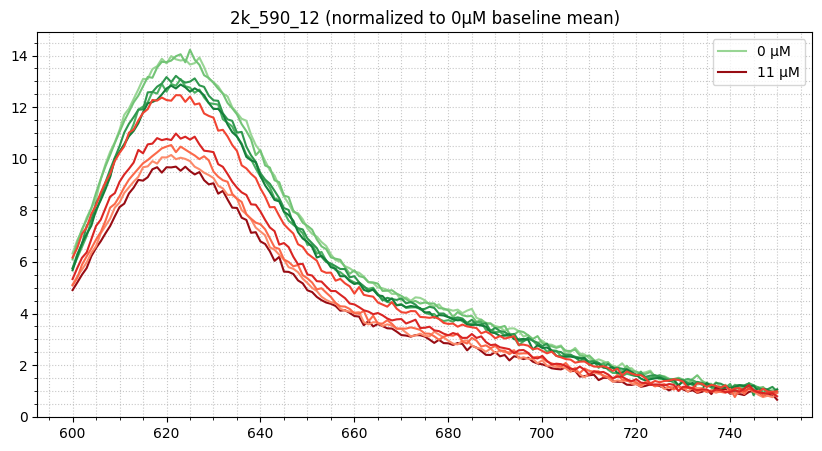

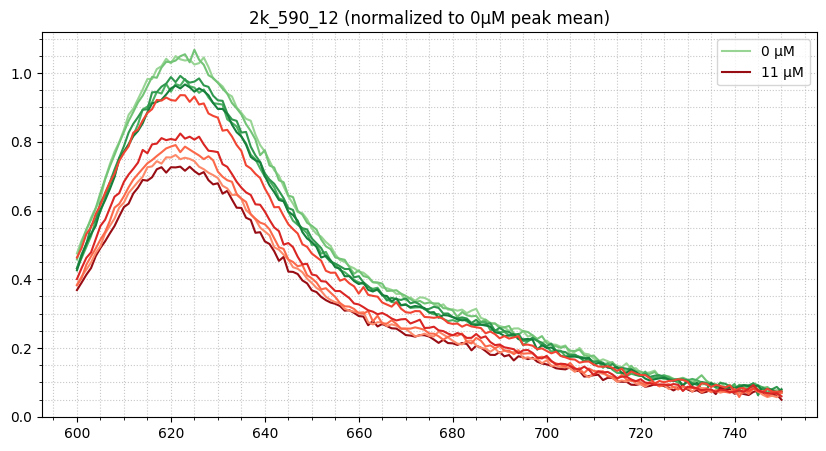

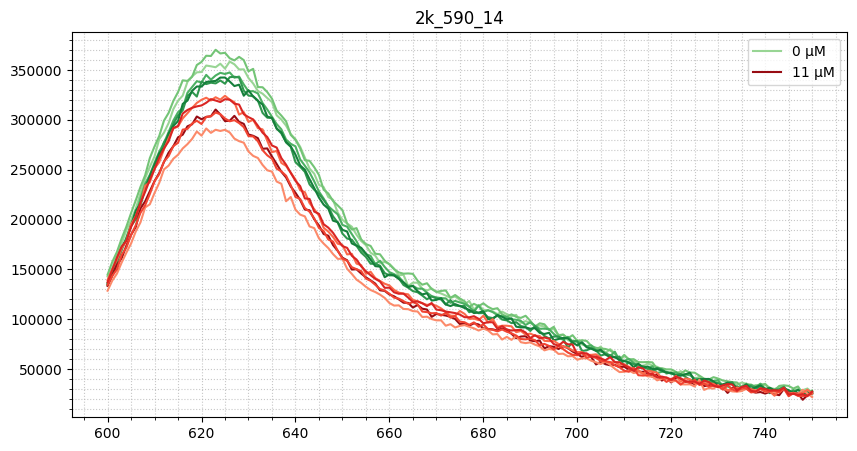

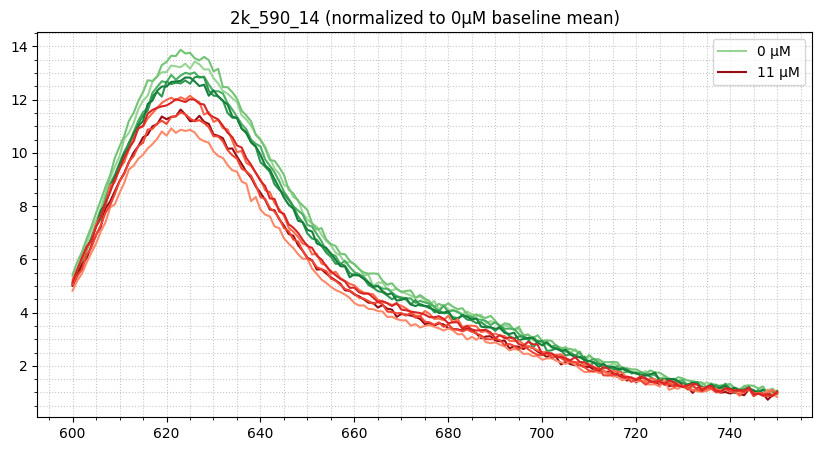

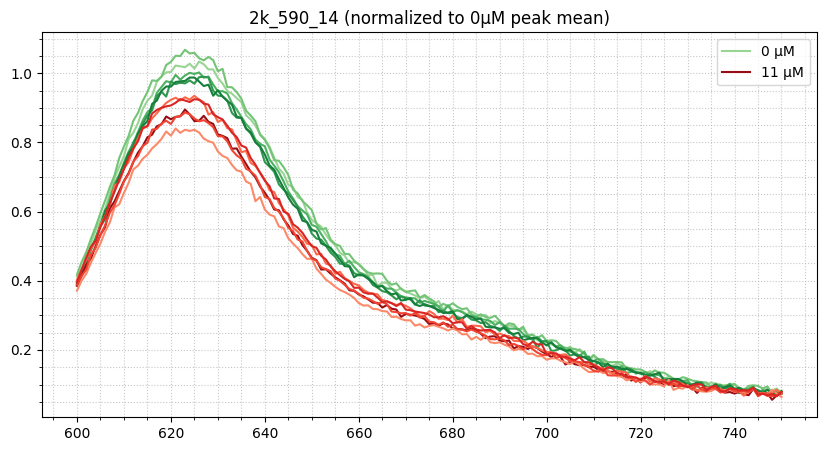

          0(4k_488_12)  18(4k_488_12)   0(4k_488_14)  18(4k_488_14)  \
mean     301130.816012  158659.763466  487413.867042  306703.297056   
median   304028.446750  157275.554420  488104.486360  305810.690150   
75quant  306233.972960  161263.324040  491334.802530  321680.082460   
25quant  295243.471970  154713.579530  480381.431610  302803.154410   

          0(2k_488_12)  18(2k_488_12)  0(2k_488_14)  18(2k_488_14)  
mean     568281.676316  289889.315736  1.014142e+06   592407.31120  
median   572790.752130  288211.036530  1.017770e+06   592618.21000  
75quant  576771.095730  291924.043620  1.017990e+06   594133.11690  
25quant  567748.488500  282017.740700  1.010160e+06   552436.04725  
             0(4k_488_12)-18(4k_488_12) 0(4k_488_14)-18(4k_488_14)  \
p-value                             0.0                        0.0   
statistic                     35.925133                  21.154971   
significance                        ***                        ***   
function           

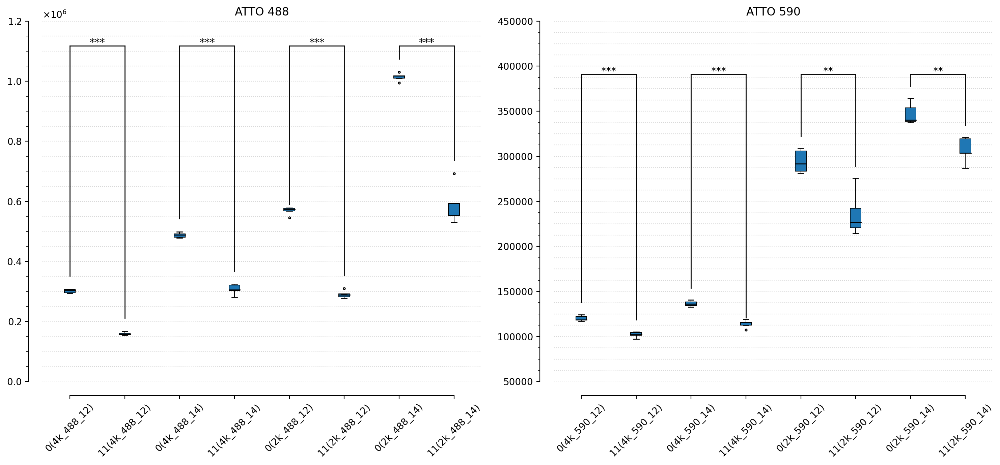

         0(4k_488_12)  18(4k_488_12)  0(4k_488_14)  18(4k_488_14)  \
mean        51.245408      27.000174     54.982167      34.597316   
median      51.738517      26.764614     55.060071      34.496627   
75quant     52.113846      27.443239     55.424463      36.286756   
25quant     50.243520      26.328626     54.188881      34.157365   

         0(2k_488_12)  18(2k_488_12)  0(2k_488_14)  18(2k_488_14)  
mean        56.612069      28.878696     61.271502      35.791532  
median      57.061262      28.711507     61.490713      35.804274  
75quant     57.457783      29.081395     61.504004      35.895800  
25quant     56.558953      28.094532     61.030938      33.376584  
             0(4k_488_12)-0(2k_488_12) 18(4k_488_12)-18(2k_488_12)  \
p-value                       0.000124                    0.033205   
statistic                    -6.903136                   -2.568491   
significance                       ***                           *   
function                     ttest

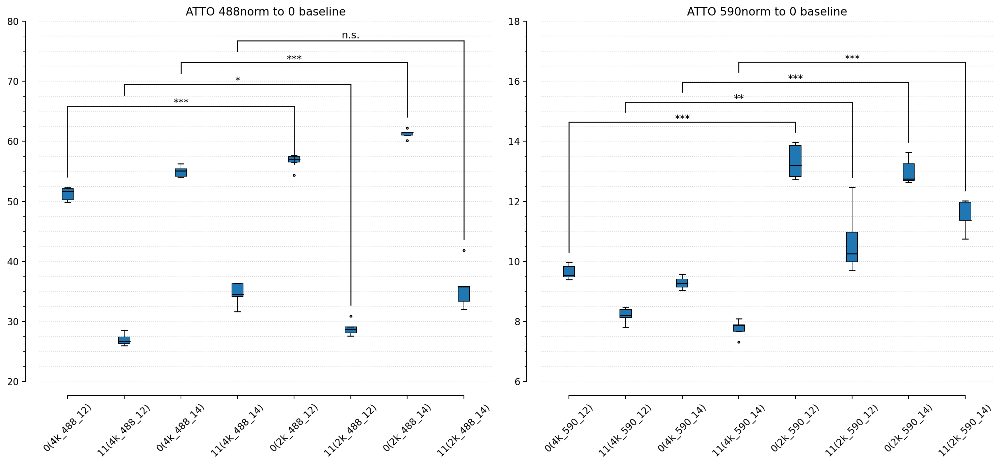

         0(4k_488_12)  18(4k_488_12)  0(4k_488_14)  18(4k_488_14)  \
mean         1.000000       0.526880      1.000000       0.629246   
median       1.009622       0.522283      1.001417       0.627415   
75quant      1.016947       0.535526      1.008044       0.659973   
25quant      0.980449       0.513775      0.985572       0.621244   

         0(2k_488_12)  18(2k_488_12)  0(2k_488_14)  18(2k_488_14)  
mean         1.000000       0.510116      1.000000       0.584146  
median       1.007935       0.507162      1.003578       0.584354  
75quant      1.014939       0.513696      1.003795       0.585848  
25quant      0.999062       0.496264      0.996074       0.544733  
             18(4k_488_12)-18(2k_488_12) 18(4k_488_14)-18(2k_488_14)
p-value                         0.248124                    0.193192
statistic                       1.245687                    1.420675
significance                        n.s.                        n.s.
function                       ttest_i

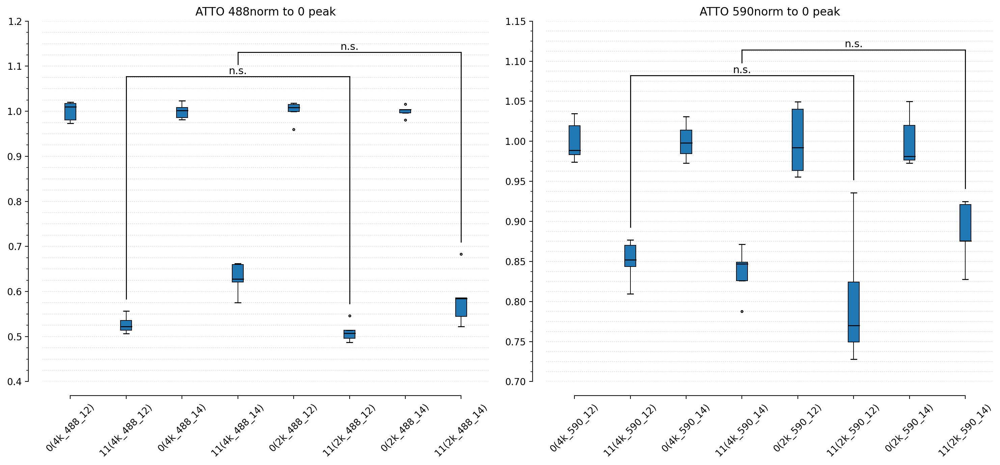

         0(488_12)  18(488_12)  0(488_14)  18(488_14)  0(590_12)  18(590_12)  \
mean      1.000000    0.518498   1.000000    0.606696   1.000000    0.825900   
median    1.008779    0.513736   1.002497    0.603546   0.990443    0.833795   
75quant   1.016445    0.532215   1.006982    0.651834   1.030693    0.865487   
25quant   0.985102    0.506481   0.988197    0.577742   0.976279    0.779787   

         0(590_14)  18(590_14)  
mean      1.000000    0.860590  
median    0.991276    0.860064  
75quant   1.018439    0.875478  
25quant   0.977632    0.832450  
             0(488_12)-18(488_12) 0(488_14)-18(488_14) 0(590_12)-18(590_12)  \
p-value                       0.0                  0.0                  0.0   
statistic               49.725732            22.682437             7.651603   
significance                  ***                  ***                  ***   
function                ttest_ind          welch_ttest            ttest_ind   

             0(590_14)-18(590_14) 18(4

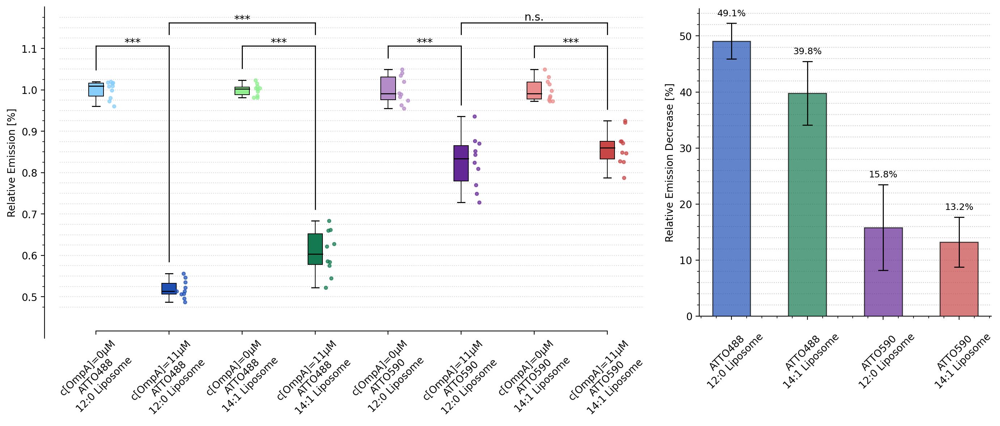

In [94]:
import importlib
importlib.reload(decentplots)
from matplotlib.ticker import ScalarFormatter

def combine_conditions(df, pattern_suffix="_488_12|_488_14|_590_12|_590_14"):
    """
    Combine columns with the same base name from different conditions (2k and 4k).
    
    Args:
        df: DataFrame containing the data with column names like '0(4k_488_12)', '18(2k_590_14)', etc.
        pattern_suffix: Regex pattern to match the suffix part of the column names
    
    Returns:
        DataFrame with combined columns, e.g., '0(488_12)' containing data from both '0(2k_488_12)' and '0(4k_488_12)'
    """
    import re
    import pandas as pd
    import numpy as np
    
    # Create a new DataFrame for the results
    combined_df = pd.DataFrame()
    
    # Find all unique base patterns
    base_patterns = set()
    for col in df.columns:
        # Extract the concentration (0 or 18) and the suffix part (e.g., _488_12)
        match = re.match(r'(\d+)\((\d+k)(' + pattern_suffix + r')\)', col)
        if match:
            conc, _, suffix = match.groups()
            base_patterns.add((conc, suffix))
    
    # For each base pattern, combine the 2k and 4k columns
    for conc, suffix in sorted(base_patterns):
        col_2k = f"{conc}(2k{suffix})"
        col_4k = f"{conc}(4k{suffix})"
        
        new_col = f"{conc}({suffix.lstrip('_')})"
        
        # Check if both columns exist and combine them
        if col_2k in df.columns and col_4k in df.columns:
            combined_values = np.concatenate([df[col_2k].values, df[col_4k].values])
            combined_df[new_col] = pd.Series(combined_values)
        # If only one column exists
        elif col_2k in df.columns:
            combined_df[new_col] = df[col_2k]
        elif col_4k in df.columns:
            combined_df[new_col] = df[col_4k]
    
    return combined_df

def calculate_decrease_percentages(stats_df):
    """
    Calculate the percentage decrease from 0 to 18 μM for each condition with error propagation.
    
    Parameters:
    -----------
    stats_df : pandas DataFrame
        DataFrame containing statistics with means and standard errors for both 0 and 18 μM conditions
    
    Returns:
    --------
    pandas.DataFrame
        DataFrame with condition names as index and percentage decreases, 
        absolute changes, and errors as columns
    """
    conditions = set()
    decreases = []
    condition_names = []
    absolute_changes = []
    mean_0_values = []
    mean_18_values = []
    decrease_errors = []  # For storing propagated errors
    
    # Extract condition names (without the 0 or 18 prefix)
    for col in stats_df.columns:
        if col.startswith("0("):
            conditions.add(col[2:-1])  # Remove the "0(" prefix and ")" suffix
    
    # Calculate percentage decrease for each condition
    for condition in sorted(conditions):
        col_0 = f"0({condition})"
        col_18 = f"18({condition})"
        
        if col_0 in stats_df.columns and col_18 in stats_df.columns:
            mean_0 = stats_df.loc["median", col_0]
            mean_18 = stats_df.loc["median", col_18]
            
            # Get standard deviations (or standard errors if available)
            if "std" in stats_df.index:
                std_0 = stats_df.loc["std", col_0]
                std_18 = stats_df.loc["std", col_18]
            elif "sem" in stats_df.index:
                std_0 = stats_df.loc["sem", col_0]
                std_18 = stats_df.loc["sem", col_18]
            else:
                # Calculate standard error from IQR if standard deviation not available
                q75_0 = stats_df.loc["75quant", col_0]
                q25_0 = stats_df.loc["25quant", col_0]
                iqr_0 = q75_0 - q25_0
                std_0 = iqr_0 / 1.35  # Approximate SD from IQR
                
                q75_18 = stats_df.loc["75quant", col_18]
                q25_18 = stats_df.loc["25quant", col_18]
                iqr_18 = q75_18 - q25_18
                std_18 = iqr_18 / 1.35
            
            # Calculate n (number of samples) if available
            if "n" in stats_df.index:
                n_0 = stats_df.loc["n", col_0]
                n_18 = stats_df.loc["n", col_18]
                sem_0 = std_0 / np.sqrt(n_0)
                sem_18 = std_18 / np.sqrt(n_18)
            else:
                # Use standard deviation if n not available
                sem_0 = std_0
                sem_18 = std_18
            
            # Calculate percentage decrease and absolute change
            decrease_percent = ((mean_0 - mean_18) / mean_0) * 100
            absolute_change = mean_0 - mean_18
            
            # Error propagation for (mean_0 - mean_18) / mean_0 * 100
            # Using the formula for division: (f/g) has error sqrt((df/f)^2 + (dg/g)^2) * (f/g)
            # Where f = (mean_0 - mean_18) and g = mean_0
            
            # First, error in (mean_0 - mean_18)
            diff_error = np.sqrt(sem_0**2 + sem_18**2)
            
            # Error in the ratio (mean_0 - mean_18) / mean_0
            ratio = (mean_0 - mean_18) / mean_0
            ratio_error = np.sqrt((diff_error/(mean_0 - mean_18))**2 + (sem_0/mean_0)**2) * ratio
            
            # Error in percentage (multiply by 100)
            percent_error = ratio_error * 100
            
            # Store the results
            decreases.append(decrease_percent)
            condition_names.append(condition)
            absolute_changes.append(absolute_change)
            mean_0_values.append(mean_0)
            mean_18_values.append(mean_18)
            decrease_errors.append(percent_error)
    
    # Create a DataFrame from the results
    results_df = pd.DataFrame({
        'decrease_percent': decreases,
        'decrease_error': decrease_errors,
        'absolute_change': absolute_changes,
        'initial_value': mean_0_values,
        'final_value': mean_18_values
    }, index=condition_names)
    
    return results_df


def plotSpektra(sheet, sheet_name, norm=None):
    fig = plt.figure(figsize=(10,5))
    ax = fig.add_subplot(111)
    red_cmap = plt.cm.Greens(np.linspace(0.4, 0.9, 6))  # For 0.x values
    blue_cmap = plt.cm.Reds(np.linspace(0.4, 0.9, 6))  # For 18.x values
    
    # Plot each column with appropriate color
    legend_added = {'0': False, '18': False}
    for i, col in enumerate(sheet.columns):
        if str(col).startswith('0'):
            # Use a red shade for 0.x values
            color_idx = min(i % len(red_cmap), len(red_cmap)-1)
            label = "0 μM" if not legend_added['0'] else None
            ax.plot(sheet.index, sheet[col], color=red_cmap[color_idx], label=label)
            legend_added['0'] = True
        elif str(col).startswith('18'):
            # Use a blue shade for 18.x values
            label = "11 μM" if not legend_added['18'] else None
            color_idx = min(i % len(blue_cmap), len(blue_cmap)-1)
            ax.plot(sheet.index, sheet[col], color=blue_cmap[color_idx], label=label)
            legend_added['18'] = True
    ax.minorticks_on()
    ax.grid(ls=":",alpha=0.7, zorder=-1, which="both")
    ax.legend()
    title = sheet_name if norm==None else sheet_name+" "+norm
    ax.set_title(title)
    plt.show()

def doBoxes(boxdata, comp1, comp2, addtitle=None):
    fig2 = plt.figure(figsize=(15,7), dpi=200)
    fig2_ax1 = fig2.add_subplot(121)
    fig2_ax2 = fig2.add_subplot(122)
    peaks_df_488 = boxdata.iloc[:,:8]
    peaks_df_590 = boxdata.iloc[:,8:]
    results1 = decentplots.Boxplot(
        peaks_df_488,fig2_ax1,
        compare = comp1,
        sigFontSize = 11
    )
    results2 = decentplots.Boxplot(
        peaks_df_590, fig2_ax2,
        compare = comp2,
        sigFontSize = 11
    )
    print(results1.simpleStats)
    print(results1.comparisonResults)
    print(results2.simpleStats)
    print(results2.comparisonResults)
    title1 = "ATTO 488" if addtitle == None else "ATTO 488" + addtitle
    title2 = "ATTO 590" if addtitle == None else "ATTO 590" + addtitle
    fig2_ax1.set_title(title1)
    fig2_ax2.set_title(title2)
    fig2_ax1.tick_params(axis='x', labelrotation=45)
    fig2_ax2.tick_params(axis='x', labelrotation=45)
    fig2_ax1.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
    fig2_ax1.set_xticklabels([label.get_text().replace("18","11") for label in fig2_ax1.get_xticklabels()])
    fig2_ax2.set_xticklabels([label.get_text().replace("18","11") for label in fig2_ax2.get_xticklabels()])
    plt.tight_layout()
    plt.show()


stats_data = pd.read_excel("data/0306.xlsx", sheet_name=None)
peaks_df = pd.DataFrame([])
peaks_df_norm = pd.DataFrame([])
peaks_df_norm_peak = pd.DataFrame([])

for sheet_name, sheet in stats_data.items():
    sheet.index = sheet.iloc[:,0]
    sheet = sheet.iloc[:,1:]
    peak = 522 if "488" in sheet_name else 622
    mean_endVal_0  = sheet.iloc[-1].filter(regex='^0').values.mean()
    mean_peakVal_0 = sheet.loc[peak].filter(regex='^0').values.mean()
    sheet_norm = sheet / mean_endVal_0
    sheet_norm_peak = sheet / mean_peakVal_0
    peak_data = sheet.loc[peak]
    peak_data_norm = sheet_norm.loc[peak]
    peak_data_norm_peak = sheet_norm_peak.loc[peak]
    peak_df = pd.DataFrame({
        '0': peak_data.filter(regex='^0($|\\.\\d+$)').values,  # Get all that start with 0 
        '18': peak_data.filter(regex='^18($|\\.\\d+$)').values  # Get all that start with 18
    })
    peak_df_norm = pd.DataFrame({
        '0': peak_data_norm.filter(regex='^0($|\\.\\d+$)').values,  # Get all that start with 0 
        '18': peak_data_norm.filter(regex='^18($|\\.\\d+$)').values  # Get all that start with 18
    })
    peak_df_norm_peak = pd.DataFrame({
        '0': peak_data_norm_peak.filter(regex='^0($|\\.\\d+$)').values,  # Get all that start with 0 
        '18': peak_data_norm_peak.filter(regex='^18($|\\.\\d+$)').values  # Get all that start with 18
    })
    peak_df.columns = [col+"("+sheet_name+")" for col in peak_df.columns]
    peak_df_norm.columns = [col+"("+sheet_name+")" for col in peak_df_norm.columns]
    peak_df_norm_peak.columns = [col+"("+sheet_name+")" for col in peak_df_norm_peak.columns]
    peaks_df = pd.concat([peaks_df,peak_df], axis=1)
    peaks_df_norm = pd.concat([peaks_df_norm,peak_df_norm], axis=1)
    peaks_df_norm_peak = pd.concat([peaks_df_norm_peak,peak_df_norm_peak], axis=1)
    plotSpektra(sheet,sheet_name)
    plotSpektra(sheet_norm, sheet_name, norm="(normalized to 0μM baseline mean)")
    plotSpektra(sheet_norm_peak, sheet_name, norm="(normalized to 0μM peak mean)")
"""
"""    
doBoxes(
    peaks_df,
    [
        ["0(4k_488_12)", "18(4k_488_12)"],
        ["0(4k_488_14)","18(4k_488_14)"],
        ["0(2k_488_12)","18(2k_488_12)"],
        ["0(2k_488_14)","18(2k_488_14)"]
    ],
    [
        ["0(4k_590_12)", "18(4k_590_12)"],
        ["0(4k_590_14)","18(4k_590_14)"],
        ["0(2k_590_12)","18(2k_590_12)"],
        ["0(2k_590_14)","18(2k_590_14)"]
    ],
)

doBoxes(
    peaks_df_norm,
    [
        ["0(4k_488_12)", "0(2k_488_12)"],
        ["18(4k_488_12)","18(2k_488_12)"],
        ["0(4k_488_14)","0(2k_488_14)"],
        ["18(4k_488_14)","18(2k_488_14)"]
    ],
    [
        ["0(4k_590_12)", "0(2k_590_12)"],
        ["18(4k_590_12)","18(2k_590_12)"],
        ["0(4k_590_14)","0(2k_590_14)"],
        ["18(4k_590_14)","18(2k_590_14)"]
    ],
    addtitle = "norm to 0 baseline"
)

doBoxes(
    peaks_df_norm_peak,
    [
        ["18(4k_488_12)","18(2k_488_12)"],
        ["18(4k_488_14)","18(2k_488_14)"]
    ],
    [
        ["18(4k_590_12)","18(2k_590_12)"],
        ["18(4k_590_14)","18(2k_590_14)"]
    ],
    addtitle = "norm to 0 peak"
)

#print(peaks_df_norm_peak)
combined_norm_peak = combine_conditions(peaks_df_norm_peak)
combined_norm_peak = combined_norm_peak[["0(488_12)","18(488_12)", "0(488_14)","18(488_14)", "0(590_12)","18(590_12)", "0(590_14)","18(590_14)"]]
fig = plt.figure(figsize=(14,6), dpi=200)
gs = fig.add_gridspec(1, 2, width_ratios=[2, 1])  # 2:1 ratio (2/3 and 1/3)
ax = fig.add_subplot(gs[0])  # Boxplot takes 2/3
ax2 = fig.add_subplot(gs[1])  # Bar chart takes 1/3
colors = [
    # Light Blue
    (135/255, 206/255, 250/255),
    # Dark Blue (lightened)
    (30/255, 80/255, 180/255),
    # Light Green
    (144/255, 238/255, 144/255),
    # Dark Green (lightened)
    (20/255, 120/255, 80/255),
    # Light Violet
    (180/255, 140/255, 200/255),
    # Dark Violet (lightened)
    (100/255, 40/255, 150/255),
    # Medium Light Red (less light than before)
    (235/255, 140/255, 140/255),
    # Medium Dark Red (less dark than before)
    (200/255, 70/255, 70/255)
]
barcolors = [
    # Dark Blue (lightened)
    (30/255, 80/255, 180/255),
    # Dark Green (lightened)
    (20/255, 120/255, 80/255),
    # Dark Violet (lightened)
    (100/255, 40/255, 150/255),
    # Medium Dark Red (less dark than before)
    (200/255, 70/255, 70/255)
]
results = decentplots.Boxplot(
    combined_norm_peak, ax,
    compare = [
        ["0(488_12)","18(488_12)"], ["0(488_14)","18(488_14)"], ["0(590_12)","18(590_12)"], ["0(590_14)","18(590_14)"],
        ["18(488_12)", "18(488_14)"], ["18(590_12)","18(590_14)"]
    ],
    sigFontSize = 11,
    color=colors
)
ax.tick_params(axis='x', labelrotation=45)
for i, col in enumerate(combined_norm_peak.columns):
    # Get data values for this condition
    data = combined_norm_peak[col].dropna()
    
    # Create jittered x-positions (add small random offset to position i+1)
    x_pos = np.random.normal(i+.2, 0.03, len(data))
    
    # Plot individual data points
    ax.scatter(x_pos, data, s=10, alpha=0.7, zorder=5, color=colors[i])
print(results.simpleStats)
print(results.comparisonResults)
decreases = calculate_decrease_percentages(results.simpleStats)
print(decreases)
bars = ax2.bar(
    height=decreases["decrease_percent"], x=decreases.index, 
    width=0.5, yerr=decreases["decrease_error"], capsize=5, error_kw={'elinewidth': 1, 'capthick': 1}, zorder=10,
    color=barcolors, alpha=0.7, edgecolor="black"
)
ax2.spines.top.set_visible(False)
ax2.spines.right.set_visible(False)
ax2.minorticks_on()
ax2.grid(axis="y", ls=":", alpha=0.7, zorder=-200, which="both")
ax2.set_ylabel("Relative Emission Decrease [%]")
ax.set_ylabel("Relative Emission [%]", fontsize=10)
for i, bar in enumerate(bars):
    height = bar.get_height()
    error = decreases["decrease_error"].iloc[i]
    y_pos = height + error + 1  # Position slightly above the error bar
    ax2.text(bar.get_x() + bar.get_width()/2., y_pos,
            f'{height:.1f}%',
            ha='center', va='bottom', 
            fontsize=9)
ax.set_xticklabels([
    "c[OmpA]=0μM\nATTO488\n12:0 Liposome","c[OmpA]=11μM\nATTO488\n12:0 Liposome","c[OmpA]=0μM\nATTO488\n14:1 Liposome","c[OmpA]=11μM\nATTO488\n14:1 Liposome",
    "c[OmpA]=0μM\nATTO590\n12:0 Liposome","c[OmpA]=11μM\nATTO590\n12:0 Liposome","c[OmpA]=0μM\nATTO590\n14:1 Liposome","c[OmpA]=11μM\nATTO590\n14:1 Liposome"
])
ax2.set_xticklabels([
    "ATTO488\n12:0 Liposome", "ATTO488\n14:1 Liposome", "ATTO590\n12:0 Liposome", "ATTO590\n14:1 Liposome"
], rotation=45)
plt.tight_layout()
plt.show()



# FRET

In [87]:
fretdata = pd.read_excel("data/1405.xlsx",sheet_name=None)


In [24]:
fretdata.keys()

dict_keys(['12trp', '12a488', '12a590', '14trp', '14a488', '14a590'])

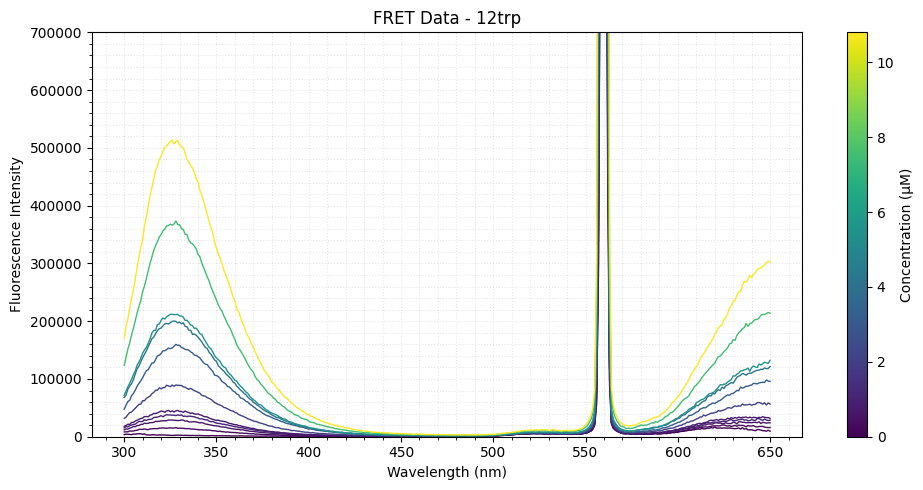

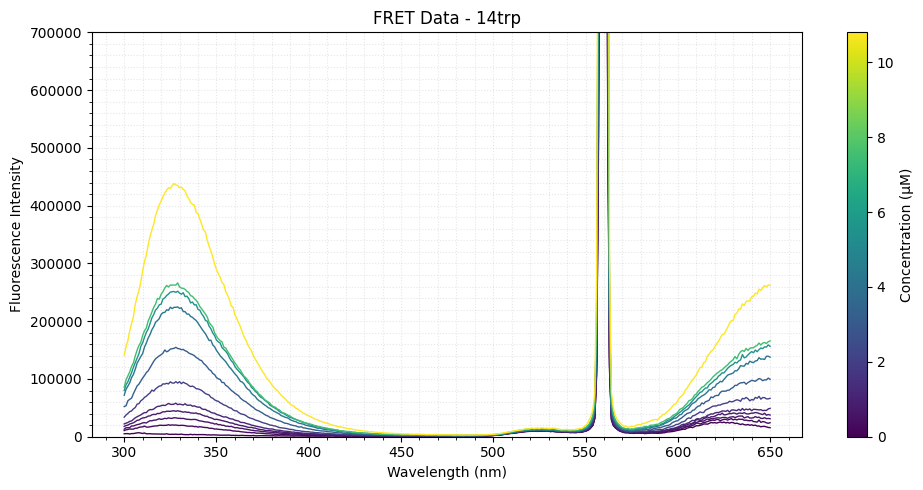

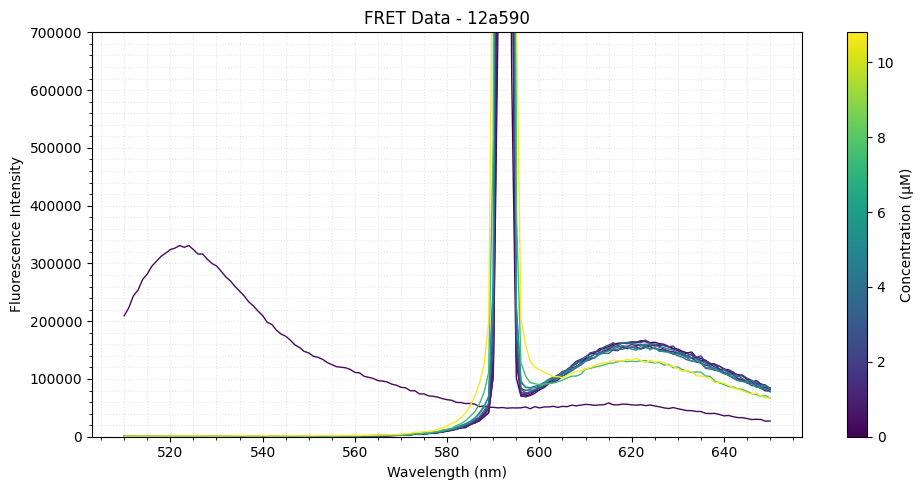

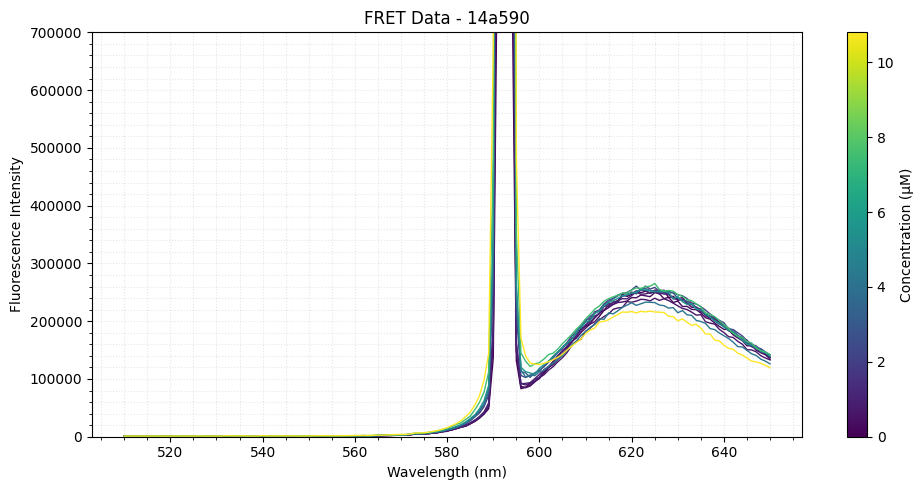

In [8]:
for sheet in ['12trp', '14trp', '12a590', '14a590']:
    fig = plt.figure(figsize=(10, 5))
    ax = fig.add_subplot(111)
    
    # Get data and prepare for plotting
    data = fretdata[sheet]
    data.index = data.iloc[:,0]
    data = data.iloc[:,1:]

    sorted_columns = data.max().sort_values().index
    data = data[sorted_columns]  # Reorder the dataframe columns
    
    # Create viridis colormap for column numbers
    num_cols = len(data.columns)
    cmap = plt.cm.viridis
    
    # Use concentration correction for normalization
    norm = mpl.colors.Normalize(vmin=0, vmax=conc_correction[18.0])
    
    # Plot each column with color from viridis based on corrected concentration
    for i, col in enumerate(data.columns):
        try:
            col_value = float(col)
            corrected_conc = conc_correction[col_value] if col_value in conc_correction else col_value
            color = cmap(norm(corrected_conc))
            ax.plot(data.index, data[col], color=color, label=f"{corrected_conc} mM", lw=1)
        except (ValueError, TypeError):
            # Handle non-numeric column names
            color = cmap(0)  # Default color
            ax.plot(data.index, data[col], color=color, label=col, lw=1)
    
    # Add colorbar
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax)
    cbar.set_label('Concentration (μM)')
    
    # Format plot
    ax.set_ylim(0, 7e5)
    ax.set_xlabel('Wavelength (nm)')
    ax.set_ylabel('Fluorescence Intensity')
    ax.set_title(f'FRET Data - {sheet}')
    ax.minorticks_on()
    ax.grid(which="both", alpha=0.3, ls=":")
    
    # Optional: Add legend if you have a reasonable number of columns
    # If too many columns, consider skipping the legend
    if num_cols <= 10:
        ax.legend(loc='upper right')
        
    plt.tight_layout()
    plt.show()

522 622


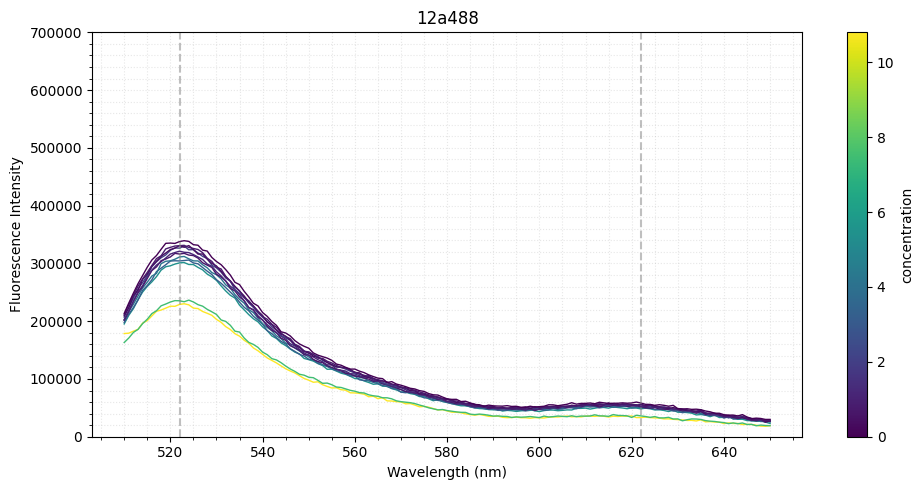

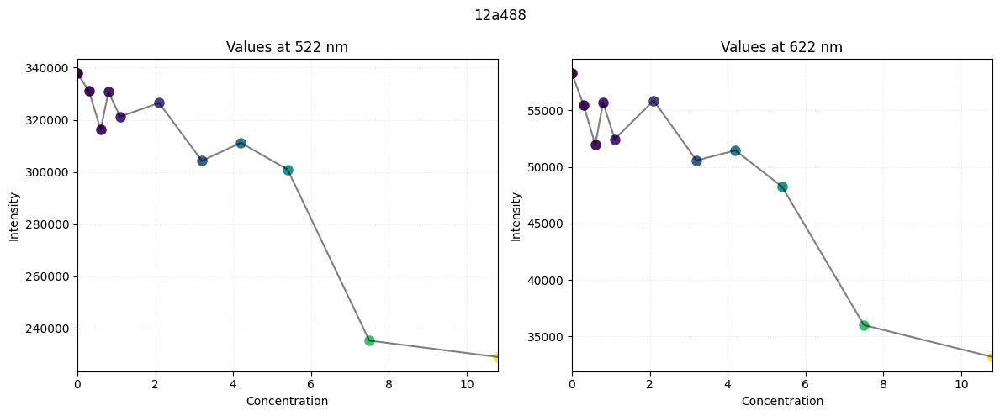

522nm
[337824.2373  330970.02621 316214.53602 330680.41166 321212.24357
 326455.00958 304258.65319 311194.55043 300931.79883 235308.11148
 229010.85145]
622nm
[58283.12709 55474.5288  51949.64368 55700.72463 52458.58431 55870.37151
 50573.61901 51459.55271 48236.26204 36002.83724 33175.38929]
ratio
[0.172525   0.16761194 0.16428607 0.16844277 0.1633144  0.17114264
 0.16621916 0.16536136 0.16028968 0.15300296 0.14486383]


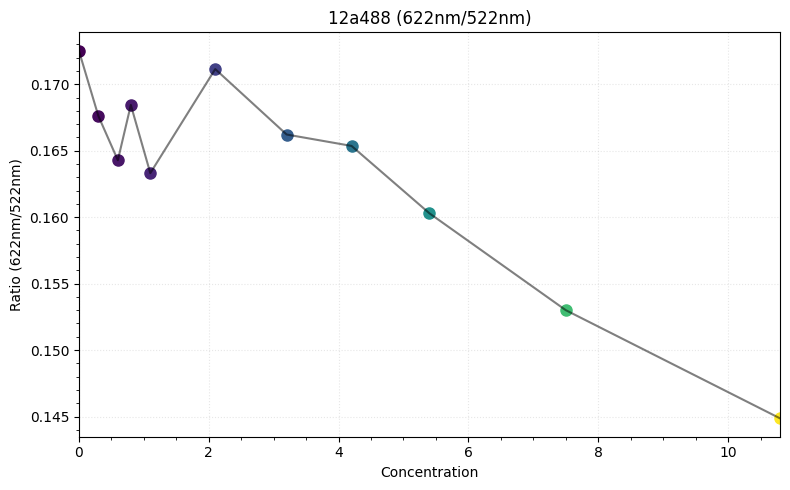

522 622


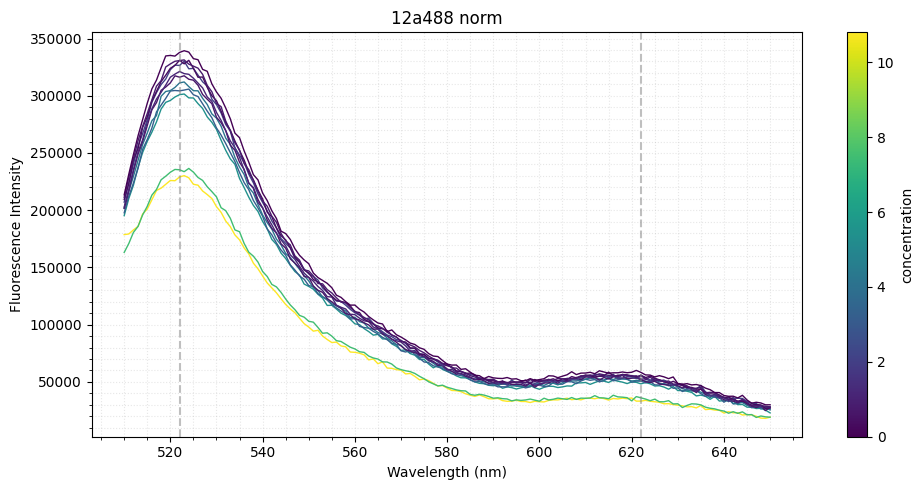

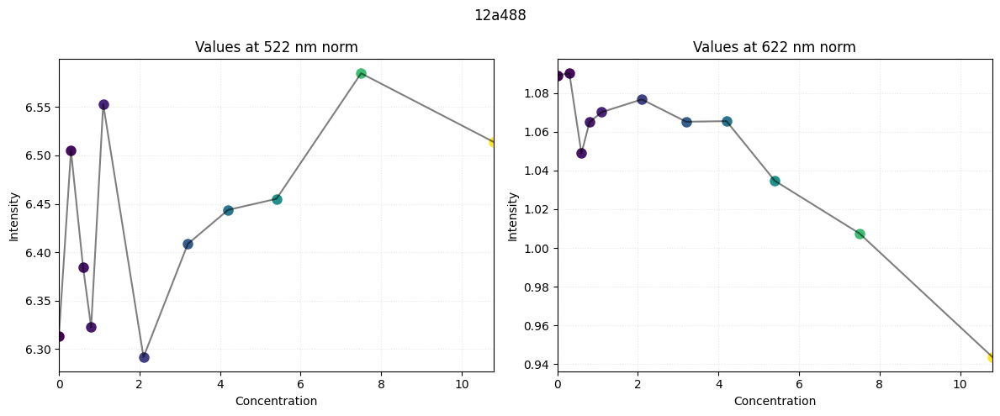

normalized values:
522nm
[6.31351517 6.50479204 6.38466836 6.32254837 6.55296859 6.29174514
 6.40863205 6.44374992 6.45519639 6.58487764 6.51371461]
622nm
[1.08923921 1.09028083 1.04891208 1.06498756 1.07019412 1.07678586
 1.06523746 1.06554722 1.03470137 1.00750576 0.94360165]
ratio
[0.172525   0.16761194 0.16428607 0.16844277 0.1633144  0.17114264
 0.16621916 0.16536136 0.16028968 0.15300296 0.14486383]


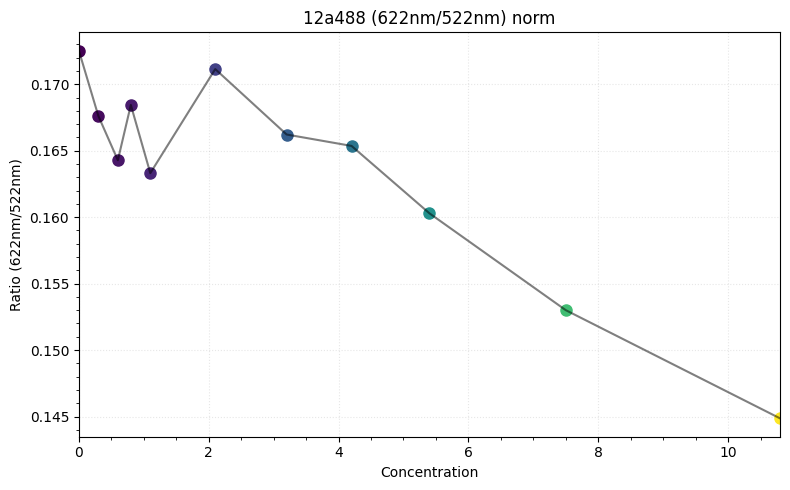

522 622


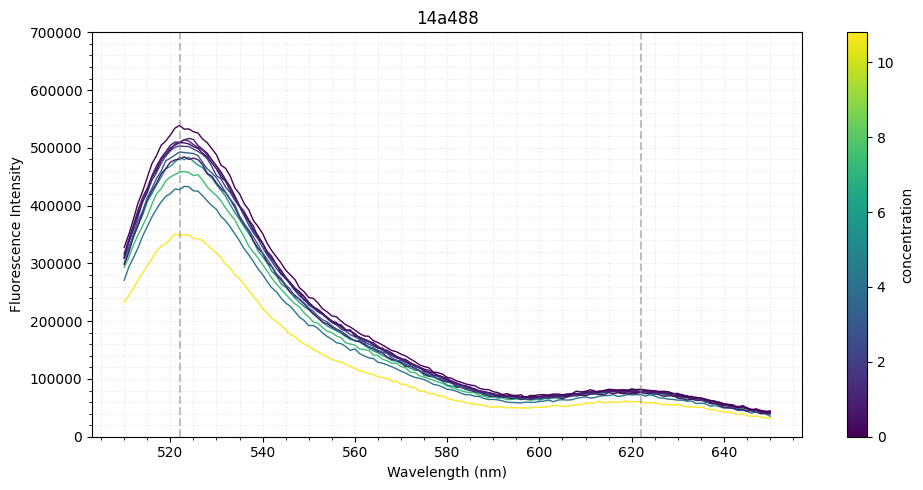

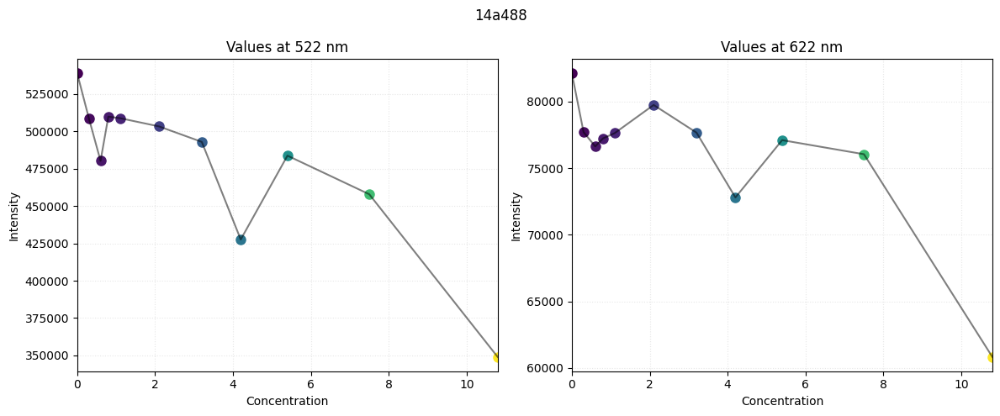

522nm
[538928.12744 508808.21391 480262.61538 509870.13394 508867.62202
 503364.94551 492975.95167 427589.89677 483760.26806 457902.88667
 348866.72039]
622nm
[82109.08849 77698.26969 76623.83947 77227.02836 77622.87108 79734.03221
 77660.57038 72797.35991 77095.08079 76039.50022 60827.83025]
ratio
[0.15235629 0.1527064  0.15954571 0.15146411 0.1525404  0.15840204
 0.1575342  0.17025042 0.15936629 0.16606032 0.17435836]


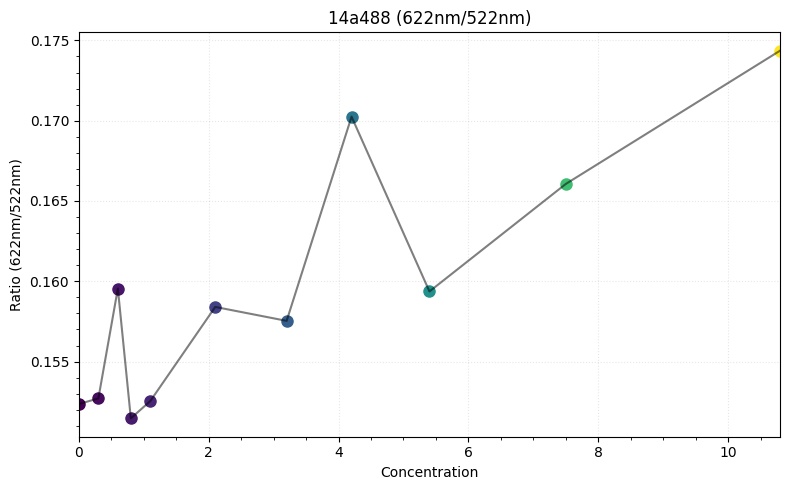

522 622


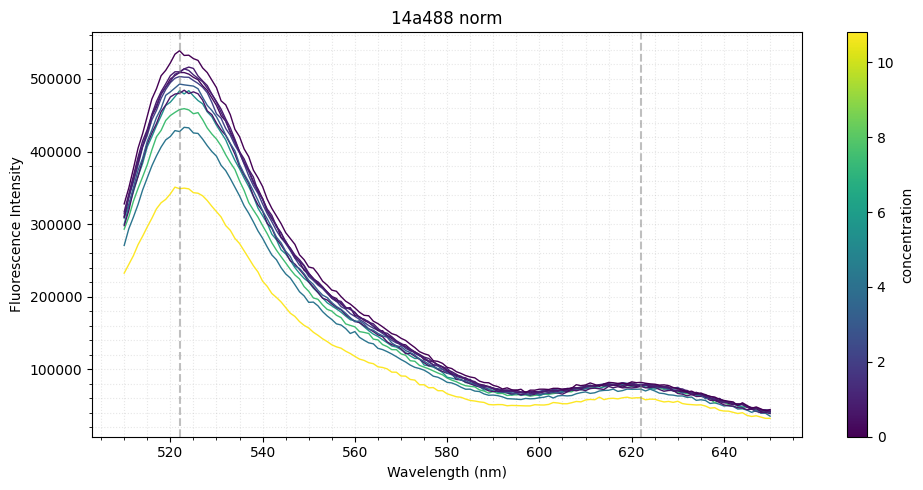

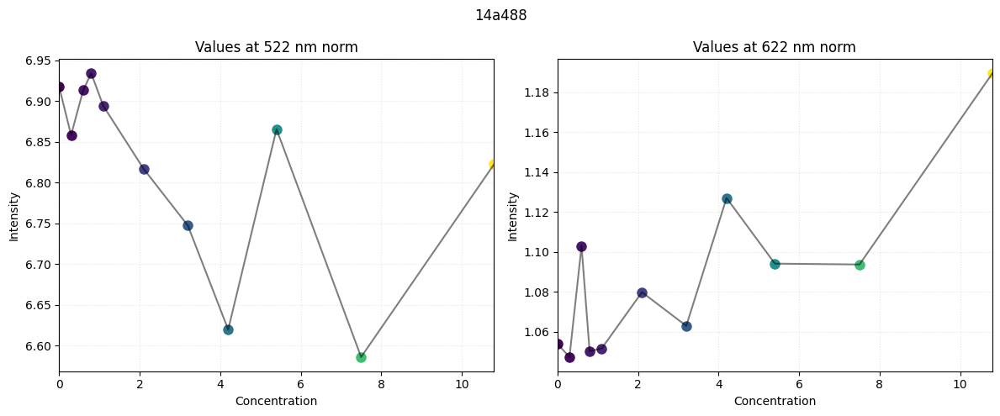

normalized values:
522nm
[6.9179306  6.85815734 6.91303139 6.93385453 6.89383204 6.8168094
 6.74715222 6.61974812 6.86535778 6.58609649 6.8223808 ]
622nm
[1.05399022 1.04728451 1.10294449 1.05023014 1.0515879  1.07979649
 1.0629072  1.1270149  1.09410662 1.0936893  1.18953915]
ratio
[0.15235629 0.1527064  0.15954571 0.15146411 0.1525404  0.15840204
 0.1575342  0.17025042 0.15936629 0.16606032 0.17435836]


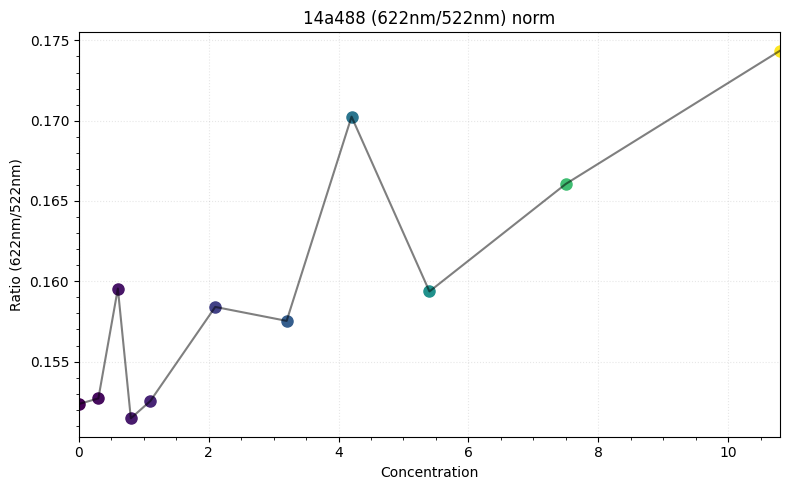

In [89]:
# please excuse this mess this was mainly writte by ai
# i do regret that

for sheet in ['12a488', '14a488']:
    # Get data and prepare for plotting
    data = fretdata[sheet]
    data.index = data.iloc[:,0]
    data = data.iloc[:,1:]

    # Sort columns by their maximum values
    sorted_columns = data.max().sort_values().index
    data = data[sorted_columns]  # Reorder the dataframe columns
    
    # Variables to store values at 522 and 622nm
    values_522 = []
    values_622 = []
    column_labels = []
    
    # Find closest wavelengths to 522 and 622
    min_wl = data.index.min()
    max_wl = data.index.max()
    closest_522 = min(data.index, key=lambda x: abs(x - 522)) if 522 >= min_wl and 522 <= max_wl else None
    closest_622 = min(data.index, key=lambda x: abs(x - 622)) if 622 >= min_wl and 622 <= max_wl else None
    
    # Create the main spectral plot
    fig = plt.figure(figsize=(10, 5))
    ax = fig.add_subplot(111)
    
    # Create viridis colormap for column numbers
    num_cols = (data.columns)
    cmap = plt.cm.viridis
    norm = mpl.colors.Normalize(vmin=0, vmax=conc_correction[18.0])
    print(closest_522, closest_622)
    
    # Plot each column with color from viridis
    for i, col in enumerate(data.columns):
        try:
            col_value = float(col)
            corrected_conc = conc_correction[col_value] if col_value in conc_correction else col_value
            color = cmap(norm(corrected_conc))
            ax.plot(data.index, data[col], color=color, label=col, lw=1)
            column_labels.append(col)
        except (ValueError, TypeError):
            color = cmap(0)
            ax.plot(data.index, data[col], color=color, label=col, lw=1)
            column_labels.append(col)
        
        # Extract values at key wavelengths while plotting
        if closest_522 is not None:
            values_522.append(data.loc[closest_522, col])
        if closest_622 is not None:
            values_622.append(data.loc[closest_622, col])
    
    # Add vertical lines at 522 and 622nm
    if closest_522 is not None:
        ax.axvline(x=closest_522, color='grey', linestyle='--', alpha=0.5, label=f'{closest_522}nm')
    if closest_622 is not None:
        ax.axvline(x=closest_622, color='grey', linestyle='--', alpha=0.5, label=f'{closest_622}nm')
    
    # Add colorbar
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax)
    cbar.set_label('concentration')
    
    # Format plot
    ax.set_ylim(0, 7e5)
    ax.set_xlabel('Wavelength (nm)')
    ax.set_ylabel('Fluorescence Intensity')
    ax.set_title(f'{sheet}')
    ax.minorticks_on()
    ax.grid(which="both", alpha=0.3, ls=":")
    
        
    plt.tight_layout()
    plt.show()
    
    # Now plot the extracted values in a new figure with x-axis from 0 to 18
    if (closest_522 is not None) or (closest_622 is not None):
        fig2, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
        
        # Ensure column_labels are properly sorted for x-axis
        # Convert column labels to float and sort them
        x_vals = [float(col) for col in column_labels]
        sort_indices = np.argsort(x_vals)  # Get indices that would sort
        x_vals_sorted = np.array(x_vals)[sort_indices]
        
        # Plot values at 522 nm if available
        if closest_522 is not None:
            values_522_sorted = np.array(values_522)[sort_indices]
            
            # Plot with simple lines - no errorbars
            for i, (x, y) in enumerate(zip(x_vals_sorted, values_522_sorted)):
                original_conc = x_vals_sorted[i]
                corrected_conc = conc_correction[original_conc] if original_conc in conc_correction else original_conc
                color = cmap(norm(corrected_conc))
                corrected_x = conc_correction[x] if x in conc_correction else x
                ax1.plot(corrected_x, y, 'o', color=color, markersize=8)
            
            # Connect points with a line
            corrected_x_vals = [conc_correction[val] if val in conc_correction else val for val in x_vals_sorted]
            ax1.plot(corrected_x_vals, values_522_sorted, 'k-', alpha=0.5)
            
            ax1.set_title(f'Values at {closest_522} nm')
            ax1.set_xlabel('Concentration')
            ax1.set_ylabel('Intensity')
            ax1.grid(alpha=0.3, ls=':')
            # Ensure x-axis goes from 0 to max
            ax1.set_xlim(0, max(corrected_x_vals))
        
        # Plot values at 622 nm if available
        if closest_622 is not None:
            values_622_sorted = np.array(values_622)[sort_indices]
            
            # Plot with simple lines - no errorbars
            for i, (x, y) in enumerate(zip(x_vals_sorted, values_622_sorted)):
                original_conc = x_vals_sorted[i]
                corrected_conc = conc_correction[original_conc] if original_conc in conc_correction else original_conc
                color = cmap(norm(corrected_conc))
                corrected_x = conc_correction[x] if x in conc_correction else x
                ax2.plot(corrected_x, y, 'o', color=color, markersize=8)
            
            # Connect points with a line
            corrected_x_vals = [conc_correction[val] if val in conc_correction else val for val in x_vals_sorted]
            ax2.plot(corrected_x_vals, values_622_sorted, 'k-', alpha=0.5)
            
            ax2.set_title(f'Values at {closest_622} nm')
            ax2.set_xlabel('Concentration')
            ax2.set_ylabel('Intensity')
            ax2.grid(alpha=0.3, ls=':')
            # Ensure x-axis goes from 0 to max
            ax2.set_xlim(0, max(corrected_x_vals))
        
        fig2.suptitle(f'{sheet}')
        plt.tight_layout()
        plt.show()

        # After your existing plotting code, add this to create a ratio plot
    if closest_522 is not None and closest_622 is not None:
        # Create a third figure for the ratio
        fig3 = plt.figure(figsize=(8, 5))
        ax3 = fig3.add_subplot(111)
        
        # Calculate ratio (522/622)
        ratio_values = values_622_sorted / values_522_sorted
        print("522nm")
        print(values_522_sorted)
        print("622nm")
        print(values_622_sorted)
        print("ratio")
        print(ratio_values)
        
        # Plot individual points with viridis colors for consistency
        for i, (x, y) in enumerate(zip(x_vals_sorted, ratio_values)):
            original_conc = x_vals_sorted[i]
            corrected_conc = conc_correction[original_conc] if original_conc in conc_correction else original_conc
            color = cmap(norm(corrected_conc))
            corrected_x = conc_correction[x] if x in conc_correction else x
            ax3.plot(corrected_x, y, 'o', color=color, markersize=8)
        
        # Connect points with a line
        corrected_x_vals = [conc_correction[val] if val in conc_correction else val for val in x_vals_sorted]
        ax3.plot(corrected_x_vals, ratio_values, 'k-', alpha=0.5)
        
        # Format plot
        ax3.set_title(f'{sheet} (622nm/522nm)')
        ax3.set_xlabel('Concentration')
        ax3.set_ylabel('Ratio (622nm/522nm)')
        ax3.grid(alpha=0.3, ls=':')
        ax3.set_xlim(0, max(corrected_x_vals))
        ax3.minorticks_on()
        
        plt.tight_layout()
        plt.show()


    # Normalized plots
    data_norm = data / data.loc[590]

    fig = plt.figure(figsize=(10, 5))
    ax = fig.add_subplot(111)
    
    # Create viridis colormap for column numbers
    num_cols = (data.columns)
    cmap = plt.cm.viridis
    norm = mpl.colors.Normalize(vmin=0, vmax=conc_correction[18.0])
    print(closest_522, closest_622)

    values_522_norm = []
    values_622_norm = []
    column_labels = []
    
    # Plot each column with color from viridis
    for i, col in enumerate(data.columns):
        try:
            col_value = float(col)
            corrected_conc = conc_correction[col_value] if col_value in conc_correction else col_value
            color = cmap(norm(corrected_conc))
            ax.plot(data.index, data[col], color=color, label=col, lw=1)
            column_labels.append(col)
        except (ValueError, TypeError):
            color = cmap(0)
            ax.plot(data.index, data[col], color=color, label=col, lw=1)
            column_labels.append(col)
        
        # Extract values at key wavelengths while plotting
        if closest_522 is not None:
            values_522_norm.append(data_norm.loc[closest_522, col])
        if closest_622 is not None:
            values_622_norm.append(data_norm.loc[closest_622, col])
    
    # Add vertical lines at 522 and 622nm
    if closest_522 is not None:
        ax.axvline(x=closest_522, color='grey', linestyle='--', alpha=0.5, label=f'{closest_522}nm')
    if closest_622 is not None:
        ax.axvline(x=closest_622, color='grey', linestyle='--', alpha=0.5, label=f'{closest_622}nm')
    
    # Add colorbar
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax)
    cbar.set_label('concentration')
    
    # Format plot
    #ax.set_ylim(0, 7e5)
    ax.set_xlabel('Wavelength (nm)')
    ax.set_ylabel('Fluorescence Intensity')
    ax.set_title(f'{sheet} norm')
    ax.minorticks_on()
    ax.grid(which="both", alpha=0.3, ls=":")
    
        
    plt.tight_layout()
    plt.show()

    # Now plot the extracted values in a new figure with x-axis from 0 to 18
    if (closest_522 is not None) or (closest_622 is not None):
        fig2, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
        
        # Ensure column_labels are properly sorted for x-axis
        # Convert column labels to float and sort them
        x_vals = [float(col) for col in column_labels]
        sort_indices = np.argsort(x_vals)  # Get indices that would sort
        x_vals_sorted = np.array(x_vals)[sort_indices]
        
        # Plot values at 522 nm if available
        if closest_522 is not None:
            values_522_sorted = np.array(values_522_norm)[sort_indices]
            
            # Plot with simple lines - no errorbars
            for i, (x, y) in enumerate(zip(x_vals_sorted, values_522_sorted)):
                original_conc = x_vals_sorted[i]
                corrected_conc = conc_correction[original_conc] if original_conc in conc_correction else original_conc
                color = cmap(norm(corrected_conc))
                corrected_x = conc_correction[x] if x in conc_correction else x
                ax1.plot(corrected_x, y, 'o', color=color, markersize=8)
            
            # Connect points with a line
            corrected_x_vals = [conc_correction[val] if val in conc_correction else val for val in x_vals_sorted]
            ax1.plot(corrected_x_vals, values_522_sorted, 'k-', alpha=0.5)
            
            ax1.set_title(f'Values at {closest_522} nm norm')
            ax1.set_xlabel('Concentration')
            ax1.set_ylabel('Intensity')
            ax1.grid(alpha=0.3, ls=':')
            # Ensure x-axis goes from 0 to max
            ax1.set_xlim(0, max(corrected_x_vals))
        
        # Plot values at 622 nm if available
        if closest_622 is not None:
            values_622_sorted = np.array(values_622_norm)[sort_indices]
            
            # Plot with simple lines - no errorbars
            for i, (x, y) in enumerate(zip(x_vals_sorted, values_622_sorted)):
                original_conc = x_vals_sorted[i]
                corrected_conc = conc_correction[original_conc] if original_conc in conc_correction else original_conc
                color = cmap(norm(corrected_conc))
                corrected_x = conc_correction[x] if x in conc_correction else x
                ax2.plot(corrected_x, y, 'o', color=color, markersize=8)
            
            # Connect points with a line
            corrected_x_vals = [conc_correction[val] if val in conc_correction else val for val in x_vals_sorted]
            ax2.plot(corrected_x_vals, values_622_sorted, 'k-', alpha=0.5)
            
            ax2.set_title(f'Values at {closest_622} nm norm')
            ax2.set_xlabel('Concentration')
            ax2.set_ylabel('Intensity')
            ax2.grid(alpha=0.3, ls=':')
            # Ensure x-axis goes from 0 to max
            ax2.set_xlim(0, max(corrected_x_vals))
        
        fig2.suptitle(f'{sheet}')
        plt.tight_layout()
        plt.show()

        # After your existing plotting code, add this to create a ratio plot
    if closest_522 is not None and closest_622 is not None:
        # Create a third figure for the ratio
        fig3 = plt.figure(figsize=(8, 5))
        ax3 = fig3.add_subplot(111)
        
        # Calculate ratio (622nm/522nm)
        ratio_values =  values_622_sorted / values_522_sorted
        print("normalized values:")
        print("522nm")
        print(values_522_sorted)
        print("622nm")
        print(values_622_sorted)
        print("ratio")
        print(ratio_values)
        
        # Plot individual points with viridis colors for consistency
        for i, (x, y) in enumerate(zip(x_vals_sorted, ratio_values)):
            original_conc = x_vals_sorted[i]
            corrected_conc = conc_correction[original_conc] if original_conc in conc_correction else original_conc
            color = cmap(norm(corrected_conc))
            corrected_x = conc_correction[x] if x in conc_correction else x
            ax3.plot(corrected_x, y, 'o', color=color, markersize=8)
        
        # Connect points with a line
        corrected_x_vals = [conc_correction[val] if val in conc_correction else val for val in x_vals_sorted]
        ax3.plot(corrected_x_vals, ratio_values, 'k-', alpha=0.5)
        
        # Format plot
        ax3.set_title(f'{sheet} (622nm/522nm) norm')
        ax3.set_xlabel('Concentration')
        ax3.set_ylabel('Ratio (622nm/522nm)')
        ax3.grid(alpha=0.3, ls=':')
        ax3.set_xlim(0, max(corrected_x_vals))
        ax3.minorticks_on()
        
        
        plt.tight_layout()
        plt.show()

In [34]:
fretdata2 = pd.read_excel("data/2105.xlsx",sheet_name=None)

In [7]:
fretdata2.keys()

dict_keys(['fret 12 280', 'fret 12 500', 'fret 12 593', 'fret 14 280', 'fret 14 500', 'fret 14 593', '14a590em280', '14a590em594', '14a590ex460', '14a590ex622'])

522 622


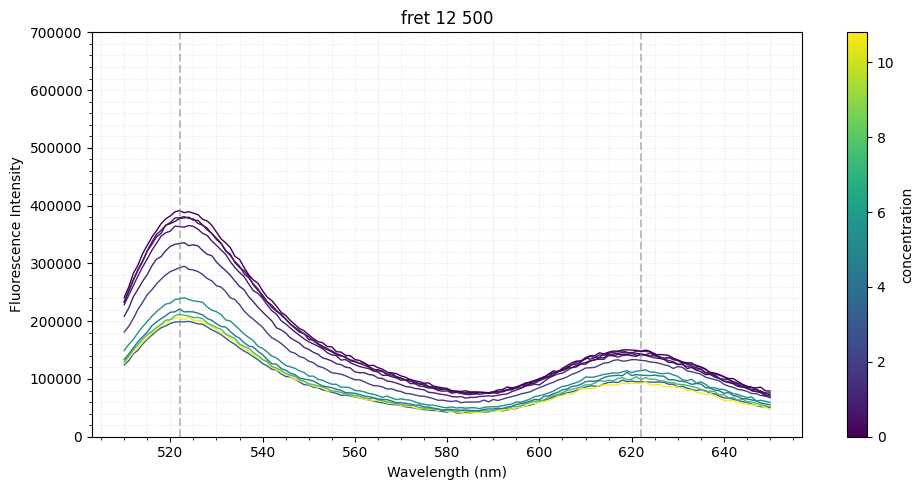

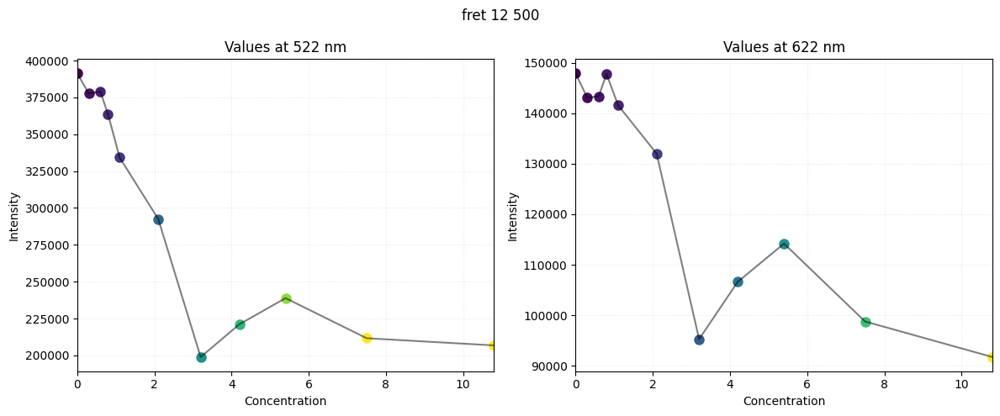

normalized values:
522nm
[391388.07762 377679.65543 379046.04204 363481.11631 334222.62042
 292525.55077 198861.23386 221042.73823 238828.0422  211633.97826
 206762.51295]
622nm
[147950.92644 143125.41527 143389.31041 147837.82852 141617.44303
 132022.96965  95247.29664 106613.6374  114191.19791  98753.3321
  91703.56187]
ratio
[0.37801593 0.37895982 0.37828996 0.40672767 0.4237219  0.45132116
 0.47896362 0.48232137 0.47813145 0.46662324 0.44352122]


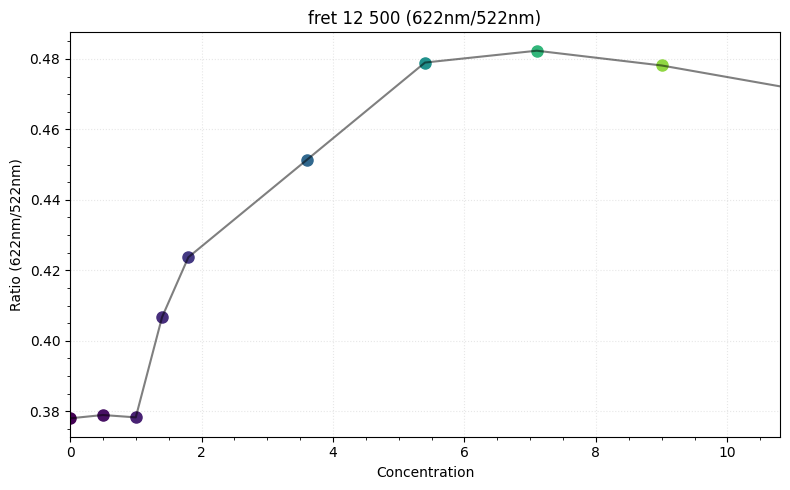

522 622


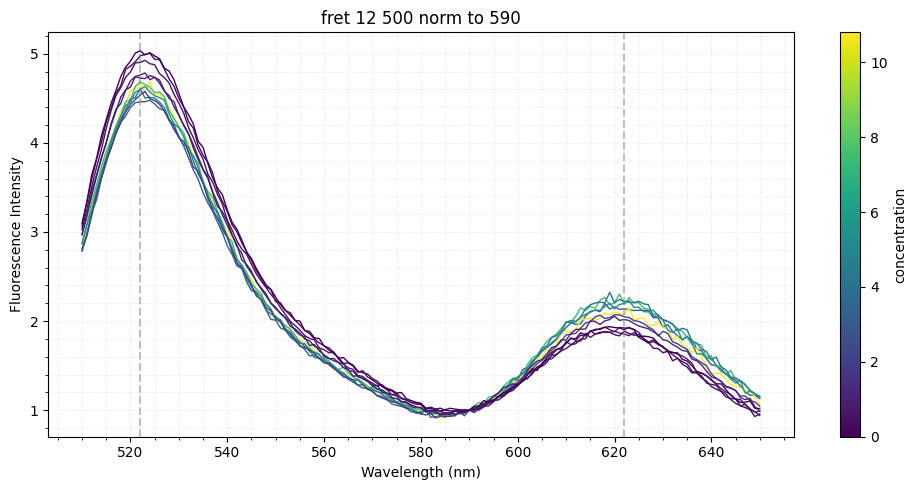

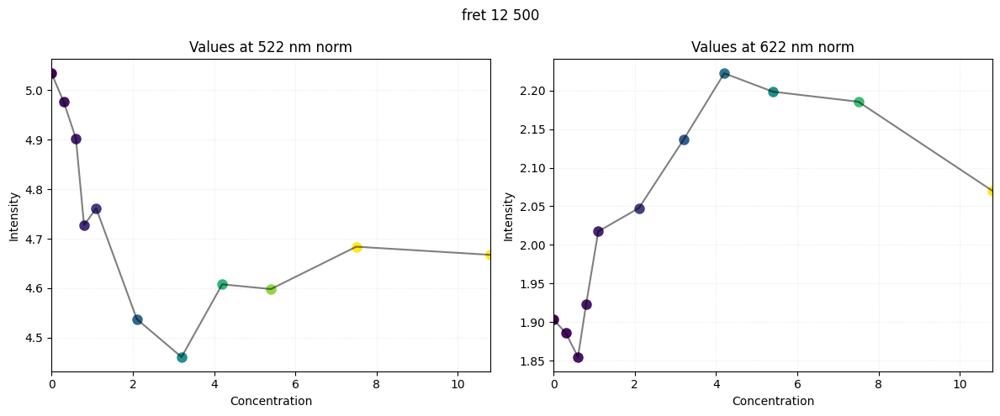

normalized values:
522nm
[5.03443287 4.97650772 4.90272654 4.72763203 4.76128548 4.53721841
 4.46065711 4.60771394 4.59816517 4.68379199 4.66735994]
622nm
[1.9030958  1.88589648 1.85465221 1.92285877 2.01746092 2.04774266
 2.13649248 2.22239892 2.19852738 2.18556618 2.07007317]
ratio
[0.37801593 0.37895982 0.37828996 0.40672767 0.4237219  0.45132116
 0.47896362 0.48232137 0.47813145 0.46662324 0.44352122]


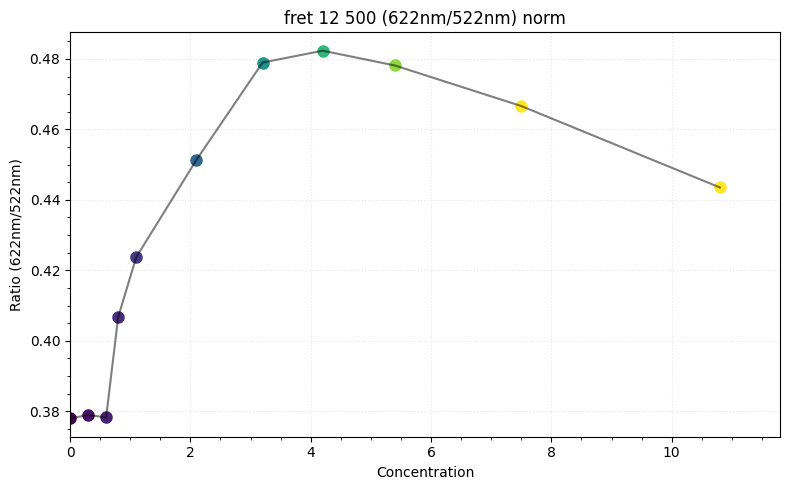

522 622


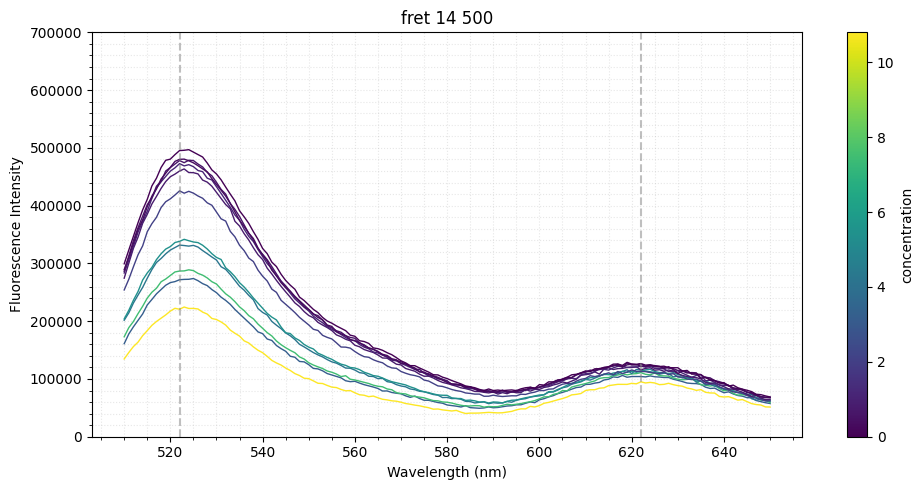

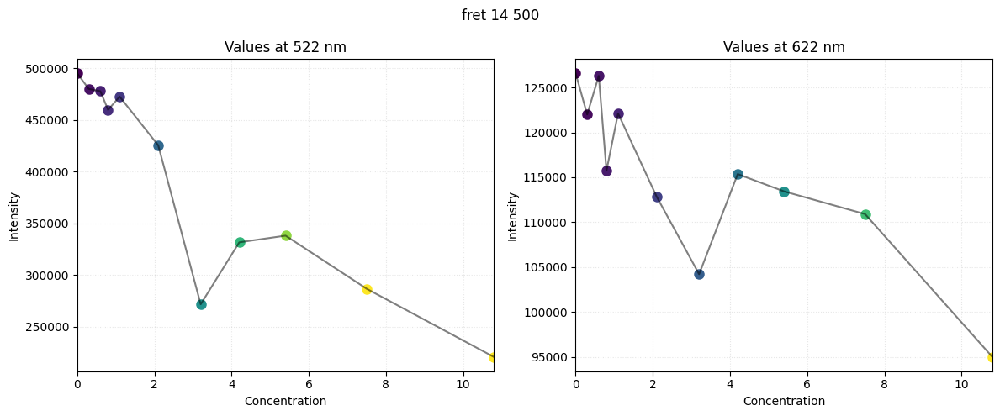

normalized values:
522nm
[495315.14614 480166.0772  478005.10707 459937.61456 472717.78497
 425592.29895 271754.9891  331720.05364 338180.68598 286785.24181
 220678.86353]
622nm
[126575.41993 121994.95425 126292.67514 115736.86945 122108.05217
 112852.87254 104219.73147 115359.87639 113437.21179 110911.35828
  95002.25115]
ratio
[0.25554522 0.25406825 0.26420779 0.25163602 0.25831068 0.26516662
 0.38350623 0.34776274 0.33543374 0.38674012 0.4305    ]


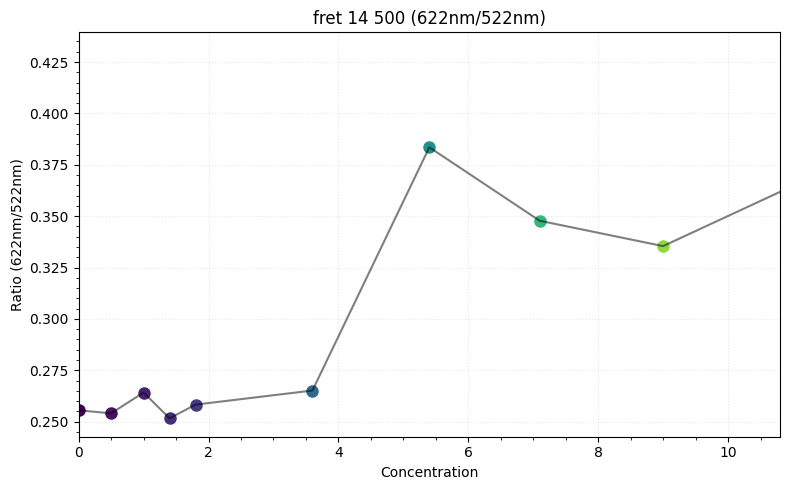

522 622


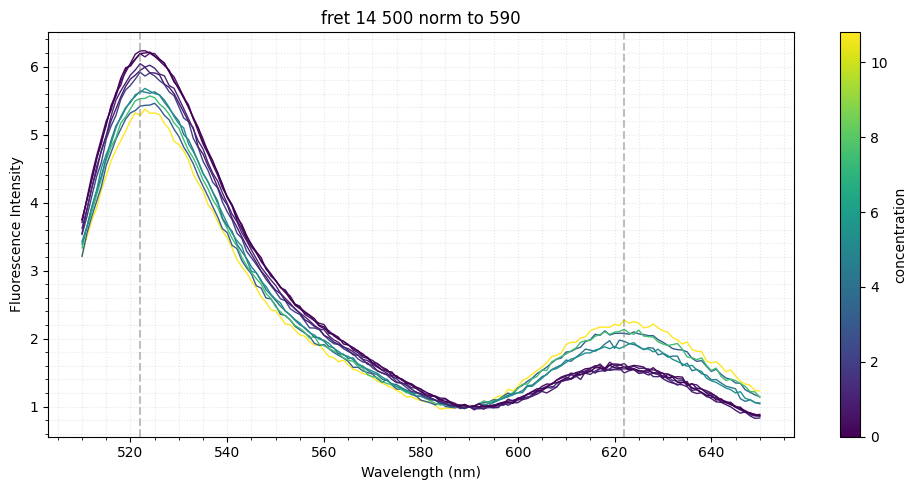

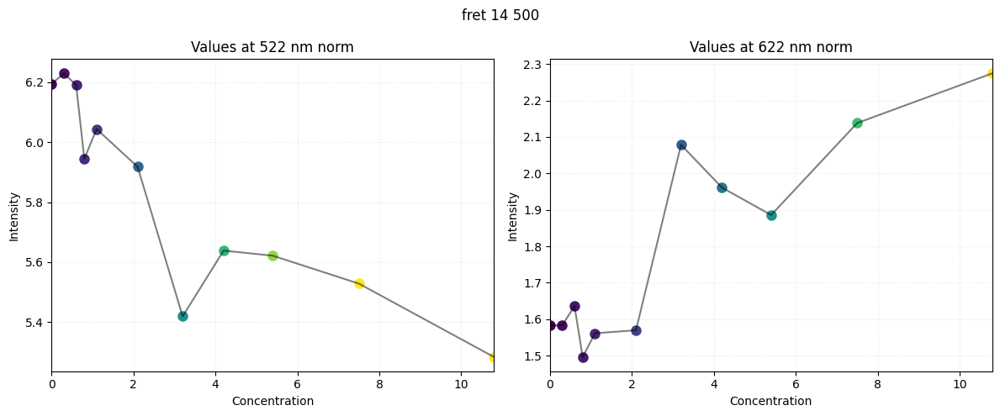

normalized values:
522nm
[6.19397311 6.23009381 6.19128804 5.94488642 6.04410552 5.91827294
 5.41951938 5.6386755  5.62169019 5.52862062 5.28365249]
622nm
[1.58284024 1.58286902 1.63578656 1.49594754 1.561257   1.56932845
 2.07841945 1.96092127 1.88570456 2.13813939 2.2746124 ]
ratio
[0.25554522 0.25406825 0.26420779 0.25163602 0.25831068 0.26516662
 0.38350623 0.34776274 0.33543374 0.38674012 0.4305    ]


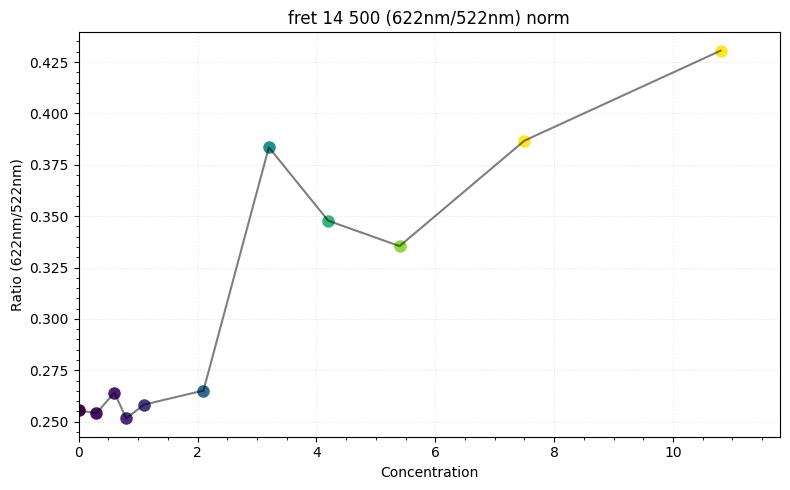

In [ ]:
fret_base = {}
values_522_all = {}
values_622_all = {}
for sheet in ['fret 12 500', 'fret 14 500']:
    # Get data and prepare for plotting
    data = fretdata2[sheet]
    data.index = data.iloc[:,0]
    data = data.iloc[:,1:]

    # Sort columns by their maximum values
    sorted_columns = data.max().sort_values().index
    data = data[sorted_columns]  # Reorder the dataframe columns
    
    # Variables to store values at 522 and 622nm
    values_522 = []
    values_622 = []
    column_labels = []
    
    # Find closest wavelengths to 522 and 622
    min_wl = data.index.min()
    max_wl = data.index.max()
    closest_522 = min(data.index, key=lambda x: abs(x - 522)) if 522 >= min_wl and 522 <= max_wl else None
    closest_622 = min(data.index, key=lambda x: abs(x - 622)) if 622 >= min_wl and 622 <= max_wl else None
    
    # Create the main spectral plot
    fig = plt.figure(figsize=(10, 5))
    ax = fig.add_subplot(111)
    
    # Create viridis colormap for column numbers
    num_cols = (data.columns)
    cmap = plt.cm.viridis
    norm = mpl.colors.Normalize(vmin=0, vmax=conc_correction[18.0])
    print(closest_522, closest_622)
    
    # Plot each column with color from viridis
    for i, col in enumerate(data.columns):
        try:
            col_value = float(col)
            corrected_conc = conc_correction[col_value] if col_value in conc_correction else col_value
            color = cmap(norm(corrected_conc))
            ax.plot(data.index, data[col], color=color, label=col, lw=1)
            column_labels.append(col)
        except (ValueError, TypeError):
            color = cmap(0)
            ax.plot(data.index, data[col], color=color, label=col, lw=1)
            column_labels.append(col)
        
        # Extract values at key wavelengths while plotting
        if closest_522 is not None:
            values_522.append(data.loc[closest_522, col])
        if closest_622 is not None:
            values_622.append(data.loc[closest_622, col])
    
    # Add vertical lines at 522 and 622nm
    if closest_522 is not None:
        ax.axvline(x=closest_522, color='grey', linestyle='--', alpha=0.5, label=f'{closest_522}nm')
    if closest_622 is not None:
        ax.axvline(x=closest_622, color='grey', linestyle='--', alpha=0.5, label=f'{closest_622}nm')
    
    # Add colorbar
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax)
    cbar.set_label('concentration')
    
    # Format plot
    ax.set_ylim(0, 7e5)
    ax.set_xlabel('Wavelength (nm)')
    ax.set_ylabel('Fluorescence Intensity')
    ax.set_title(f'{sheet}')
    ax.minorticks_on()
    ax.grid(which="both", alpha=0.3, ls=":")
    
        
    plt.tight_layout()
    plt.show()

    
    # Now plot the extracted values in a new figure with x-axis from 0 to 18
    if (closest_522 is not None) or (closest_622 is not None):
        fig2, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
        
        # Ensure column_labels are properly sorted for x-axis
        # Convert column labels to float and sort them
        x_vals = [float(col) for col in column_labels]
        sort_indices = np.argsort(x_vals)  # Get indices that would sort
        x_vals_sorted = np.array(x_vals)[sort_indices]
        
        # Plot values at 522 nm if available
        if closest_522 is not None:
            values_522_sorted = np.array(values_522)[sort_indices]
            
            # Plot with simple lines - no errorbars
            for i, (x, y) in enumerate(zip(x_vals_sorted, values_522_sorted)):
                color = cmap(norm(x_vals_sorted[i]))
                corrected_x = conc_correction[x] if x in conc_correction else x
                ax1.plot(corrected_x, y, 'o', color=color, markersize=8)
            
            # Connect points with a line
            corrected_x_vals = [conc_correction[val] if val in conc_correction else val for val in x_vals_sorted]
            ax1.plot(corrected_x_vals, values_522_sorted, 'k-', alpha=0.5)
            
            ax1.set_title(f'Values at {closest_522} nm')
            ax1.set_xlabel('Concentration')
            ax1.set_ylabel('Intensity')
            ax1.grid(alpha=0.3, ls=':')
            # Ensure x-axis goes from 0 to max
            ax1.set_xlim(0, max(corrected_x_vals))
        
        # Plot values at 622 nm if available
        if closest_622 is not None:
            values_622_sorted = np.array(values_622)[sort_indices]
            
            # Plot with simple lines - no errorbars
            for i, (x, y) in enumerate(zip(x_vals_sorted, values_622_sorted)):
                original_conc = x_vals_sorted[i]
                corrected_conc = conc_correction[original_conc] if original_conc in conc_correction else original_conc
                color = cmap(norm(corrected_conc))
                corrected_x = conc_correction[x] if x in conc_correction else x
                ax2.plot(corrected_x, y, 'o', color=color, markersize=8)
            
            # Connect points with a line
            corrected_x_vals = [conc_correction[val] if val in conc_correction else val for val in x_vals_sorted]
            ax2.plot(corrected_x_vals, values_622_sorted, 'k-', alpha=0.5)
            
            
            ax2.set_title(f'Values at {closest_622} nm')
            ax2.set_xlabel('Concentration')
            ax2.set_ylabel('Intensity')
            ax2.grid(alpha=0.3, ls=':')
            # Ensure x-axis goes from 0 to max
            ax2.set_xlim(0, max(corrected_x_vals))
        
        fig2.suptitle(f'{sheet}')
        plt.tight_layout()
        plt.show()

    # After your existing plotting code, add this to create a ratio plot
    if closest_522 is not None and closest_622 is not None:
        # Create a third figure for the ratio
        fig3 = plt.figure(figsize=(8, 5))
        ax3 = fig3.add_subplot(111)
        
        # Calculate ratio (622nm/522nm)
        ratio_values = values_622_sorted / values_522_sorted
        fret_base[sheet] = ratio_values
        values_622_all[sheet] = values_622_sorted
        values_522_all[sheet] = values_522_sorted
        print("522nm")
        print(values_522_sorted)
        print("622nm")
        print(values_622_sorted)
        print("ratio")
        print(ratio_values)
        
        # Plot individual points with viridis colors for consistency
        for i, (x, y) in enumerate(zip(x_vals_sorted, ratio_values)):
            color = cmap(norm(x_vals_sorted[i]))
            ax3.plot(x, y, 'o', color=color, markersize=8)
        
        # Connect points with a line
        ax3.plot(x_vals_sorted, ratio_values, 'k-', alpha=0.5)
        
        # Format plot
        ax3.set_title(f'{sheet} (622nm/522nm)')
        ax3.set_xlabel('Concentration')
        ax3.set_ylabel('Ratio (622nm/522nm)')
        ax3.grid(alpha=0.3, ls=':')
        ax3.set_xlim(0, max(corrected_x_vals))
        ax3.minorticks_on()
        
        plt.tight_layout()
        plt.show()

    # Normalized plots
    data_norm = data / data.loc[590]

    fig = plt.figure(figsize=(10, 5))
    ax = fig.add_subplot(111)
    
    # Create viridis colormap for column numbers
    num_cols = (data.columns)
    cmap = plt.cm.viridis
    norm = mpl.colors.Normalize(vmin=0, vmax=conc_correction[18.0])
    print(closest_522, closest_622)

    values_522_norm = []
    values_622_norm = []
    column_labels = []
    
    # Plot each column with color from viridis
    for i, col in enumerate(data_norm.columns):
        try:
            col_value = float(col)
            corrected_conc = conc_correction[col_value] if col_value in conc_correction else col_value
            color = cmap(norm(corrected_conc))
            ax.plot(data.index, data_norm[col], color=color, label=col, lw=1)
            column_labels.append(col)
        except (ValueError, TypeError):
            color = cmap(0)
            ax.plot(data.index, data_norm[col], color=color, label=col, lw=1)
            column_labels.append(col)
        
        # Extract values at key wavelengths while plotting
        if closest_522 is not None:
            values_522_norm.append(data_norm.loc[closest_522, col])
        if closest_622 is not None:
            values_622_norm.append(data_norm.loc[closest_622, col])
    
    # Add vertical lines at 522 and 622nm
    if closest_522 is not None:
        ax.axvline(x=closest_522, color='grey', linestyle='--', alpha=0.5, label=f'{closest_522}nm')
    if closest_622 is not None:
        ax.axvline(x=closest_622, color='grey', linestyle='--', alpha=0.5, label=f'{closest_622}nm')
    
    # Add colorbar
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax)
    cbar.set_label('concentration')
    
    # Format plot
    #ax.set_ylim(0, 7e5)
    ax.set_xlabel('Wavelength (nm)')
    ax.set_ylabel('Fluorescence Intensity')
    ax.set_title(f'{sheet} norm to 590')
    ax.minorticks_on()
    ax.grid(which="both", alpha=0.3, ls=":")
    
        
    plt.tight_layout()
    plt.show()

    # Now plot the extracted values in a new figure with x-axis from 0 to 18
    if (closest_522 is not None) or (closest_622 is not None):
        fig2, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
        
        # Ensure column_labels are properly sorted for x-axis
        # Convert column labels to float and sort them
        x_vals = [float(col) for col in column_labels]
        sort_indices = np.argsort(x_vals)  # Get indices that would sort
        x_vals_sorted = np.array(x_vals)[sort_indices]
        
        # Plot values at 522 nm if available
        if closest_522 is not None:
            values_522_sorted = np.array(values_522_norm)[sort_indices]
            
            # Plot with simple lines - no errorbars
            for i, (x, y) in enumerate(zip(x_vals_sorted, values_522_sorted)):
                color = cmap(norm(x_vals_sorted[i]))
                corrected_x = conc_correction[x] if x in conc_correction else x
                ax1.plot(corrected_x, y, 'o', color=color, markersize=8)
            
            # Connect points with a line
            corrected_x_vals = [conc_correction[val] if val in conc_correction else val for val in x_vals_sorted]
            ax1.plot(corrected_x_vals, values_522_sorted, 'k-', alpha=0.5)
            
            ax1.set_title(f'Values at {closest_522} nm norm')
            ax1.set_xlabel('Concentration')
            ax1.set_ylabel('Intensity')
            ax1.grid(alpha=0.3, ls=':')
            # Ensure x-axis goes from 0 to max
            ax1.set_xlim(0, max(corrected_x_vals))
        
        # Plot values at 622 nm if available
        if closest_622 is not None:
            values_622_sorted = np.array(values_622_norm)[sort_indices]
            
            # Plot with simple lines - no errorbars
            for i, (x, y) in enumerate(zip(x_vals_sorted, values_622_sorted)):
                original_conc = x_vals_sorted[i]
                corrected_conc = conc_correction[original_conc] if original_conc in conc_correction else original_conc
                color = cmap(norm(corrected_conc))
                corrected_x = conc_correction[x] if x in conc_correction else x
                ax2.plot(corrected_x, y, 'o', color=color, markersize=8)
            
            # Connect points with a line
            corrected_x_vals = [conc_correction[val] if val in conc_correction else val for val in x_vals_sorted]
            ax2.plot(corrected_x_vals, values_622_sorted, 'k-', alpha=0.5)
            
            
            ax2.set_title(f'Values at {closest_622} nm norm')
            ax2.set_xlabel('Concentration')
            ax2.set_ylabel('Intensity')
            ax2.grid(alpha=0.3, ls=':')
            # Ensure x-axis goes from 0 to max
            ax2.set_xlim(0, max(corrected_x_vals))
        
        fig2.suptitle(f'{sheet}')
        plt.tight_layout()
        plt.show()

        # After your existing plotting code, add this to create a ratio plot
    if closest_522 is not None and closest_622 is not None:
        # Create a third figure for the ratio
        fig3 = plt.figure(figsize=(8, 5))
        ax3 = fig3.add_subplot(111)
        
        # Calculate ratio (622nm/522nm)
        ratio_values =  values_622_sorted / values_522_sorted
        print("normalized values:")
        print("522nm")
        print(values_522_sorted)
        print("622nm")
        print(values_622_sorted)
        print("ratio")
        print(ratio_values)
        
        # Plot individual points with viridis colors for consistency
        for i, (x, y) in enumerate(zip(x_vals_sorted, ratio_values)):
            color = cmap(norm(x_vals_sorted[i]))
            corrected_x = conc_correction[x] if x in conc_correction else x
            ax3.plot(corrected_x, y, 'o', color=color, markersize=8)
        
        # Connect points with a line
        corrected_x_vals = [conc_correction[val] if val in conc_correction else val for val in x_vals_sorted]
        ax3.plot(corrected_x_vals, ratio_values, 'k-', alpha=0.5)
        
        # Format plot
        ax3.set_title(f'{sheet} (622nm/522nm) norm')
        ax3.set_xlabel('Concentration')
        ax3.set_ylabel('Ratio (622nm/522nm)')
        ax3.grid(alpha=0.3, ls=':')
        ax3.set_xlim(0, max(corrected_x_vals)+1)
        ax3.minorticks_on()
    
        
        plt.tight_layout()
        plt.show()

In [ ]:
values_522_all
values_622_all
fret_base

In [101]:
peaks_df

,0(4k_488_12),18(4k_488_12),0(4k_488_14),18(4k_488_14),0(2k_488_12),18(2k_488_12),0(2k_488_14),18(2k_488_14),0(4k_590_12),18(4k_590_12),0(4k_590_14),18(4k_590_14),0(2k_590_12),18(2k_590_12),0(2k_590_14),18(2k_590_14)
0,295243.47197,154713.57953,480381.43161,302803.15441,567748.48850,310444.52300,9.948186e+05,529905.52021,118696.26498,102259.36756,140505.31350,118771.66359,306005.26689,214113.20849,353732.58830,303630.21061
1,307162.22473,161263.32404,491334.80253,305810.69015,578575.61718,291924.04362,1.017990e+06,692943.66164,116905.54794,104427.07765,136037.94574,115491.82397,308644.21831,220484.39121,364062.19815,287004.81666
2,306233.97296,157275.55442,488104.48636,280525.11185,545522.42804,288211.03653,1.017770e+06,592618.21000,124162.66435,105256.46238,132645.00820,115736.86945,283385.68329,226497.43052,340311.63536,319482.76879
3,304028.44675,152448.64520,478383.83379,321680.08246,576771.09573,276849.23483,1.029970e+06,552436.04725,118017.67747,101241.48629,134247.22871,107405.32283,291830.32783,275336.88145,337314.54054,303611.36096
4,292985.96365,167597.71414,498864.78092,322697.44641,572790.75213,282017.74070,1.010160e+06,594133.11690,122371.94731,97151.11159,138224.50549,112626.67671,281048.32631,242444.23696,338634.01625,320802.24450


In [103]:
decreases

,decrease_percent,decrease_error,absolute_change,initial_value,final_value
488_12,49.073493,3.184805,0.495043,1.008779,0.513736
488_14,39.795715,5.674751,0.398951,1.002497,0.603546
590_12,15.815894,7.619503,0.156647,0.990443,0.833795
590_14,13.236627,4.449719,0.131211,0.991276,0.860064


                FDA             FD   FDA/FDX         E      E/EX    Fd/Fdx
0.0   388982.005066  568281.676316  0.684488  0.535286  1.696563  1.000000
0.3   376785.364328  560535.129983  0.672189  0.535286  1.632909  1.013820
0.6   378721.908098  552788.583650  0.685112  0.535286  1.699923  1.028027
0.8   364161.230920  547624.219428  0.664984  0.535286  1.597791  1.037722
1.1   333230.432420  539877.673095  0.617233  0.535286  1.398465  1.052612
2.1   291047.886862  514055.851985  0.566180  0.535286  1.233888  1.105486
3.2   198742.739930  485651.848764  0.409229  0.535286  0.906080  1.170142
4.2   217175.626854  459830.027654  0.472295  0.535286  1.014367  1.235852
5.4   237882.206682  428843.842322  0.554706  0.535286  1.202095  1.325148
7.5   209303.031786  374618.017991  0.558711  0.535286  1.213004  1.516963
10.8  204472.977912  289406.008328  0.706526  0.535286  1.823966  1.963614


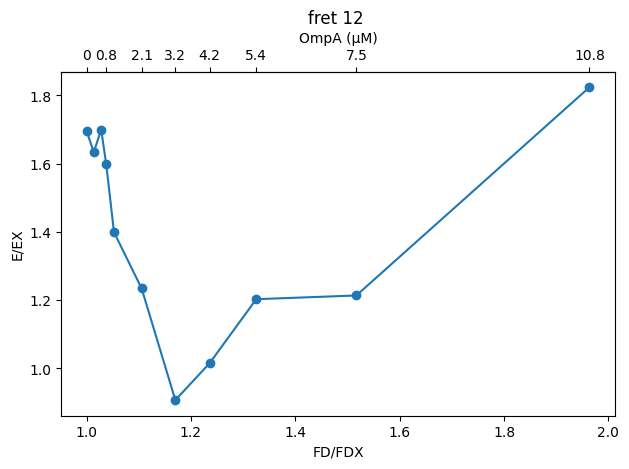

                FDA             FD   FDA/FDX         E      E/EX    Fd/Fdx
0.0   493800.817298  568281.676316  0.868937  0.293474  2.239175  1.000000
0.3   477820.945194  565785.042199  0.844527  0.293474  1.887622  1.004413
0.6   476181.836502  563288.408081  0.845361  0.293474  1.897794  1.008864
0.8   458477.267498  561623.985336  0.816342  0.293474  1.597936  1.011854
1.1   469074.546808  559127.351219  0.838940  0.293474  1.822143  1.016373
2.1   422385.019624  550805.237494  0.766850  0.293474  1.258733  1.031729
3.2   271794.806056  541650.912396  0.501790  0.293474  0.589056  1.049166
4.2   330229.261590  533328.798671  0.619185  0.293474  0.770646  1.065537
5.4   338483.283654  523342.262201  0.646772  0.293474  0.830834  1.085870
7.5   287107.786352  505865.823379  0.567557  0.293474  0.678641  1.123384
10.8  222320.495546  478402.848086  0.464714  0.293474  0.548256  1.187873


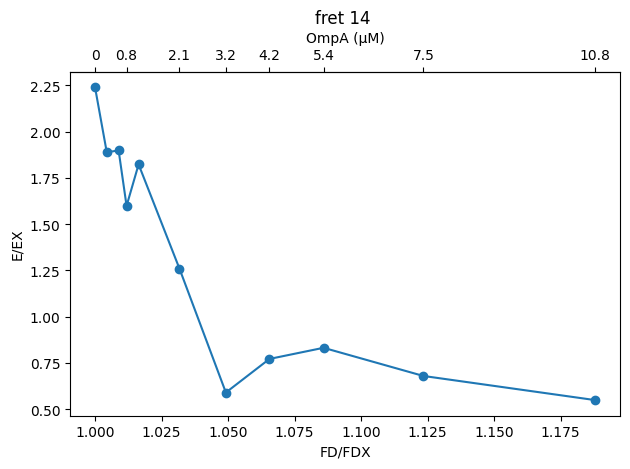

In [67]:
def calc_fdx(max_fdx,  conc):
    return 1.0 + (max_fdx - 1.0) * ((conc - 0.0) / (conc_correction[18.0] - 0.0))


original_concs = [0,0.5,1.0,1.4,1.8,3.6,5.4,7.1,9.0,12.5,18]
for condition in ["fret 12 500","fret 14 500"]:
    e_ex_ratio = []
    fd_fdx_ratio = []
    data = fretdata2[condition]
    data.index = fretdata2[condition].iloc[:,0]
    data = fretdata2[condition].iloc[:,1:]
    data = data[sorted(data.columns)]
    #print(data)
    E = None
    F_D = None
    #print(E,F_D)
    df = pd.DataFrame([])
    for d, conc in zip(data.items(),[conc_correction[c] for c in [0,0.5,1.0,1.4,1.8,3.6,5.4,7.1,9.0,12.5,18]]):
        #print(d[1])
        liposome = "488_12" if "12" in condition else "590_12"
        F_D_X_MAX = 1 - (decreases["decrease_percent"][liposome] / 100)
        F_DX = peaks_df["0(2k_488_12)"].mean() * calc_fdx(F_D_X_MAX, conc)
        F_DA = d[1].loc[521:525].mean()
        if conc == 0: E = E_X; F_D = F_DX
        E_X = 1 - F_DA / F_DX
        #print(F_DA, "\t\t", F_DX, "\t\t", E_X)
        #print("conc, E, EX   ", conc, "\t", E, E_X)
        e_ex_ratio.append(E/E_X)
        fd_fdx_ratio.append(F_D / F_DX)
        df = pd.concat([df,pd.DataFrame({"FDA":F_DA, "FD": F_DX, "FDA/FDX": F_DA/F_DX, "E":E, "E/EX": E/E_X, "Fd/Fdx": F_D/F_DX}, index=[conc])])

    print(df)
    #print(e_ex_ratio)
    #print(fd_fdx_ratio)
    fig = plt.figure()
    ax = fig.add_subplot(111)
    ax.plot(fd_fdx_ratio, e_ex_ratio, marker = "o")
    ax.set_ylabel("E/EX")
    ax.set_xlabel("FD/FDX")
    #ax.set_xlim([0,2])
    
    secax = ax.secondary_xaxis("top")
    corrected_concs = [conc_correction[c] for c in original_concs]
    selected_indices = [0, 3, 5, 6, 7, 8, 9, 10]
    secax.set_xticks([fd_fdx_ratio[i] for i in selected_indices])
    secax.set_xticklabels([f"{corrected_concs[i]}" for i in selected_indices])
    secax.set_xlabel('OmpA (μM)')
    plt.title(f"{condition.replace('500','')}")
    
    plt.tight_layout()
    plt.show()

# Anisotropy

In [72]:
ani = pd.read_excel("data/3004_AI.xlsx", sheet_name=None)

In [55]:
ani.keys()

dict_keys(['12a488', '12a590', '14a488', '14a590', '12kinetic', '14kinetic'])

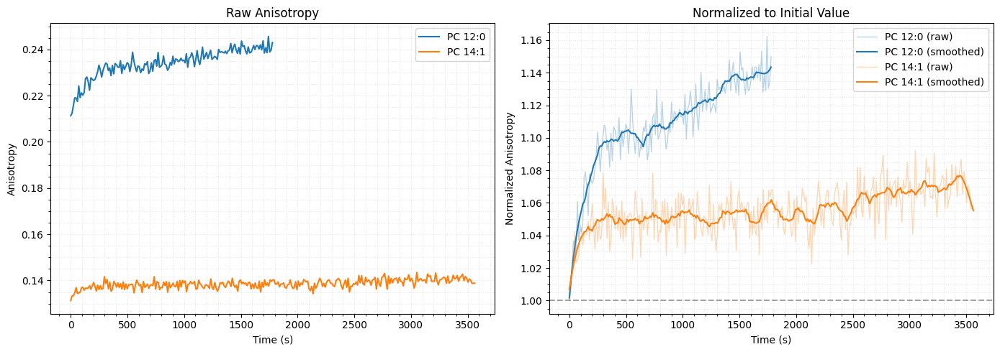

In [73]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

# Color mapping for consistent colors
colors = {'12kinetic': 'C0', '14kinetic': 'C1'}
labels = {'12kinetic': 'PC 12:0', '14kinetic': 'PC 14:1'}

# Left subplot: Original values
for sheet in ['12kinetic', '14kinetic']:
    x_vals = ani[sheet].iloc[:, 0]
    y_vals = ani[sheet].iloc[:, 1]
    line, = ax1.plot(x_vals, y_vals, label=labels[sheet])
    colors[sheet] = line.get_color()  # Get the auto-assigned color
    
    y_norm = y_vals / y_vals.iloc[0]  # Normalize to first value
    
    ax2.plot(x_vals, y_norm, alpha=0.3, lw=1, color=colors[sheet], label=f'{labels[sheet]} (raw)')
    
    y_smooth = savgol_filter(y_norm, 20, 3)
    ax2.plot(x_vals, y_smooth, lw=1.5, 
             color=colors[sheet], label=f'{labels[sheet]} (smoothed)')

# Format left subplot    
ax1.set_xlabel('Time (s)')
ax1.set_ylabel('Anisotropy')
ax1.set_title('Raw Anisotropy')
ax1.legend()
ax1.minorticks_on()
ax1.grid(which="both", alpha=0.3, ls=":")

# Format right subplot
ax2.set_xlabel('Time (s)')
ax2.set_ylabel('Normalized Anisotropy')
ax2.set_title('Normalized to Initial Value')
ax2.legend()
ax2.minorticks_on()
ax2.grid(which="both", alpha=0.3, ls=":")

# Draw horizontal line at y=1 in normalized plot
ax2.axhline(y=1, color='gray', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

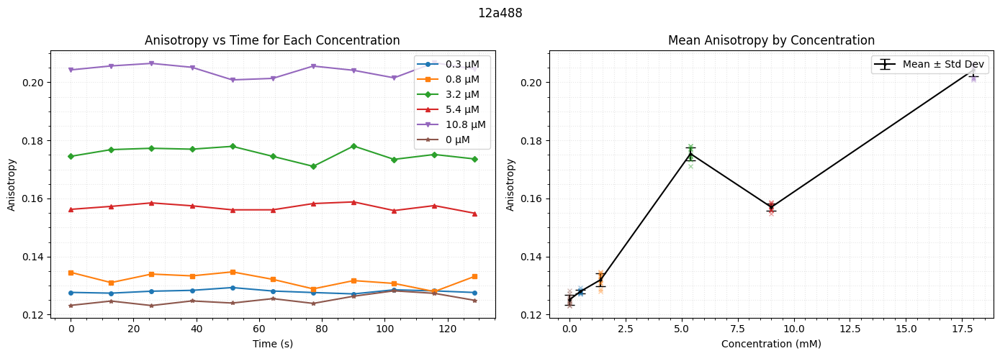

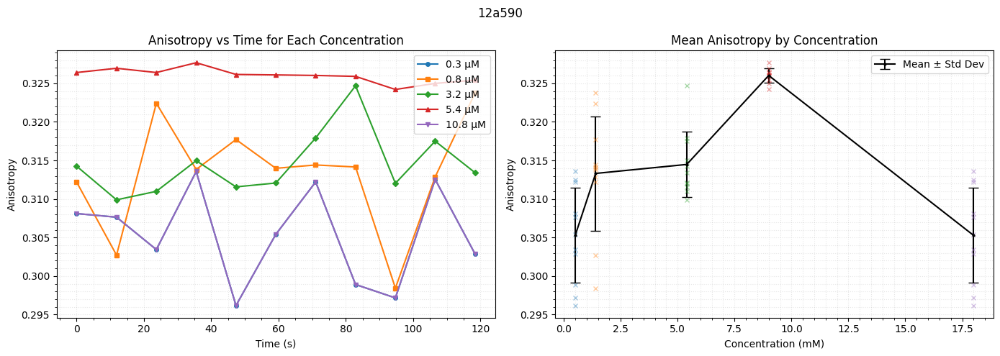

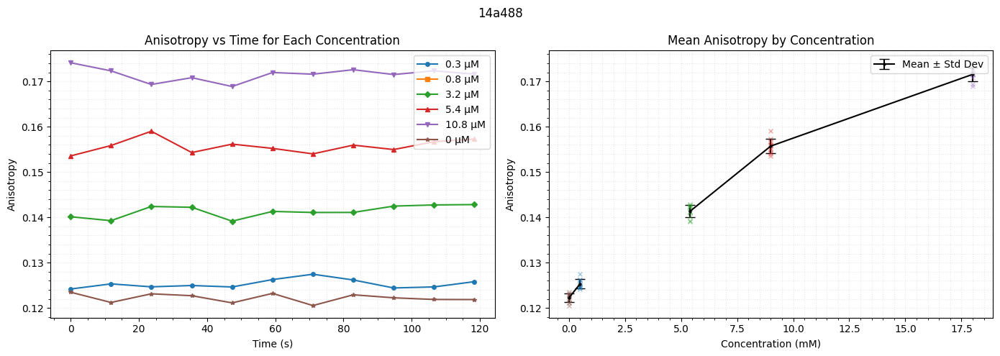

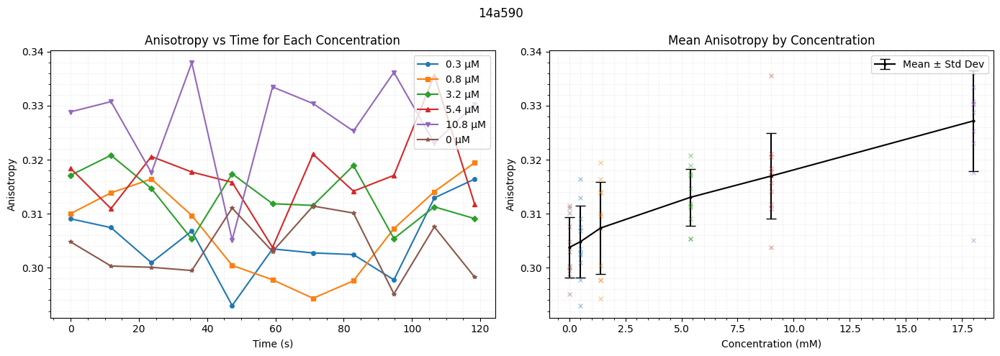

In [76]:
for sheet in ['12a488', '12a590', '14a488', '14a590']:
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

    # Color mapping for consistent colors across plots
    colors = {}
    markers = ['o', 's', 'D', '^', 'v', '*']

    # LEFT SUBPLOT: Time series for each concentration
    df = ani[sheet]
    time_col = df.columns[0]  # First column is time
    if sheet == "12a590": df = df.iloc[:,:-1]

    # Plot each concentration as a separate line over time
    for j, conc in enumerate(df.columns[1:]):
        line, = ax1.plot(df[time_col], df[conc], 
                            marker=markers[j % len(markers)], markersize=4, 
                            label=f'{conc_correction[conc]} μM')
        # Store the color for consistent use in right plot
        colors[conc] = line.get_color()

    # RIGHT SUBPLOT: Mean values with error bars
    mean_values = []
    std_values = []
    conc_labels = []

    for conc in df.columns[1:]:  # Skip the time column
        mean_values.append(df[conc].mean())
        std_values.append(df[conc].std())
        conc_labels.append(conc)

    # Convert to array for easier plotting
    conc_labels = np.array(conc_labels)
    mean_values = np.array(mean_values)
    std_values = np.array(std_values)

    # Sort by concentration for better visualization
    # (handling 0 mM specially to put it at the beginning)
    sort_idx = np.argsort([float(c) if c != '0' else 999 for c in conc_labels])
    conc_labels = conc_labels[sort_idx]
    mean_values = mean_values[sort_idx]
    std_values = std_values[sort_idx]

    # Convert string concentration labels to float for x-axis
    conc_float = np.array([float(c) if c != '0' else 0 for c in conc_labels])

    # Line plot with error bars
    ax2.errorbar(conc_float, mean_values, yerr=std_values, 
                marker='o', capsize=5, linestyle='-', linewidth=1.5,
                color='black', label='Mean ± Std Dev', markersize=2)

    # Add individual data points
    for time_idx in range(len(df)):
        data_points = []
        for i, conc in enumerate(conc_labels):
            value = df.iloc[time_idx][conc]
            data_points.append(ax2.plot(conc_float[i], value, 'x', 
                        color=colors[conc], alpha=0.4, markersize=4)[0])

    # Format left subplot
    ax1.set_xlabel('Time (s)')
    ax1.set_ylabel('Anisotropy')
    ax1.set_title('Anisotropy vs Time for Each Concentration')
    ax1.legend(loc = "upper right")
    ax1.minorticks_on()
    ax1.grid(which="both", alpha=0.3, ls=":")

    # Format right subplot
    ax2.set_xlabel('Concentration (mM)')
    ax2.set_ylabel('Anisotropy')
    ax2.set_title('Mean Anisotropy by Concentration')
    ax2.minorticks_on()
    ax2.grid(which="both", alpha=0.3, ls=":")
    ax2.legend(loc = "upper right")

    fig.suptitle(sheet)

    plt.tight_layout()
    plt.show()

# CD

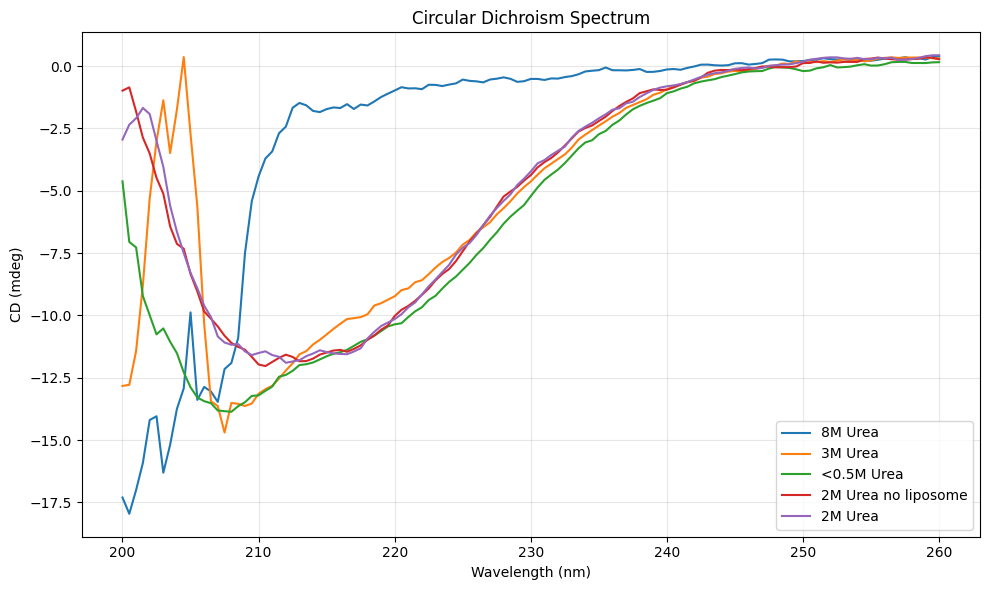

In [85]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

def extract_cd_data(filename):
    # Initialize lists to store data
    wavelengths = []
    cd_values = []
    ht_values = []
    
    # Flag to track when we're in the data section
    data_section = False
    
    # Read the file
    with open(filename, 'r') as file:
        for line in file:
            # Check if we've reached the data section
            if line.strip() == "XYDATA":
                data_section = True
                continue
            
            # If we're in the data section, parse the data
            if data_section:
                # Skip any lines that don't have numeric values
                if not line[0].isdigit():
                    # If we hit a line that starts with anything other than a number
                    # after the data section began, we're done with the data
                    if wavelengths:  # Only exit if we already have data
                        break
                    else:
                        continue
                
                # Split the line and extract values
                parts = line.strip().split()
                if len(parts) >= 3:
                    wavelengths.append(float(parts[0]))
                    cd_values.append(float(parts[1]))
                    ht_values.append(float(parts[2]))
    
    # Create a DataFrame
    data = pd.DataFrame({
        'Wavelength (nm)': wavelengths,
        'CD (mdeg)': cd_values,
        'HT (V)': ht_values
    })
    
    return data

def extract_cd_from_csv(filename):
   sheet = pd.read_csv(filename)
   print(sheet)

# Extract data
filenames = ["data/CD/ompa 8M-1.txt","data/CD/ompa 3M-1.txt","data/CD/ompa wenig-1.txt","data/CD/ompa_9-2.txt","data/CD/ompa_9-3.txt"]
label_dic = {
    "data/CD/ompa 8M-1.txt": "8M Urea",
    "data/CD/ompa 3M-1.txt": "3M Urea",
    "data/CD/ompa wenig-1.txt": "<0.5M Urea",
    "data/CD/ompa_9-2.txt": "2M Urea no liposome",
    "data/CD/ompa_9-3.txt": "2M Urea"
}
plt.figure(figsize=(10, 6))

for filename in filenames:
    cd_data = extract_cd_data(filename)

    #print(cd_data.head())

    # Create a simple plot of the CD data
    plt.plot(cd_data['Wavelength (nm)'], cd_data['CD (mdeg)'], label=label_dic[filename])
    plt.xlabel('Wavelength (nm)')
    plt.ylabel('CD (mdeg)')
    plt.title('Circular Dichroism Spectrum')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
plt.show()

# etc

# kinetics fluoresence

In [9]:
kin = pd.read_excel("data/1205.xlsx", sheet_name=None)

In [14]:
kin.keys()

dict_keys(['kintrp', 'kinatto', 'spectrp', 'specatto'])

In [11]:
kin["kintrp"].columns

Index(['Unnamed: 0', 'kat15_12', 'kat30_12', 'sa15_12', 'sa30_12', 'sa30_2',
       'ft15', 'ft30', 'ft15_14', 'ft30_14'],
      dtype='object')

In [12]:
def analyze_saturation(time, signal, threshold=0.95):
    """Find saturation point using exponential curve fitting"""
    
    # Convert to numpy arrays to avoid pandas indexing issues
    time_array = np.array(time)
    signal_array = np.array(signal)
    
    # Make sure inputs are valid
    if len(time_array) < 5 or not np.all(np.isfinite(signal_array)):
        return None, None
    
    # Define exponential rise to maximum function
    def exp_rise(t, ymax, k, y0):
        return ymax * (1 - np.exp(-k * t)) + y0
    
    # Smooth data to improve fit
    y_smooth = savgol_filter(signal_array, min(21, len(signal_array)-3), 3)
    
    # Initial parameter guesses
    p0 = [np.max(y_smooth), 0.1, min(y_smooth)]
    
    try:
        # Fit curve
        popt, _ = curve_fit(exp_rise, time_array, y_smooth, p0=p0, maxfev=10000)
        
        # Extract parameters
        ymax, k, y0 = popt
        
        # Calculate saturation time (analytically)
        t_sat = -np.log(1 - threshold) / k
        
        # If saturation time exceeds measurement time, return None
        if t_sat > time_array[-1]:  # Using numpy array indexing
            return None, popt
            
        return t_sat, popt
        
    except (RuntimeError, ValueError) as e:
        # Fit failed - use interpolation as fallback
        ymax = np.max(y_smooth)
        target = threshold * ymax
        
        # Check if signal reaches target
        if np.max(y_smooth) >= target:
            try:
                # Create interpolation function
                f = interp1d(y_smooth, time_array, bounds_error=False, fill_value=np.nan)
                # Find time at target
                t_sat = f(target)
                return t_sat, None
            except:
                return None, None
        else:
            return None, None

kat15_12
color (0, 0.3, 0)
kat15_12: Reaches 95% saturation at 1388.3 seconds
kat30_12
color (0, 0.6, 0)
kat30_12: Reaches 95% saturation at 1098.5 seconds
sa15_12
color (0.2, 0, 0)
sa15_12: Reaches 95% saturation at 754.1 seconds
sa30_12
color (0.7, 0, 0)
sa30_12: Reaches 95% saturation at 655.2 seconds
sa30_2
ft15
color (0, 0, 0.7)
ft15: Reaches 95% saturation at 1354.2 seconds
ft30
color (0, 0, 1.0)
ft30: Reaches 95% saturation at 1305.4 seconds
ft15_14
color (0, 0, 0.2)
ft15_14: Never reaches 95% saturation
ft30_14
color (0, 0, 0.5)
ft30_14: Reaches 95% saturation at 1661.8 seconds


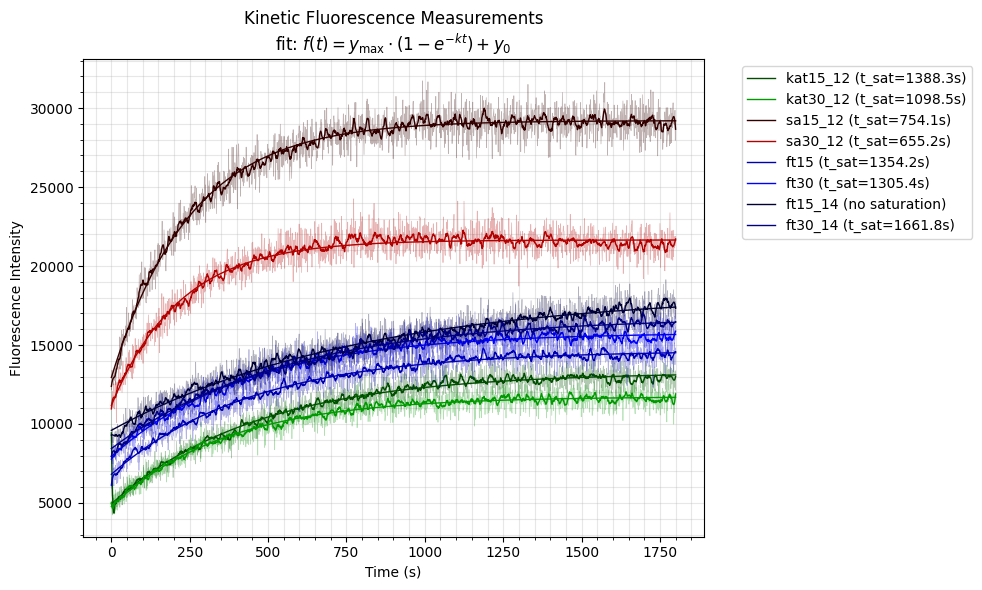

ft15
color (0, 0, 0.7)
ft15: Reaches 95% saturation at 626.6 seconds
ft30
color (0, 0, 1.0)
ft30: Reaches 95% saturation at 456.5 seconds
sa15
color (0.2, 0, 0)
sa15: Reaches 95% saturation at 467.2 seconds
sa30
color (0.7, 0, 0)
sa30: Reaches 95% saturation at 272.0 seconds
ft15_14
color (0, 0, 0.2)
ft15_14: Reaches 95% saturation at 1663.2 seconds
ft30_14
color (0, 0, 0.5)
ft30_14: Reaches 95% saturation at 872.3 seconds


C:\Users\Sasch\AppData\Local\Temp\ipykernel_63648\1858294546.py:14: RuntimeWarning: overflow encountered in multiply
  return ymax * (1 - np.exp(-k * t)) + y0
C:\Users\Sasch\AppData\Local\Temp\ipykernel_63648\1858294546.py:14: RuntimeWarning: overflow encountered in exp
  return ymax * (1 - np.exp(-k * t)) + y0


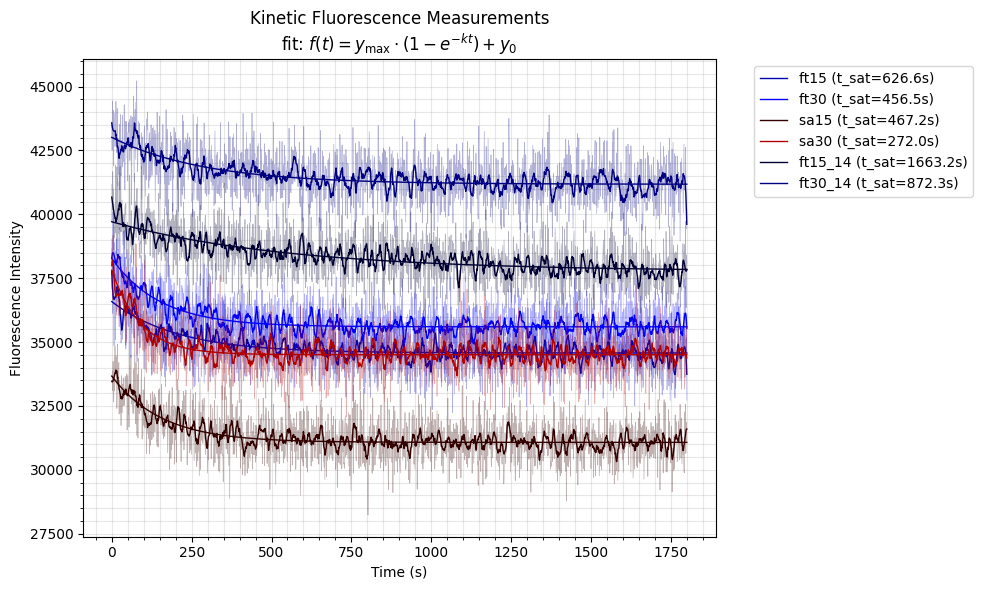

In [14]:
for sheet in ["kintrp","kinatto"]: 
    fig, ax = plt.subplots(figsize=(10, 6))
    # Get the dataframe
    df = kin[sheet]
    x_col = df.columns[0]
    x_data = df[x_col][:1801]

    # Create figure

    # Define color groups - same color family for related samples
    color_groups = {
        'ft': {'base': 'blue', 'variants': {'ft15': 0.7, 'ft30': 1.0,'ft15_14': 0.2, 'ft30_14': 0.5
                                            }},
        'sa': {'base': 'red', 'variants': {'sa15_12': 0.2, 'sa30_12': 0.7,"sa15":0.2, "sa30":0.7}},
        'kat': {'base': 'green', 'variants': {'kat15_12': 0.3, 'kat30_12': 0.6}}
    }

    # Create a color mapping dictionary
    colors = {}
    for group in color_groups.values():
        base = group['base']
        for variant, intensity in group['variants'].items():
            if base == 'blue':
                colors[variant] = (0, 0, intensity)
            elif base == 'green':
                colors[variant] = (0, intensity, 0)
            elif base == 'red':
                colors[variant] = (intensity, 0, 0)

    # Plot each column
    for col in df.columns[1:]:  # Skip the first column (time)
        print(col)
        if col == 'sa30_2': continue
        if col in colors:
            color = colors[col]
            ydata = df[col][:1801]
            print("color",colors[col])
            ax.plot(x_data, ydata, color=color, alpha=0.3, lw=0.5)
            
            t_sat, params = analyze_saturation(x_data, ydata)
            
            if t_sat is not None:
                print(f"{col}: Reaches 95% saturation at {t_sat:.1f} seconds")
            else:
                print(f"{col}: Never reaches 95% saturation")
            
            # Plot data and fitted curve if available
            
            if params is not None:
                # Plot fitted curve
                ymax, k, y0 = params
                y_fit = ymax * (1 - np.exp(-k * x_data)) + y0
                if t_sat is not None:
                    label_text = f'{col} (t_sat={t_sat:.1f}s)'
                else:
                    label_text = f'{col} (no saturation)'
                ax.plot(x_data, y_fit, color=color, linewidth=1, 
                        label=label_text)
                y_smooth = savgol_filter(ydata, 21, 3)
                ax.plot(x_data, y_smooth, color=color, linewidth=1)
            else:
                # Just plot smoothed data
                y_smooth = savgol_filter(ydata, 21, 3)
                ax.plot(x_data, y_smooth, color=color, linewidth=1, label=f'{col}')

    # Add labels and legend
    ax.set_xlabel('Time (s)')
    ax.set_ylabel('Fluorescence Intensity')
    ax.set_title('Kinetic Fluorescence Measurements\nfit: $f(t) = y_{\max} \cdot (1 - e^{-kt}) + y_0$')
    ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

    # Add minor ticks
    ax.minorticks_on()
    ax.grid(alpha=0.3,which="both")

    # Adjust layout to make room for legend
    plt.tight_layout()
    plt.show()

In [83]:
kinFT = pd.read_excel("data/kin.xlsx", sheet_name=None)

In [18]:
kinFT.keys()

dict_keys(['trp12', 'atto12', 'trp14', 'atto14'])

In [24]:
kinFT["trp14"]

,Unnamed: 0,30min,30min2,30min3
0,0,7490.89705,7838.83489,8227.70659
1,1,8575.64443,8411.90898,7961.63648
2,2,7900.23568,8186.77273,7941.16955
3,3,8207.23966,8002.57034,7449.96318
4,4,9189.65239,8186.77273,7593.23171
...,...,...,...,...
2101,2070,15125.06261,NaN,NaN
2102,2070,16987.55341,NaN,NaN
2103,2070,17560.62750,NaN,NaN
2104,2070,17396.89205,NaN,NaN


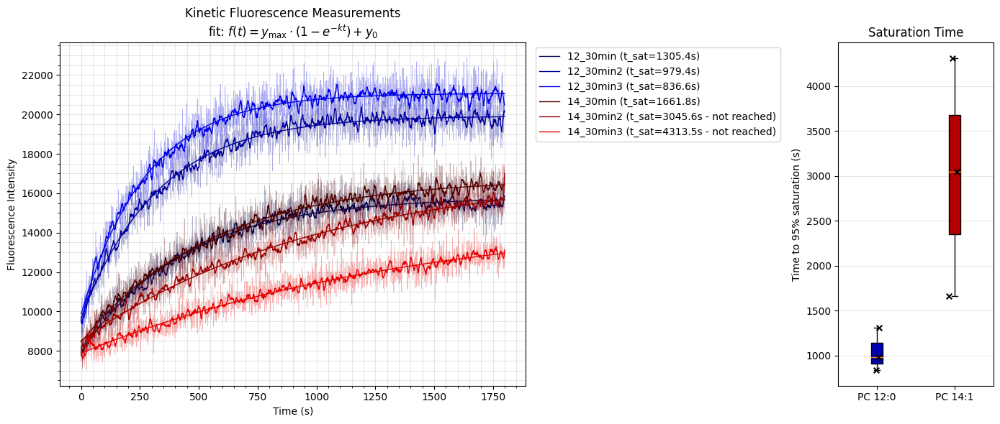

C:\Users\Sasch\AppData\Local\Temp\ipykernel_63648\1858294546.py:14: RuntimeWarning: overflow encountered in exp
  return ymax * (1 - np.exp(-k * t)) + y0
C:\Users\Sasch\AppData\Local\Temp\ipykernel_63648\1858294546.py:14: RuntimeWarning: overflow encountered in multiply
  return ymax * (1 - np.exp(-k * t)) + y0


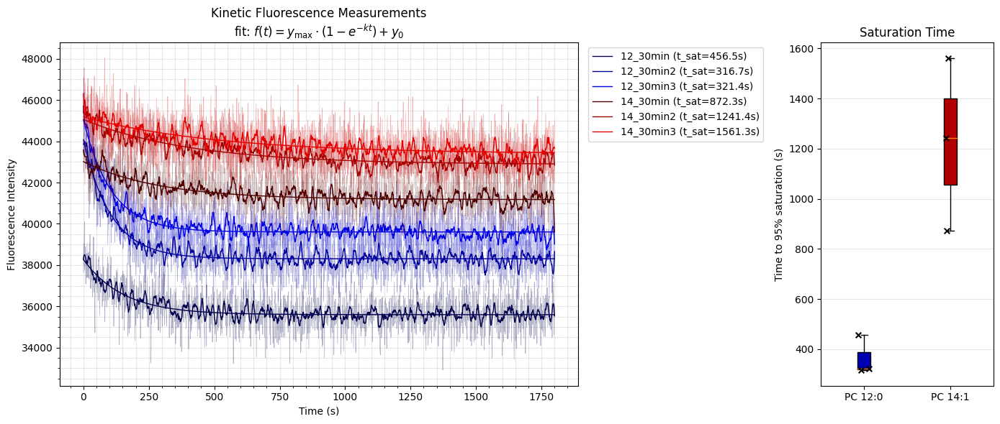

In [91]:
for sheet1,sheet2 in [['trp12', 'trp14'], ['atto12', 'atto14']]: 
    # Create figure with GridSpec for better control over axis placement
    fig = plt.figure(figsize=(14, 6))
    gs = fig.add_gridspec(1, 2, width_ratios=[3, 1])  # Main plot 3x width of boxplot
    ax = fig.add_subplot(gs[0])  # Main plot on left
    ax_box = fig.add_subplot(gs[1])  # Boxplot on right
    
    # Get the dataframe
    df1 = kinFT[sheet1]
    df2 = kinFT[sheet2]
    x_col = df1.columns[0]
    x_data = df1[x_col][:1801]
    df = pd.concat([df1.iloc[:1801,:],df2.iloc[:1801,1:]], axis=1)
    
    # Create color groups - blue for 12, red for 14
    color_groups = {
        '12': {'base': 'blue', 'variants': {'12_30min': 0.3, '12_30min2': 0.6, '12_30min3': 0.9}},
        '14': {'base': 'red', 'variants': {'14_30min': 0.3, '14_30min2': 0.6, '14_30min3': 0.9}}
    }
    
    # Create color mapping dictionary
    colors = {}
    for group, properties in color_groups.items():
        base = properties['base']
        for variant, intensity in properties['variants'].items():
            if base == 'blue':
                colors[variant] = (0, 0, intensity)
            elif base == 'red':
                colors[variant] = (intensity, 0, 0)
            elif base == 'green':
                colors[variant] = (0, intensity, 0)
    
    # Lists to collect saturation times for boxplot
    t_sat_12 = []
    t_sat_14 = []
    
    # Plot each column
    for col in df.columns[1:]:  # Skip the first column (time)
        if col in colors:
            color = colors[col]
            ydata = df[col][:1801]
            ax.plot(x_data, ydata, color=color, alpha=0.3, lw=0.5)
            
            # Analyze saturation with a safer window length
            window_length = min(21, len(ydata) - 3)
            if window_length % 2 == 0:  # Make sure it's odd
                window_length -= 1
            window_length = max(5, window_length)  # At least 5
            
            try:
                t_sat, params = analyze_saturation(x_data, ydata)
                
                # Record saturation time for boxplot
                if col.startswith('12_'):
                    t_sat_12.append(t_sat if t_sat is not None else -np.log(1 - 0.95) / params[1])
                elif col.startswith('14_'):
                    t_sat_14.append(t_sat if t_sat is not None else -np.log(1 - 0.95) / params[1])
                
                if params is not None:
                    # Plot fitted curve
                    ymax, k, y0 = params
                    y_fit = ymax * (1 - np.exp(-k * x_data)) + y0
                    
                    # Calculate theoretical saturation point even if it's not reached
                    theoretical_t_sat = -np.log(1 - 0.95) / k
                    
                    if t_sat is not None:
                        label_text = f'{col} (t_sat={t_sat:.1f}s)'
                    else:
                        label_text = f'{col} (t_sat={theoretical_t_sat:.1f}s - not reached)'
                        
                    ax.plot(x_data, y_fit, color=color, linewidth=1, label=label_text)
                    
                    if len(ydata) >= window_length:
                        y_smooth = savgol_filter(ydata, window_length, 3)
                        ax.plot(x_data, y_smooth, color=color, linewidth=1)
                else:
                    # Just plot smoothed data
                    if len(ydata) >= window_length:
                        y_smooth = savgol_filter(ydata, window_length, 3)
                        ax.plot(x_data, y_smooth, color=color, linewidth=1, label=f'{col}')
            except Exception as e:
                print(f"Error processing {col}: {e}")
                # Just plot smoothed data as fallback
                if len(ydata) >= window_length:
                    y_smooth = savgol_filter(ydata, window_length, 3)
                    ax.plot(x_data, y_smooth, color=color, linewidth=1, label=f'{col}')
    
    # Create boxplot for saturation times
    boxplot_data = [t_sat_12, t_sat_14]
    labels = ['PC 12:0', 'PC 14:1']
    
    # Plot boxplots with the respective group colors
    bp = ax_box.boxplot(boxplot_data, patch_artist=True, labels=labels)
    
    # Color the boxes according to the group colors
    bp['boxes'][0].set_facecolor((0, 0, 0.7))  # Blue for PC 12:0
    bp['boxes'][1].set_facecolor((0.7, 0, 0))  # Red for PC 14:1
    
    # Add individual data points
    for i, data in enumerate(boxplot_data):
        # Spread points horizontally for better visibility
        x = np.random.normal(i+1, 0.04, size=len(data))
        ax_box.scatter(x, data, alpha=1, 
                      color="black", 
                      s=30, zorder=10, marker="x")
    
    # Format main plot
    ax.set_xlabel('Time (s)')
    ax.set_ylabel('Fluorescence Intensity')
    ax.set_title('Kinetic Fluorescence Measurements\nfit: $f(t) = y_{\max} \cdot (1 - e^{-kt}) + y_0$')
    ax.legend(bbox_to_anchor=(1.01, 1), loc='upper left')
    ax.minorticks_on()
    ax.grid(alpha=0.3, which="both")
    
    # Format boxplot
    ax_box.set_ylabel('Time to 95% saturation (s)')
    ax_box.set_title('Saturation Time')
    ax_box.grid(alpha=0.3, which='both', axis='y')
    
    plt.tight_layout()
    plt.show()